In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import time
import requests
import matplotlib.pyplot as plt
import string

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression,LogisticRegressionCV
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

from sklearn.preprocessing import StandardScaler
from nltk.sentiment.vader import SentimentIntensityAnalyzer


from skopt.space import Integer, Real, Categorical
from skopt import BayesSearchCV
from scipy.stats import uniform, loguniform

# Import CountVectorizer and TFIDFVectorizer from feature_extraction.text.
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


In [2]:
# epoch_time = 1627664412

# dj_all = pd.DataFrame()
# column_list = ['title', 'selftext', 'subreddit','created_utc', 'author', 'num_comments', 'score', 'is_self']
# while dj_all.shape[0] < 6000:
#     url_dj = f"https://api.pushshift.io/reddit/search/submission?subreddit=dadjokes&size=100&before={epoch_time}"
#     res_dj = requests.get(url_dj)
#     if res_dj.status_code != 200:
#         print("ruh roh... sleep and retry")
#         failed +=1
#         if failed >=3:
#             print('Big ruh roh')
#             break
#         time.sleep(5)
#         continue
#     failed = 0

#     dj_temp = pd.DataFrame(res_dj.json()['data'])[column_list]
#     #print(dj_temp.shape)
#     epoch_time = dj_temp['created_utc'].min()
#     time.sleep(5)
#     dj_all = pd.concat([dj_all,dj_temp])
#     #print(dj_all.shape)
#     dj_all.drop_duplicates('selftext',keep='last',inplace=True)
    
#     print(epoch_time,dj_all.shape[0])

In [3]:
# epoch_time = 1627664412
# aj_all = pd.DataFrame()

# failed = 0
# while aj_all.shape[0] < 6000:
#     url_aj = f"https://api.pushshift.io/reddit/search/submission?subreddit=AntiJokes&size=100&before={epoch_time}"
#     res_aj = requests.get(url_aj)
#     if res_aj.status_code != 200:
#         print("ruh roh... sleep and retry")
#         failed +=1
#         if failed >=3:
#             print('Big ruh roh')
#             break
#         time.sleep(5)
#         continue
#     failed = 0
#     aj_temp = pd.DataFrame(res_aj.json()['data'])[column_list]
#     #print(dj_temp.shape)
#     epoch_time = aj_temp['created_utc'].min()
#     time.sleep(5)
#     aj_all = pd.concat([aj_all,aj_temp])
#     #print(dj_all.shape)
#     aj_all.drop_duplicates('selftext',keep='last',inplace=True)
    
#     print(epoch_time,aj_all.shape[0])


In [4]:
# jokes_all = pd.concat([dj_all,aj_all])
# jokes_all['full_text'] = jokes_all['title'] + " " + jokes_all['selftext']
# jokes_all = jokes_all[(jokes_all['selftext'] != '[deleted]') & (jokes_all['selftext'] != '[removed]')]
# jokes_all.dropna(inplace=True)
# jokes_all.to_csv('../data/jokes.csv')

In [5]:
jokes_all = pd.read_csv('../data/jokes.csv')

In [6]:
jokes_all['dad'] = jokes_all['subreddit'].map(lambda x: 1 if x == 'dadjokes' else 0)
jokes_all.head()

,Unnamed: 0,title,selftext,subreddit,created_utc,author,num_comments,score,is_self,full_text,dad
0,0,Anybody know that show Naked and Afraid?,That's what I call hide and seek with my uncle...,dadjokes,1627664369,Moose908H,3,1,True,Anybody know that show Naked and Afraid? That'...,1
1,1,You don't need a therapist....,A 5 year old will tell you everything that's w...,dadjokes,1627664264,VERBERD,2,1,True,You don't need a therapist.... A 5 year old wi...,1
2,2,Why are fizzy drinks so tasty?,They are soda-licious,dadjokes,1627664007,techtornado,3,1,True,Why are fizzy drinks so tasty? They are soda-l...,1
3,3,I tried drag racing the other day,It's brutal running in those heels!,dadjokes,1627662305,Moose908H,1,1,True,I tried drag racing the other day It's brutal ...,1
4,4,"In the next season of Ozark, Marty becomes the...",Byrde is the Word,dadjokes,1627661919,DinglebarryHandpump,0,1,True,"In the next season of Ozark, Marty becomes the...",1


In [7]:
lemmatizer = WordNetLemmatizer()
def lemonize(text):
    text_l = text.split()
    for i in range(len(text_l)):
        text_l[i] = lemmatizer.lemmatize(text_l[i])
    return ' '.join(text_l)

jokes_all['lemon'] = jokes_all['full_text'].map(lemonize)
jokes_all[['full_text','lemon']].head()

,full_text,lemon
0,Anybody know that show Naked and Afraid? That'...,Anybody know that show Naked and Afraid? That'...
1,You don't need a therapist.... A 5 year old wi...,You don't need a therapist.... A 5 year old wi...
2,Why are fizzy drinks so tasty? They are soda-l...,Why are fizzy drink so tasty? They are soda-li...
3,I tried drag racing the other day It's brutal ...,I tried drag racing the other day It's brutal ...
4,"In the next season of Ozark, Marty becomes the...","In the next season of Ozark, Marty becomes the..."


In [8]:
p_stemmer = PorterStemmer()
def porter(text):
    text_l = text.split()
    for i in range(len(text_l)):
        text_l[i] = p_stemmer.stem(text_l[i])
    return ' '.join(text_l)


In [9]:
jokes_all[jokes_all['full_text'].str.contains('did')]['subreddit'].value_counts()

AntiJokes    990
dadjokes     589
Name: subreddit, dtype: int64

In [10]:
jokes_all['ft_length'] = jokes_all['full_text'].map(lambda x: len(x))
jokes_all['ft_wc'] = jokes_all['full_text'].map(lambda x: len([x.split()]))


In [11]:
sent = SentimentIntensityAnalyzer()
jokes_all['sent_compound'] = [sent.polarity_scores(x)['compound'] for x in jokes_all['full_text']]
jokes_all['sent_neg'] = [sent.polarity_scores(x)['neg'] for x in jokes_all['full_text']]
jokes_all['sent_neu'] = [sent.polarity_scores(x)['neu'] for x in jokes_all['full_text']]
jokes_all['sent_pos'] = [sent.polarity_scores(x)['pos'] for x in jokes_all['full_text']]
jokes_all.head()

,Unnamed: 0,title,selftext,subreddit,created_utc,author,num_comments,score,is_self,full_text,dad,lemon,ft_length,ft_wc,sent_compound,sent_neg,sent_neu,sent_pos
0,0,Anybody know that show Naked and Afraid?,That's what I call hide and seek with my uncle...,dadjokes,1627664369,Moose908H,3,1,True,Anybody know that show Naked and Afraid? That'...,1,Anybody know that show Naked and Afraid? That'...,91,1,-0.1779,0.096,0.904,0.0
1,1,You don't need a therapist....,A 5 year old will tell you everything that's w...,dadjokes,1627664264,VERBERD,2,1,True,You don't need a therapist.... A 5 year old wi...,1,You don't need a therapist.... A 5 year old wi...,104,1,-0.4767,0.171,0.829,0.0
2,2,Why are fizzy drinks so tasty?,They are soda-licious,dadjokes,1627664007,techtornado,3,1,True,Why are fizzy drinks so tasty? They are soda-l...,1,Why are fizzy drink so tasty? They are soda-li...,52,1,0.0000,0.000,1.000,0.0
3,3,I tried drag racing the other day,It's brutal running in those heels!,dadjokes,1627662305,Moose908H,1,1,True,I tried drag racing the other day It's brutal ...,1,I tried drag racing the other day It's brutal ...,69,1,-0.7424,0.386,0.614,0.0
4,4,"In the next season of Ozark, Marty becomes the...",Byrde is the Word,dadjokes,1627661919,DinglebarryHandpump,0,1,True,"In the next season of Ozark, Marty becomes the...",1,"In the next season of Ozark, Marty becomes the...",72,1,0.0000,0.000,1.000,0.0


In [12]:
jokes_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12087 entries, 0 to 12086
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     12087 non-null  int64  
 1   title          12087 non-null  object 
 2   selftext       12087 non-null  object 
 3   subreddit      12087 non-null  object 
 4   created_utc    12087 non-null  int64  
 5   author         12087 non-null  object 
 6   num_comments   12087 non-null  int64  
 7   score          12087 non-null  int64  
 8   is_self        12087 non-null  bool   
 9   full_text      12087 non-null  object 
 10  dad            12087 non-null  int64  
 11  lemon          12087 non-null  object 
 12  ft_length      12087 non-null  int64  
 13  ft_wc          12087 non-null  int64  
 14  sent_compound  12087 non-null  float64
 15  sent_neg       12087 non-null  float64
 16  sent_neu       12087 non-null  float64
 17  sent_pos       12087 non-null  float64
dtypes: boo

In [13]:
jokes_all['porter'] = jokes_all['full_text'].map(porter)
jokes_all[['full_text','porter']].head()

,full_text,porter
0,Anybody know that show Naked and Afraid? That'...,anybodi know that show nake and afraid? that' ...
1,You don't need a therapist.... A 5 year old wi...,you don't need a therapist.... a 5 year old wi...
2,Why are fizzy drinks so tasty? They are soda-l...,whi are fizzi drink so tasty? they are soda-lici
3,I tried drag racing the other day It's brutal ...,i tri drag race the other day it' brutal run i...
4,"In the next season of Ozark, Marty becomes the...","in the next season of ozark, marti becom the m..."


In [14]:
X = jokes_all['full_text']
y = jokes_all['dad']
X_dj = jokes_all[jokes_all['dad'] == 1]['full_text']
y_dj = jokes_all[jokes_all['dad'] == 1]['dad']
X_aj = jokes_all[jokes_all['dad'] == 0]['full_text']
y_aj = jokes_all[jokes_all['dad'] == 0]['dad']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [15]:
stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [16]:
cvec_dj = CountVectorizer(stop_words='english')
Xcv_dj = cvec_dj.fit_transform(X_dj,y_dj)
Xcv_djdf = pd.DataFrame(Xcv_dj.todense(),columns=cvec_dj.get_feature_names())
Xcv_djdf.head()

,00,000,01k,02,05,07,0mg,0nsznmdxnzu,10,100,...,𝒊𝒏,𝒍𝒊𝒌𝒆𝒏𝒆𝒅,𝒑𝒉𝒂𝒓𝒂𝒐𝒉,𝒕𝒉𝒆,𝒕𝒐,𝒚𝒐𝒖𝒏𝒈𝒆𝒔𝒕,𝙏𝙤𝙤𝙩,𝙖𝙣,𝙘𝙤𝙢𝙢𝙤𝙣,𝙞𝙣
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<AxesSubplot:>

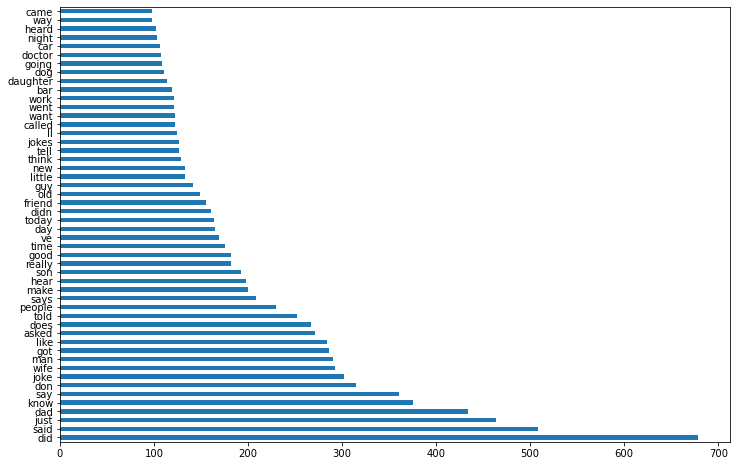

In [17]:
fig = plt.figure(figsize=(12,8))
Xcv_djdf.sum().sort_values(ascending=False).head(50).plot(kind='barh')

In [18]:
cvec_aj = CountVectorizer(stop_words='english')
Xcv_aj = cvec_aj.fit_transform(X_aj,y_aj)
Xcv_ajdf = pd.DataFrame(Xcv_aj.todense(),columns=cvec_aj.get_feature_names())
Xcv_ajdf.head()

,00,000,00000000000000000000000000000001,00100000,003,006,00653875954571505539843239754513915896150297878399377056071435169747221107988,007,01,01100001,...,𝗺𝗶𝘀𝗹𝗲𝗮𝗱𝗶𝗻𝗴,𝗺𝗼𝗿𝗻𝗶𝗻𝗴,𝘀𝗮𝘆,𝘀𝗼𝘂𝗿𝗰𝗲𝘀,𝘀𝘁𝗮𝘁𝗲𝗱,𝘁𝗴𝗲𝘂𝗿,𝘁𝗵𝗲,𝘁𝗵𝗶𝘀,𝘁𝗼,𝘄𝗼𝗿𝗸𝗲𝗿
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [19]:
#fig = plt.figure(figsize=(12,8))
list20 = list(zip(list(Xcv_ajdf.sum().sort_values(ascending=False).head(20).keys()),list(Xcv_ajdf.sum().sort_values(ascending=False).head(20))))
word20 = [i for i,j in list20]
dadcount20 = [j for i,j in list20]
anticount20 = [Xcv_djdf[i].sum() for i in word20]
anticount20
#df20 = pd.DataFrame({'word':list20[:][0],'dadcount':})

[678,
 290,
 284,
 119,
 464,
 315,
 2,
 375,
 361,
 208,
 79,
 302,
 230,
 175,
 40,
 508,
 267,
 16,
 141,
 165]

In [20]:
list20 = list(zip(list(Xcv_djdf.sum().sort_values(ascending=False).head(20).keys()),list(Xcv_djdf.sum().sort_values(ascending=False).head(20))))
word20 = [i for i,j in list20]
dadcount20 = [j for i,j in list20]
anticount20 = [Xcv_djdf[i].sum() for i in word20]
anticount20

[678,
 508,
 464,
 434,
 375,
 361,
 315,
 302,
 292,
 290,
 286,
 284,
 271,
 267,
 252,
 230,
 208,
 200,
 198,
 192]

In [21]:
X_all = jokes_all['full_text']
cvec_all = CountVectorizer(stop_words='english')
Xcv_all = cvec_all.fit_transform(X_all,jokes_all['dad'])
Xcv_alldf = pd.DataFrame(Xcv_all.todense(),columns=cvec_all.get_feature_names())
Xcv_alldf['dadjoke_flag'] = jokes_all['dad']
Xcv_20 = Xcv_alldf[word20+['dadjoke_flag']].groupby('dadjoke_flag').sum()

In [22]:
Xcv_alldf[Xcv_alldf['pink'] > 100][['pink']]

,pink
6808,399
9956,134


In [23]:
jokes_all.iloc[6808]['selftext']

'A man walks down a pink sidewalk and up the pink walkway to the pink door of a pink bed and breakfast. He presses the pink doorbell and peers through a small gap in the pink curtains as a woman in a pink dress, pink hat and pink high heels walks down the pink hallway towards him. She opens the pink door and greets him with a big smile from behind her pink lipstick laden lips. "Welcome to The Pink House good sir! Follow me, I will show you to your room." The man follows the pink maiden down the pink hallway past various pink paintings, pink tables set atop plush pink carpeting and  covered in pink flowers and pink knickknacks. They walk up 3 flights of pink stairs, down a long pink hallway past 4 pink doors before arriving at his pink room. He shuffles through the pink door and sets his suitcase on a small pink bench at the foot of his fluffy pink bed. The bed covered in a plethora of frilly pink pillows. He walks over to the pink window and pulls apart the pink curtains so he could lo

In [24]:
XcvT20 = Xcv_20.T
XcvT20['sum'] = XcvT20[0] + XcvT20[1]
XcvT20 = XcvT20.sort_values('sum',ascending=False)
XcvT20.index

Index(['did', 'man', 'just', 'like', 'know', 'say', 'don', 'said', 'joke',
       'says', 'people', 'dad', 'does', 'got', 'wife', 'asked', 'make', 'told',
       'hear', 'son'],
      dtype='object')

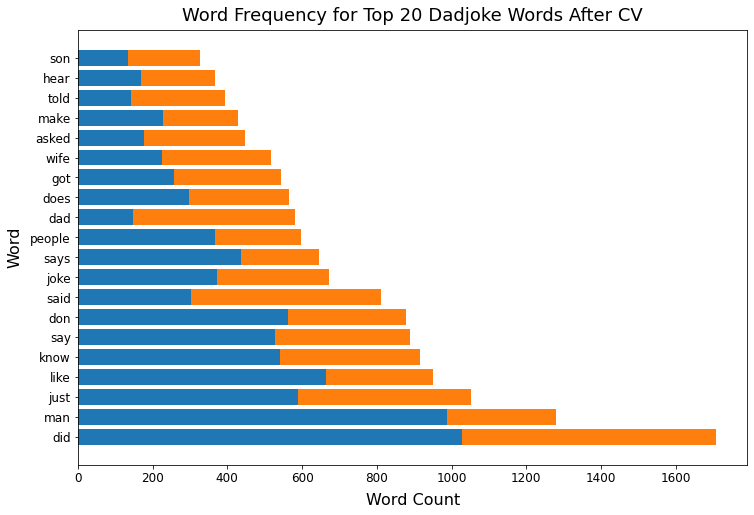

In [25]:
fig = plt.figure(figsize=(12,8))
plt.title('Word Frequency for Top 20 Dadjoke Words After CV', fontsize = 18, pad = 9)
#XcvT20.iloc[:,:2].plot(kind='barh',stacked=True)
plt.barh(list(XcvT20.index),[x for x in XcvT20[0]],label='Dadjokes')
plt.barh(list(XcvT20.index),[x for x in XcvT20[1]],left=[x for x in XcvT20[0]],label='Anitjokes')
plt.xlabel('Word Count',fontsize = 16, labelpad = 8)
plt.xticks(fontsize=12)
plt.ylabel('Word', fontsize = 16, labelpad = 8)
plt.yticks(fontsize=12);


<AxesSubplot:>

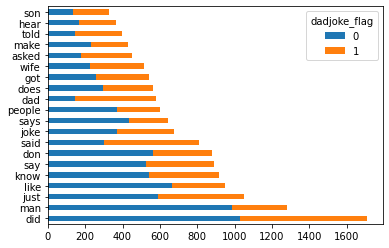

In [26]:
XcvT20.iloc[:,:2].plot(kind='barh',stacked=True)

In [27]:
# plt.figure(figsize=(10,6))
# ax = sns.barplot(x = Xcv_alldf[[list20]],y=)

In [28]:
top50_aj = list(Xcv_ajdf.sum().sort_values(ascending=False).head(50).index)
top50_dj = list(Xcv_djdf.sum().sort_values(ascending=False).head(50).index)
top100_aj = list(Xcv_ajdf.sum().sort_values(ascending=False).head(100).index)
top100_dj = list(Xcv_djdf.sum().sort_values(ascending=False).head(100).index)


In [29]:
stop_dad = ['dad','son','daughter','son','anti','antijokes','antijoke']
english_stop = list(stopwords.words('english')) + stop_dad

In [31]:
stop_50, stop_100 = stop_dad[:], stop_dad[:]
for aj in top50_aj:
    if aj in top50_dj:
        stop_50.append(aj)
for aj in top100_aj:
    if aj in top100_dj:
        stop_100.append(aj)
        


In [ ]:
pipe_cvnb = Pipeline([
    ('cvec', CountVectorizer() ),
    ('nb', MultinomialNB())
])
pipe_cvnb_params = {
    'cvec__min_df': [2,3,4,5,6,7],
    'cvec__stop_words': [stop_dad],
    'cvec__ngram_range': [(1,6)]
}

In [23]:
gs = GridSearchCV(pipe_cvnb,pipe_cvnb_params,cv =5,verbose=10,n_jobs=-1)
gs.fit(X_train,y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  11 out of  30 | elapsed:    6.7s remaining:   11.6s
[Parallel(n_jobs=-1)]: Done  15 out of  30 | elapsed:   10.1s remaining:   10.1s
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:   10.3s remaining:    5.9s
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:   10.5s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:   12.4s remaining:    1.3s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.4s finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('cvec', CountVectorizer()),
                                       ('nb', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'cvec__min_df': [2, 3, 4, 5, 6, 7],
                         'cvec__ngram_range': [(1, 6)],
                         'cvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [24]:
gs.score(X_train, y_train), gs.score(X_test, y_test)

(0.876926259178819, 0.707196029776675)

In [25]:
gs.best_params_

{'cvec__min_df': 2,
 'cvec__ngram_range': (1, 6),
 'cvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

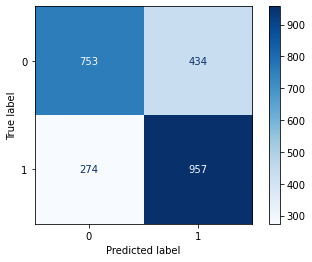

In [26]:
preds = gs.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
plot_confusion_matrix(gs, X_test, y_test, cmap='Blues');


In [27]:
tvec = TfidfVectorizer()
X_train_df = pd.DataFrame(tvec.fit_transform(X_train).todense(), 
                          columns=tvec.get_feature_names())

In [28]:
pipe_tvec = Pipeline([
    ('tvec', TfidfVectorizer()),
    ('nb', MultinomialNB() )
])

pipe_tvec_params = {
    'tvec__stop_words': [stop_dad],
    'tvec__min_df': [1, 2, 3],
    'tvec__ngram_range': [(1,1), (1,2),(1,3)]
}

In [29]:
gs_tf = GridSearchCV(pipe_tvec, pipe_tvec_params, cv = 5,verbose=10,n_jobs=-1)
gs_tf.fit(X_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  27 out of  45 | elapsed:    3.2s remaining:    2.1s
[Parallel(n_jobs=-1)]: Done  32 out of  45 | elapsed:    3.5s remaining:    1.3s
[Parallel(n_jobs=-1)]: Done  37 out of  45 | elapsed:    4.3s remaining:    0.9s
[Parallel(n_jobs=-1)]: Done  42 out of  45 | elapsed:    4.8s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    5.1s finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                       ('nb', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'tvec__min_df': [1, 2, 3],
                         'tvec__ngram_range': [(1, 1), (1, 2), (1, 3)],
                         'tvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [30]:
gs_tf.score(X_train, y_train), gs_tf.score(X_test, y_test)

(0.9053676698727893, 0.7303556658395368)

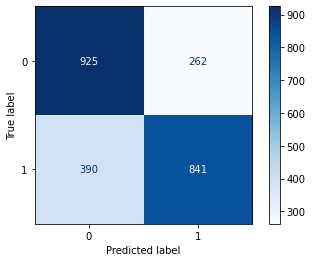

In [31]:
preds = gs_tf.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
plot_confusion_matrix(gs_tf, X_test, y_test, cmap='Blues');


In [32]:
gs_tf.best_params_

{'tvec__min_df': 2,
 'tvec__ngram_range': (1, 2),
 'tvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [33]:
logcv_pipe = Pipeline([
    ('tvec', TfidfVectorizer()),
    ('lr', LogisticRegression())
])
# pipe_logcv_params = {
#     'cvec__max_features': [2000, 3000, 4000, 5000],
#     'cvec__min_df': [1, 2, 3],
#     'cvec__max_df': [.9, .95],
#     'cvec__stop_words': [None, 'english'],
#     'cvec__ngram_range': [(1,1), (1,2), (1,3)],
#     'lr__penalty': ['none'],
#     'lr__max_iter': [50000]
# }
pipe_logcv_params = {
    'tvec__stop_words': [stop_dad],
    'tvec__min_df': [1, 2, 3],
    'tvec__ngram_range': [(1,1), (1,2),(1,3)],
    'lr__penalty': ['none'],
    'lr__max_iter': [100000],
    'lr__solver':['sag']
}

In [34]:
gs_logcv = GridSearchCV(logcv_pipe, pipe_logcv_params, cv = 5,verbose=10,n_jobs=-1)

gs_logcv.fit(X_train, y_train)



Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  27 out of  45 | elapsed:  1.6min remaining:  1.0min
[Parallel(n_jobs=-1)]: Done  32 out of  45 | elapsed:  1.6min remaining:   38.7s
[Parallel(n_jobs=-1)]: Done  37 out of  45 | elapsed:  1.7min remaining:   22.1s
[Parallel(n_jobs=-1)]: Done  42 out of  45 | elapsed:  1.8min remaining:    7.7s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  1.8min finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                       ('lr', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'lr__max_iter': [100000], 'lr__penalty': ['none'],
                         'lr__solver': ['sag'], 'tvec__min_df': [1, 2, 3],
                         'tvec__ngram_range': [(1, 1), (1, 2), (1, 3)],
                         'tvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [35]:
gs_logcv.score(X_train, y_train), gs_logcv.score(X_test, y_test)

(0.9989657668838556, 0.7448304383788255)

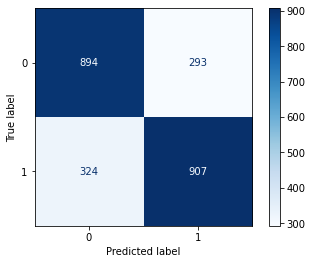

In [36]:
# preds = gs_logcv.predict(X_test)

# tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
# plot_confusion_matrix(gs_logcv, X_test, y_test, cmap='Blues');


In [37]:
# gs_logcv.best_params_

{'lr__max_iter': 100000,
 'lr__penalty': 'none',
 'lr__solver': 'sag',
 'tvec__min_df': 1,
 'tvec__ngram_range': (1, 3),
 'tvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [38]:
# for i,j in zip(gs_logcv.best_estimator_[0].get_feature_names(),gs_logcv.best_estimator_[1].coef_[0]):
#     print(i,j)

00 1.8714307281803344
00 all -1.989783650736573
00 all in -1.989783650736573
00 in 0.9582781717413374
00 in the 0.9582781717413374
00 of 2.0698707197532458
00 of them 2.0698707197532458
00 ranji 1.0332178679172141
00 ranji is 1.0332178679172141
000 -7.301695971498796
000 000 -0.1245804499019256
000 000 000 -0.054973351592590126
000 000 003 -0.14403232153575393
000 000 africa -0.38480589916013325
000 000 air -0.054973351592590126
000 000 and -0.0024172189334022848
000 000 cases -0.18576848524915235
000 000 in 0.6542092368607579
000 003 -0.14403232153575393
000 003 50 -0.14403232153575393
000 94 -0.23562040676468662
000 94 he -0.23562040676468662
000 africa -0.38480589916013325
000 africa 44 -0.38480589916013325
000 air -0.054973351592590126
000 air traffic -0.054973351592590126
000 and -1.384101053464546
000 and as -0.0853376965243388
000 and has -1.2316202169841963
000 and one -0.10637882348841884
000 and signs -0.0024172189334022848
000 and you -0.10637882348841884
000 are -0.10637882

1993 2.0804459092478016
1993 bat -0.2111350994645839
1993 bat out -0.2111350994645839
1993 gt 0.4511766817995263
1993 gt tim 0.4511766817995263
1993 movie 2.0044515350955265
1993 movie groundhog 2.0044515350955265
1996 -1.4880078209766399
1996 is -1.4880078209766399
1996 is hundred -1.4880078209766399
1999 1.2438266567073757
1999 was 1.2438266567073757
1999 was year 1.2438266567073757
19th -0.17613411043236882
19th century -0.17613411043236882
19th century cruising -0.17613411043236882
1j2yolqm2yc -0.2722527190068104
1j2yolqm2yc https -0.1361263595034052
1j2yolqm2yc https www -0.1361263595034052
1million 1.1085613941774493
1million dollars 1.1085613941774493
1million dollars selling 1.1085613941774493
1m² 1.3917104083733898
1m² 1s² 1.3917104083733898
1m² 1s² class 1.3917104083733898
1qql6muh5sq -0.27603993014018496
1st 2.610178614741948
1st https 1.122572911922326
1st https www 1.122572911922326
1st is 1.6041860491536544
1st is international 1.6041860491536544
1s² 1.3917104083733898
1s

5g networking 0.6352888817331384
5g networking installed 0.6352888817331384
5q 2.897586376262937
5q plus 1.4487931881314684
5q plus 5q 1.4487931881314684
5q you 1.4487931881314684
5q you re 1.4487931881314684
5th -0.6406375524749468
5th day -0.597538929404425
5th day if -0.597538929404425
5th floor 1.078532737026774
5th floor twice 1.078532737026774
5th from -0.008148306637568386
5th from the -0.008148306637568386
5th time -1.182000220155462
5th time asking -1.182000220155462
5y 1.1004431174934721
5y this 1.1004431174934721
5y this morning 1.1004431174934721
5yo 0.5224414136234758
5yo so 0.5224414136234758
5yo so proud 0.5224414136234758
60 0.03911895123455205
60 000 -1.0896502366542973
60 000 flies -1.0896502366542973
60 but -0.8201553855092264
60 but in -0.8201553855092264
60 foot -0.15664867659017295
60 foot mark -0.15664867659017295
60 frames -0.3486572734985508
60 frames per -0.3486572734985508
60 ft 0.9802030292519981
60 ft lbs 0.9802030292519981
60 mph 0.9323065746739513
60 mph 

about out said -0.24883861698552034
about palindromes -1.7215172155177751
about palindromes backwards -1.7215172155177751
about pedophile -0.8873890636489646
about pedophile driving -0.8873890636489646
about personal -0.12385828073577758
about personal struggles -0.12385828073577758
about pouring -0.0036713974302553277
about pouring you -0.0036713974302553277
about prejudice 0.5727847237558009
about prejudice and 0.5727847237558009
about purple 1.3390243633967627
about purple brains 1.3390243633967627
about relationships -3.25670896823179
about relationships from -1.648972390976234
about relationships uh -1.7531933890160027
about retired 1.5965407996258756
about retired people 1.5965407996258756
about reverse 2.019203530834553
about reverse psychology 2.019203530834553
about room 1.2303664969115624
about room he 1.2303664969115624
about said 1.5320556282586504
about said well 1.5320556282586504
about salt -3.7628009651044447
about salt do -3.7628009651044447
about sausages 0.3432996371

actor 1.2239425933027115
actor and -0.843339839563132
actor and the -0.843339839563132
actor donnie 1.9393801889790536
actor donnie yen 1.9393801889790536
actor gets 0.7540708288515935
actor gets in 0.7540708288515935
actor he -0.0024172189334022848
actor he takes -0.0024172189334022848
actor just -0.0024172189334022848
actor just wait -0.0024172189334022848
actor named 1.048469606033413
actor named bic 1.048469606033413
actor say -0.5818573087506747
actor say break -0.5818573087506747
actor to 0.8732211045576138
actor to play 0.8732211045576138
actor who -0.6751355765711703
actor who fell -1.4536752137835023
actor who plays 0.8209579732848187
actors 0.7738703192759293
actors to 0.05806011603197472
actors to break 0.05806011603197472
actress 0.19415520939202138
actress cross -1.1768375271911982
actress cross paths -1.1768375271911982
actress from -0.8254897721187936
actress from legally -0.8254897721187936
actress gets -0.7863522692599398
actress gets fired -0.7863522692599398
actress 

after life 0.7498104829362303
after life weapons 0.7498104829362303
after long -0.1365857536224905
after long flight -0.29284929721588465
after long night 0.4479508856135155
after long reflexion -0.30245739446882225
after major 1.1504333231754789
after major accidents 1.1504333231754789
after making -1.4255059025273125
after making sweet -1.4255059025273125
after many 0.7940655165015821
after many years 0.7940655165015821
after march 1.9134475894411735
after masturbating -1.6087828855101893
after masturbating over -1.6087828855101893
after mating 2.2234756588686406
after mating that 1.44048351280425
after mating their 0.8939801431829507
after midnight 0.44705892225295335
after midnight that 0.6883353161613175
after midnight the -0.22130906918445023
after moment 0.804720275407052
after moment of 0.5917210607929135
after moment replied 0.24894103402802395
after months -0.19800125106851865
after months he -0.19800125106851865
after more 0.4511766817995263
after more than 0.451176681799526

alas it was -0.8321927883266761
alas you 0.47350690335566364
alas you have 0.47350690335566364
alaska 1.8310858432706723
alaskan 1.1096806006269964
alaskan cowboy 2.037700266786545
alaskan cowboy person 2.037700266786545
alaskan river -0.8784571772131947
alaskan river to -0.8784571772131947
albanian -1.3435887037878955
albanian border -1.3435887037878955
albanian border patrol -1.3435887037878955
albert 3.6575607663307848
albert einstein 2.03315977661386
albert einstein and -2.081954180937408
albert einstein as 0.7008325549479189
albert einstein drinking 1.79813316161851
albert einstein evil 1.8335977907264307
albert zweistein 1.79813316161851
album 2.447635142785413
album do 1.393075290166965
album do crabs 1.393075290166965
album inside 0.8044357221379933
album inside by 0.8044357221379933
album of -0.7650184278592695
album of 1993 -0.2111350994645839
album of all -0.5879466232761925
album written 0.8044357221379933
album written on 0.8044357221379933
albums 1.0685331829250844
albums

alligator can only -1.2191479489051023
alligator crocodiles -1.2026245450999244
alligator crocodiles have -1.2026245450999244
alligator for 0.35766586713746096
alligator for dinner 0.35766586713746096
alligator in 1.0622697456472243
alligator in vest 1.0622697456472243
alligator it 2.127573914509482
alligator it depends 2.127573914509482
alligator pay 1.459753962783103
alligator pay attention 1.459753962783103
alligator pit -0.6683676877980911
alligator pit very -0.6683676877980911
alligator that 1.1210450884672445
alligator that invests 1.1210450884672445
alligator the 1.4038761021565112
alligator the crocodile 1.4038761021565112
alligator then -1.2191479489051023
alligator then you -1.2191479489051023
alligator this -1.4832775523797588
alligator this isn -1.4832775523797588
alligator use 1.8658377672656667
alligator use croc 1.8658377672656667
alligator walks -1.2695236519826318
alligator walks into -1.2695236519826318
alligator you 1.4038761021565112
alligator you won 1.403876102156

am insecure about -0.9079140292393094
am iron -0.4233081093676676
am iron man -0.4233081093676676
am joke -1.8960129774240309
am joke to -1.8960129774240309
am just -0.5031780542550082
am just bring -0.46142238415177406
am just incredibly -0.9142552923630041
am just making 0.8629119914060287
am just picking -0.4052844430730745
am just sell 0.5928705018949398
am just wanna -0.2545835969142589
am know -0.061474774473544914
am know what -0.061474774473544914
am lactose 2.7596383169357455
am lactose intolerant 2.7596383169357455
am leaving -2.799724033057374
am leaving this -2.3435635687686145
am leaving you -0.5722518316503628
am liable -1.736119518829384
am liable for -1.736119518829384
am liar -0.9900928455916242
am literally -0.008929460097754431
am literally crying -0.008929460097754431
am locked -0.1437164224914942
am locked in -0.1437164224914942
am looking 0.6299325552860082
am looking for 0.6299325552860082
am mackerel -1.1771744816068543
am making -0.5860010373644865
am making ho

an attractive human -0.590634666284539
an attractive young -0.7554087683932718
an auntie -3.4987412015900468
an auntie joke -1.2614327104240368
an auntie this -2.393575368348632
an australian 2.4687988580560134
an australian and -1.3138470966632398
an australian cooking 0.7269184521032253
an australian family 2.5184302200995767
an australian who 0.8013390987387411
an autobiography 0.9408443965003345
an autobiography his 0.9408443965003345
an automatic 0.014491037713419686
an automatic card 0.5169945876736985
an automatic rifle -0.5018563259788181
an avalanche -2.2637693300718142
an average 3.8496939862729533
an average kid 0.8161948456584257
an average of 1.560892571113119
an average parent 0.6696123815670998
an average pursuit 1.8161196799090953
an average sized -0.5087356344384796
an avocado -0.4509410998233846
an avocado and -0.4509410998233846
an award -1.8265190354625969
an award because -0.7212753421393381
an award the -1.1868228697586845
an awesome 1.0919552459419242
an awesome 

and approaches -0.7783287139509314
and approaches how -0.7783287139509314
and ar -0.5403113326245669
and ar int -0.5403113326245669
and are -1.7348184890844398
and are all -0.008512928460904812
and are building 0.5315083429895167
and are capable -0.37330889698574393
and are difficult -0.17803991234778685
and are gonna -0.7452608384595749
and are having -0.048500163578251106
and are in -0.013369598371764154
and are not -0.7649721600538901
and are numbers -0.0433420152825043
and are quite -0.013369598371764154
and are reported 0.6073595400093094
and are something -0.3140085338316513
and are therefore -1.2750435690550208
and are unable -0.013369598371764154
and are watching 0.5127698322214672
and aren -0.97462791818235
and aren so -0.97462791818235
and arguing 0.942669721618552
and arguing with 0.942669721618552
and arms 1.6466797494881653
and arms got 1.6466797494881653
and arnold -0.33510469623440764
and arnold schwarzenegger -0.33510469623440764
and around 1.7011865177653096
and around

and etc she 0.7498104829362303
and ethics -0.40713880856744317
and ethics tries -0.40713880856744317
and evaporated 2.1153499360004737
and evaporated he 2.1153499360004737
and eve 3.0199640266462584
and eve do 1.5401808269945643
and eve it 1.3990811745708913
and eve the 0.25634386323313463
and even 0.9891751224504605
and even at 1.6974433270954608
and even cuts 0.5383627611946714
and even fix 0.42980089165904756
and even invited -0.03690830247809092
and even offered 0.46732658441480934
and even pink -0.010686034063398854
and even sparked -1.196165942988431
and even starts -0.03474903804947585
and even this -0.19800125106851865
and even though -0.4520550180800252
and eventual -0.10026540925054234
and eventual suicide -0.10026540925054234
and eventually -1.266806539516074
and eventually acts -0.008512928460904812
and eventually curiosity -0.19800125106851865
and eventually died -0.5201967317191145
and eventually he -0.0187576450337412
and eventually makes -0.3045424399955349
and eventual

and jump 1.7782062691704845
and jump higher 2.1855759086023583
and jump in -0.3279482919645555
and jumped -0.19802668717090263
and jumped out -0.19802668717090263
and just -1.0334583449291936
and just don -0.16838796942015266
and just eats -0.0021372068126797664
and just feel -0.842446350001486
and just feeling -0.06329394561782707
and just found 0.450295243560267
and just had 0.9626964978082548
and just leave -0.45064141979826033
and just let 0.35966924023538727
and just like -0.06932516782238483
and just misses -0.06978174566778933
and just moved 0.7469411239915852
and just overall 0.9474175601289507
and just sat -0.23991584510918948
and just says -1.39387655246253
and just smiled -0.5366593261354259
and just surprised -1.158070325516419
and just then 0.4479508856135155
and just want -0.47961256148670556
and just wasting -0.0995505731999343
and just when 0.2969573439786926
and justice -0.843568665828151
and justice it -0.843568665828151
and kangaroo -2.238933230041177
and kangaroo du

and possible criminal -0.46270411537189926
and possibly -0.4628866559631811
and possibly apply -0.24364506140558043
and possibly have -0.23991584510918948
and potato -0.0389022947467793
and potato walk -0.0389022947467793
and potentially -0.2424698457913584
and potentially start -0.2424698457913584
and poured -0.6288943169346664
and poured it -0.6288943169346664
and pouring 0.450295243560267
and pouring the 0.450295243560267
and pours -0.569345588634203
and pours everywhere -0.24611050871294593
and pours generous -0.18657142239668725
and pours him -0.18155766505024812
and powdery 3.003659198051323
and powdery instant 3.003659198051323
and practice -0.2530378119773162
and practice and -0.2530378119773162
and practiced -0.08250217021074419
and practiced proper -0.08250217021074419
and practices 0.16952968235050675
and practices 1910 0.16952968235050675
and pray -0.4690469978054831
and pray for -0.4690469978054831
and predict -0.06932516782238483
and predict your -0.06932516782238483
and 

and swung 1.6732270969551337
and swung from 1.6732270969551337
and sydney -1.2193395489188446
and sydney opera -1.2193395489188446
and synonym 0.4886300075384435
and synonym toast 0.4886300075384435
and table 8.091693868672845
and table and 8.091693868672845
and tad 0.7247716764080511
and tad pole 0.7247716764080511
and taguette 1.183863351643919
and tail -0.030175590368845533
and tail the -0.030175590368845533
and take -0.3528509804153057
and take an -0.42887575638330366
and take bow -0.0239256266778779
and take care -0.010458627214729137
and take half 1.649742652966012
and take out -1.5855644290805608
and takes -0.7939475198842839
and takes 20 -0.10221957646628564
and takes another -0.0036713974302553277
and takes shower -0.025010847999761412
and takes the -0.7479596003301225
and tanner -0.10026540925054234
and tanner as -0.10026540925054234
and tapped 0.6422245710444228
and tapped on 0.6422245710444228
and tases -0.0006724472871667142
and tases patient -0.0006724472871667142
and tas

and zippo one 1.5513517253989841
and zippo the 1.2863845391922344
and zippo zippo 0.8678309601572767
and zippo zippy 0.5115181279417589
and zombies -1.043114960381706
and zombies don -1.043114960381706
anders -3.311448557354438
anders tegnell -3.311448557354438
anderson 0.37530327030465416
anderson said 0.18765163515232708
anderson said can 0.18765163515232708
anderson was 0.18765163515232708
anderson was peruvian 0.18765163515232708
andersons -0.49164982831025367
andersons that -0.49164982831025367
andersons that their -0.49164982831025367
andrea -1.7106198355976951
andrea bocelli -1.7106198355976951
andrea bocelli got -1.7106198355976951
andreas 1.0845335985780935
andreas fault 1.0845335985780935
android_app -0.3102349153020084
android_app amp -0.3102349153020084
android_app amp utm_source -0.3102349153020084
andthe -1.0533616360263671
andthe list -1.0533616360263671
andthe list said -1.0533616360263671
andy -0.9544322406341383
andy serkis -0.9544322406341383
andy serkis they -0.9544

any points because -1.4910979937566848
any posts 2.625576423571687
any posts all 2.625576423571687
any problems 2.7404702411909367
any problems don 0.5051415123988889
any problems here 0.8629119914060287
any problems said 0.7942540742258036
any programming -0.3202268046221651
any programming knowledge -0.3202268046221651
any protection -0.8256537365035815
any protection it -0.8256537365035815
any pudding -0.5606346745710326
any pudding if -0.5606346745710326
any qualifications 0.8450869480314295
any qualifications to 0.8450869480314295
any real -2.415155622535721e-05
any real damage -2.415155622535721e-05
any reason -1.0798653935632831
any reason why -1.0798653935632831
any restaurant -0.9217812714357879
any restaurant meal -0.9217812714357879
any rocks -0.3603464753301501
any rocks in -0.3603464753301501
any roundish -1.0143833849560682
any roundish object -1.0143833849560682
any scuba -1.3801718166384094
any scuba gear -1.3801718166384094
any second -0.3556870220600594
any second say

architect -1.366191363733154
architect need -1.366191363733154
architect need pyramid -1.366191363733154
architects 1.7073838180453902
architects in 1.7073838180453902
architects in heaven 1.7073838180453902
archived -0.2692363370713744
archived survey -0.2692363370713744
archived survey results -0.2692363370713744
arctic 1.983189608786274
arctic and 1.983189608786274
arctic and an 1.983189608786274
are -0.4413448861950834
are 10 1.2645913123600259
are 10 570 -0.02361840410971875
are 10 people -1.091665325474735
are 10 types 2.429533914473941
are 255 -0.5083953031231018
are 255 days -0.5083953031231018
are 365 -1.0093120806496583
are 365 people -1.0093120806496583
are 50 1.3346049270266143
are 50 off 1.3346049270266143
are about -0.0006724472871667142
are about to -0.0006724472871667142
are absent -1.040083122812905
are absent minded -1.040083122812905
are absolutely -2.3624105301386686
are absolutely incompatible -0.7623527340812816
are absolutely massive -1.7651032899689432
are absol

are two muffins -1.746366116419552
are two separate -0.17803991234778685
are two things -1.0484685111443537
are two types 1.8977818860436388
are types -3.4576144936217763
are types of -3.4576144936217763
are uck -0.02361840410971875
are uck all -0.02361840410971875
are unable -2.2057630893718305
are unable to -2.2057630893718305
are under -0.04086149931545861
are under arrest -0.04086149931545861
are unwritten 2.8325389279694506
are unwritten rules 2.8325389279694506
are used -1.3680186888106765
are used and -1.3680186888106765
are useless 1.0039584508256487
are useless always 1.0039584508256487
are vegetables -1.2992724420899622
are vegetables they -1.2992724420899622
are very -1.4028417871310477
are very confused -0.27214798978179505
are very efficient -0.7946122437947816
are very hairy -1.0432235332023303
are very high 1.025861573704779
are very intelligent 0.4145900739090302
are very mathematical 1.83501358247026
are very useful -0.3140085338316513
are very weird -2.518738179146644

as covid -1.5317089965003137
as covid 19 -0.41347273528926426
as criteria 1.0865984347767024
as criteria they 1.0865984347767024
as culturally -1.5523191165965466
as culturally relevant -1.5523191165965466
as cut -0.6764397385720292
as cut and -0.6764397385720292
as daddy -0.5210945988820611
as daddy it -0.5210945988820611
as daniel -0.008512928460904812
as daniel mario -0.008512928460904812
as did 0.3261040425387019
as did he 0.3261040425387019
as dirt 0.8565667922704568
as dirt but 0.8565667922704568
as dj -1.4191631311518835
as do -0.7810915700238399
as do now -0.7810915700238399
as dogs 0.8252961302133054
as dogs they 0.8252961302133054
as don -1.0759500499380208
as don want -1.0759500499380208
as drug -0.1765353268365136
as drug dealing -0.1765353268365136
as easy 1.0046578147476055
as easy as 1.0046578147476055
as eczema -0.24364506140558043
as eczema eczema -0.24364506140558043
as einstein -0.1280406686905356
as einstein goes -0.1280406686905356
as emergency -0.03474903804947585

asked him if -0.6770270036458648
asked him in 1.0365526255677913
asked him right -1.2376532300339793
asked him to 0.512476170799086
asked him what -0.5174898914463282
asked him where 0.28334468027840864
asked him why 0.37027988683168356
asked his 2.457436685742265
asked his brother 0.8331108215132089
asked his bud 0.9898512548966363
asked his if 0.4062514130225591
asked his teacher -0.09633877981309569
asked his veteran 0.646537214738249
asked how 1.6806385521736829
asked how he 0.965681335681569
asked how his -0.240747148057699
asked how my 0.3216397211139393
asked how she 0.8475442210027532
asked how was 0.5381745105376331
asked how we 0.5178701403297945
asked how would -0.981792805641165
asked if -1.6253401687997715
asked if could 1.0707292435735185
asked if dog -1.664767039788045
asked if glass -1.5342152427306701
asked if he -2.202961538565734
asked if it -1.5084397161088723
asked if knew 1.1963843461589718
asked if lance -0.0024172189334022848
asked if she 2.425813996044337
asked

at gas 1.9971627776286003
at gas station 1.5335128858439182
at gas stations 0.5526376378551275
at gift -0.061474774473544914
at gift shop -0.061474774473544914
at glue 0.8167823902495112
at glue factories 0.8167823902495112
at golf 0.8334894540442181
at golf par 0.8334894540442181
at google -1.1130125835664426
at google earth -1.1130125835664426
at great -0.9152558248150742
at great cost -0.9152558248150742
at grillhouse 1.3145071984918142
at grillhouse serial 1.3145071984918142
at grocery 0.34515505408542946
at grocery store 0.34515505408542946
at gunpoint -1.179175042117844
at gunpoint by -1.179175042117844
at halloween 1.2566697466483359
at halloween party 1.2566697466483359
at harvard -0.010900614785711596
at harvard alright -0.0024943293327262363
at harvard his -0.008512928460904812
at haunted 1.0731735335438948
at haunted house 1.0731735335438948
at he -1.7343979141295311
at he quickly -1.7343979141295311
at heart -0.008512928460904812
at heart boy -0.008512928460904812
at her -1

australia city -2.087503243520268
australia dead -1.1420106995399322
australia dingo 1.4407058090965668
australia dingo as 1.4407058090965668
australia force -0.24883861698552034
australia force feeding -0.24883861698552034
australia specifically 0.4145900739090302
australia specifically southern 0.4145900739090302
australia tell 0.8880812089124749
australia tell you 0.8880812089124749
australia very 0.4145900739090302
australia very specifically 0.4145900739090302
australian 5.303516197340349
australian and -1.3681288702407157
australian and american -0.1153875295672867
australian and kenyan -1.3138470966632398
australian beer 0.9966365555396719
australian beer when 0.9966365555396719
australian cooking 0.7269184521032253
australian cooking show 0.7269184521032253
australian cross 0.4145900739090302
australian cross country 0.4145900739090302
australian detective 1.8599129755536434
australian detective climbing 0.9299564877768217
australian detective we 0.9299564877768217
australian f

back to their -0.0021372068126797664
back to town -0.14902636336587607
back to upvotes -0.008929460097754431
back to visit -0.22174877854281
back to work 1.0491548676065547
back to you 0.3126276875111781
back together -0.9793768306871743
back together the -0.02123517328962025
back two -0.0731026926038442
back two nights -0.0731026926038442
back up 0.04891848883999536
back up the -0.20457303096158322
back watching -0.08347371507160685
back watching everything -0.08347371507160685
back week 1.1959945877496456
back week later 1.1959945877496456
back when -0.4351893815165248
back when cellphones -0.061474774473544914
back when the -0.4052844430730745
back who -0.7516753215271449
back who don -0.7516753215271449
back with 1.1535123629710524
back with beaming 0.3126276875111781
back with me -0.06329394561782707
back with the 0.9087561602475183
back with ton -0.7333813430800337
back with us 0.8637833019545196
back yard -1.780747120253859
back you -2.8083185026686968
back you asshole -1.937875

bar and it -1.42799236147964
bar and its -0.05117264261085664
bar and joined -1.3138470966632398
bar and later -0.9780664730160001
bar and leaves -0.8670119845051873
bar and lots -0.3868202181071798
bar and mauled -0.21603557777283
bar and one -0.17767775525055035
bar and order -0.018780787149180845
bar and ordered -0.703756485029901
bar and orders 4.122931253129456
bar and realizes -0.7175362316366226
bar and sat -0.5445849320947397
bar and say -0.6502520378736034
bar and says 3.7702998254575277
bar and sits -0.14824106494619674
bar and slowly -0.3458258395464979
bar and sneezes -0.2589734925819367
bar and the -1.5246037871240785
bar and then -0.3902000411877565
bar and there 2.072498453644298
bar and they -0.7149744975286654
bar and uh -0.11382158585066955
bar area -0.5981758780909479
bar area of -0.5104481911616988
bar area then -0.1291276928165784
bar as -0.047376448957199786
bar as the -0.047376448957199786
bar asked -2.4368687612515694
bar asked me -2.4368687612515694
bar associa

based upon very 0.5058597171575426
based upon war -2.410821291542934
basement -2.462964747281258
basement and -0.0024172189334022848
basement and enters -0.0024172189334022848
basement behind -0.9518727954080167
basement behind the -0.9518727954080167
basement door -0.20457303096158322
basement door it -0.20457303096158322
basement please -0.1437164224914942
basement please please -0.1437164224914942
basement they -0.8540947970063351
basement they haven -0.8540947970063351
basement to 0.4962594546952417
basement to study 0.4962594546952417
basic -1.1012811980968282
basic business -1.073992594309879
basic business analysis -1.073992594309879
basic decency -0.17798482437789856
basic decency and -0.17798482437789856
basic reasons 0.4145900739090302
basic reasons the 0.4145900739090302
basic stationery -0.3816775629013898
basic stationery items -0.3816775629013898
basically 3.2008251443948454
basically have -1.2587807164214775
basically have no -1.2587807164214775
basically honey 0.8939801

be on there -0.10026540925054234
be one -0.12081691916663981
be one of 0.508876387928504
be one person -0.7882192390062996
be one week -0.4278985594237747
be onepiece 1.6959173676360992
be otter 0.7317418162699058
be otter space 0.7317418162699058
be our 0.4696975754933591
be our family 0.4696975754933591
be outside 0.8044357221379933
be outside right 0.8044357221379933
be over -2.504876693606736
be over 2000 -1.440426090353908
be over easy -1.1763277716639857
be pacific 3.1655585639653605
be painful -0.24364506140558043
be painful and -0.24364506140558043
be part 0.38786925153273244
be part of 0.38786925153273244
be partially -0.15664867659017295
be partially digested -0.15664867659017295
be patched 0.5943210630667137
be patched any 0.5943210630667137
be patient 0.8019753991284365
be patient new 0.8019753991284365
be peas 0.28890557101740905
be peas when 0.28890557101740905
be pepper -0.08571286682864727
be pepper picker -0.08571286682864727
be perfect 1.405700058309584
be performed 0

because his entire -1.5119124012816494
because his is -1.2930778733421255
because his legs 1.8829870153232013
because his lily 2.503260043361533
because his mother -0.08571286682864727
because his parents -1.3435887037878955
because his republican -1.2641665829698558
because his throw 0.26382735218186754
because his was -1.1236107424514408
because his wife -1.5516178420072961
because his words -0.06932516782238483
because his work 1.550950079012634
because horses -0.6862801341577367
because horses don -0.6862801341577367
because how -0.7873726802721814
because how can -0.7873726802721814
because human -0.9286241163976227
because human skull -0.9286241163976227
because humans -0.8643606560817683
because humans always -0.8643606560817683
because if -0.9243712252192935
because if find -0.013369598371764154
because if it 2.372336240934033
because if posted -0.10026540925054234
because if they -1.0630542532772458
because if were 1.431485407945318
because if you -3.667875891059853
because im

been hit -0.16920389760622423
been hit am -0.008929460097754431
been hit by -0.16783171687341128
been hopping -0.3279482919645555
been hopping from -0.3279482919645555
been however -0.31146842522111756
been however he -0.31146842522111756
been hugged -0.0622201074200363
been hugged before -0.0622201074200363
been hurt -0.008929460097754431
been hurt in -0.008929460097754431
been hydrating -1.3637751438562722
been hydrating properly -1.3637751438562722
been illiterate -1.8821565529103446
been in 1.96131920818544
been in contact -0.5373297077907953
been in distress -0.4593548013000359
been in florida 0.7703797255120476
been in jail 0.3851898627560238
been in one -1.1836868926990347
been in terrible 0.8637833019545196
been in the 1.6839330432449644
been in this 0.7741896468053826
been informed -0.0853376965243388
been informed that -0.0853376965243388
been injured 1.2712141561521075
been injured in 1.2712141561521075
been inside 0.450295243560267
been inside until 0.450295243560267
been i

being tall -0.061474774473544914
being tall could -0.061474774473544914
being that -0.10434334339246507
being that one -0.10434334339246507
being the 0.07423561957750165
being the hip 0.3756032280276741
being the next -0.2718955812852893
being the opposite -0.02361840410971875
being thrown -0.11065453459222512
being thrown on -0.11065453459222512
being told -0.21260979924753295
being told the -0.21260979924753295
being towed -1.845347768428255
being towed by -1.845347768428255
being toxic -1.538805080041353
being toxic in -1.538805080041353
being treated -0.8539144705448986
being treated for -0.1291276928165784
being treated like -0.7863522692599398
being ugly -0.473863739749208
being ugly so -0.473863739749208
being under -0.48363123865427204
being under the -0.48363123865427204
being underage -0.15038730296943212
being underage and -0.15038730296943212
being vegan -1.6728168534850096
being vegan it -1.240484021613711
being web 1.1864164448845829
being web designer 1.1864164448845829


between zebra -1.0097689784301898
between zebra book -1.0097689784301898
beverages -0.7483461100381166
beverages consumed -1.567743616457633
beverages consumed in -1.567743616457633
beverages fizzy 1.1797685594421792
beverages fizzy ologist 1.1797685594421792
beverages from -0.4193795999694194
beverages from safe -0.4193795999694194
beverly -0.14093191634162142
beverly hillbillies -0.14093191634162142
beverly hillbillies https -0.14093191634162142
beware -0.8748916731592337
beware the 0.4479508856135155
beware the article 0.4479508856135155
bewildered 0.7549684909809895
bewildered and -0.05117264261085664
bewildered and beat -0.05117264261085664
bewildered hands 0.99972729198818
bewildered hands him 0.99972729198818
bewildered thanks -0.13405542382604735
bewildered thanks the -0.13405542382604735
bewilderment -0.1309518211160459
bewilderment and -0.1309518211160459
bewilderment and says -0.1309518211160459
bey6c2 -1.3528208989239916
bey6c2 ive -0.2719182656095143
bey6c2 ive _been -0.27

bitches dogs -2.852087882078773
bitches whining -0.7546558877990467
bitches whining about -0.7546558877990467
bitcoin 0.6047579148144445
bitcoin that 1.7149883888904565
bitcoin that all 1.7149883888904565
bitcoins -1.296156084600044
bitcoins on -1.296156084600044
bitcoins on it -1.296156084600044
bite 0.7871906000871346
bite all -2.391182036602196
bite all the -2.391182036602196
bite and 0.3216397211139393
bite and go 0.3216397211139393
bite asks -0.3328189326184894
bite asks the -0.3328189326184894
bite but 0.861729994177808
bite but fumanchu 0.861729994177808
bite dude -1.3798267792470145
bite dude thought -1.3798267792470145
bite guess 1.9310108353994597
bite guess the 1.9310108353994597
bite he 0.7688697538047661
bite he got 0.6422812825136676
bite he said 0.5200342801033193
bite he says -0.3328189326184894
bite himself -0.8044281308492186
bite himself on -0.8044281308492186
bite his -0.118051012178894
bite his other -0.059025506089447
bite his own -0.059025506089447
bite in -2.176

bmi -0.10840233851949821
bmi is -0.10840233851949821
bmi is slightly -0.10840233851949821
bmw 0.7342868312892455
bo 0.8044357221379933
bo burnham 0.8044357221379933
bo burnham my 0.8044357221379933
boa 1.1231614063506892
boa constrictor 1.1231614063506892
boa constrictor it 1.1231614063506892
boar -0.4373189802986814
boar ne -0.4373189802986814
boar ne yach -0.4373189802986814
board 5.948313394031977
board as -0.054973351592590126
board as well -0.054973351592590126
board discussing 0.8096989699274105
board discussing friends 0.8096989699274105
board finally -1.1982329126362952
board finally they -1.1982329126362952
board game 2.1702336753863984
board game nahtzee 2.1702336753863984
board games 0.20875016462169343
board games everyday -1.5896436710842927
board games what 1.8077173993698719
board gaming 0.3255108563820341
board gaming dads 0.3255108563820341
board is 1.0681561351623996
board is phasing 1.0681561351623996
board looks 0.8656015923494734
board looks like 0.8656015923494734

both made -1.8578903410616892
both made of -1.8578903410616892
both mammals -1.0302413638189554
both mammals and -1.0302413638189554
both men -1.6489372533211346
both men take -0.02123517328962025
both mentioned -1.1361239333699986
both mentioned in -1.1361239333699986
both might 0.6345158627627993
both might be 0.6345158627627993
both need -1.2851865044685764
both need help -1.2851865044685764
both not -0.8758755945134954
both not lamp -0.8758755945134954
both of -2.1480131687984936
both of his -0.0006724472871667142
both of the 1.6673543085188554
both of them -2.991124115646268
both of us -0.72758961781401
both of which -0.18657142239668725
both parents -0.3683978979827075
both parents are -0.3683978979827075
both paris 2.097670319274815
both paris sites 2.097670319274815
both personify -0.6554773409394933
both personify flying -0.6554773409394933
both peta -0.8631379587378957
both peta and -0.8631379587378957
both poofed -0.597538929404425
both poofed into -0.597538929404425
both pr

breaks down near 0.42980089165904756
breaks down on -1.1433816502339644
breaks down outside -0.010458627214729137
breaks down right -0.025010847999761412
breaks her -0.7002591158430213
breaks her head -0.7002591158430213
breaks into -0.3291109038214937
breaks into tears -0.3291109038214937
breaks out -0.633493252870532
breaks out and -0.633493252870532
breaks several -1.5877774164158183
breaks several laws -1.5877774164158183
breaks stinking 1.529980352667015
breaks stinking peeple 1.529980352667015
breaks the -2.724949926554566
breaks the internet -1.7567147424621432
breaks the pig -1.0899416467791112
breaks up 0.8626265350281545
breaks up as 1.0230942865686117
breaks up scooby -0.12193962183985396
breaks we -0.6043674255729393
breaks we ll -0.6043674255729393
breaks window 1.1262458979986258
breaks window by 1.1262458979986258
breast 1.9514217096617774
breast and 0.1845795680524621
breast and leg 0.9857478786220536
breast and testicle -0.7929242962143371
breast cancer -0.073816604956

build cow 1.5814583696145792
build cow hide 1.5814583696145792
build house 1.5901595386175584
build house plank 1.5901595386175584
build its -0.3191364704652564
build its own -0.3191364704652564
build man 2.070125711206915
build man fire 2.070125711206915
build on -0.5805409653639596
build on the -0.5805409653639596
build tension -1.32587882731295
build tension did -1.32587882731295
build their 2.2793276677232814
build their labyrinths 1.8707798277270653
build their mansion 0.5103511447245489
build up 0.9127585726584166
build wall -1.3701886688794918
build wall zero -1.3701886688794918
builder -0.06932516782238483
builder ain -0.06932516782238483
builder ain got -0.06932516782238483
building 1.9776236437215258
building abandoned -0.12853586331685185
building abandoned today -0.12853586331685185
building am -2.7890262716208127
building am racist -0.019993019868249445
building am racistdon -2.7690332517526315
building an 1.6011212600829874
building an amusement 0.4976664866940023
buildin

but instead it 1.4469815166620794
but instead of 0.4046602259729208
but instead posted -1.9866076076137091
but is -0.3687447164223311
but is simply -0.06932516782238483
but is still -0.09287538024756244
but is unable -0.23562040676468662
but isn -5.927274942060889
but isn dog -0.73613697891558
but isn drinking -0.0036713974302553277
but isn green -0.726287959856704
but isn her -0.025010847999761412
but isn wheelchair -1.7751142847552814
but isn your -3.5186676012719746
but it 7.322663298065938
but it about 1.2890834276180658
but it actually -1.0832168137049674
but it all 0.28428954508279214
but it also -0.24883861698552034
but it been -1.4364491999653228
but it bends -1.70921344325561
but it birch -1.285904804439723
but it broke -1.5580529537736638
but it came -1.4391300492573604
but it clearly 0.31506512140220216
but it completely 0.4696975754933591
but it deep 1.3544094901828725
but it definitely 1.9424123813784642
but it depends 1.5306513981882894
but it did 0.7627860680963287
but i

buy when he 0.6411258197481293
buy you 2.8403134783706214
buy you drink 1.502169525517137
buy you gun -0.18576848524915235
buy you have 1.747876682699864
buy your -1.7975453469332374
buy your bread -1.7975453469332374
buyers -0.061474774473544914
buyers the -0.061474774473544914
buyers the year -0.061474774473544914
buying 3.909705742518813
buying ancient 0.7553789428637527
buying ancient tribe 0.7553789428637527
buying banana -0.6550056174256752
buying banana an -0.6550056174256752
buying excess 1.0181136970468925
buying excess stock 1.0181136970468925
buying goose 1.060058019440949
buying goose the 1.060058019440949
buying my 0.45693897185593274
buying my delorean 0.45693897185593274
buying pure 1.3620785491680834
buying pure bread 1.3620785491680834
buying something 0.4393289544189065
buying something he 0.4393289544189065
buying them -0.6738180928842946
buying them in -0.6738180928842946
buying tickets 0.980244592078991
buying tickets for 0.980244592078991
buys -1.5619779882660856


call coin worth -2.8094407683170157
call colorless 1.978496042471949
call colorless benches 1.978496042471949
call committee 0.3873899082388087
call committee to 0.3873899082388087
call computer 1.3440972848471946
call computer that 1.3440972848471946
call convention 1.9535247133694216
call convention for 1.9535247133694216
call cook 0.8629880742702462
call cook at 0.8629880742702462
call copycat 1.1917263668877789
call copycat french 1.1917263668877789
call country -2.0477410106637355
call country that -2.0477410106637355
call cow -1.3610439425727079
call cow during -0.49331278602305245
call cow in 2.0991625617082565
call cow who 2.1827227519523404
call cow with -4.648745207216204
call cowboy 1.2735557649475329
call cowboy outfit 1.2735557649475329
call crate 1.287712539927071
call crate full 1.287712539927071
call cross -3.325370049783552
call cross between -3.325370049783552
call crystals 1.0140982974963568
call crystals growing 1.0140982974963568
call cute 4.32683881104752
call cut

calls the german 0.5602360394789432
calls the police -1.446159875185669
calls the security -0.10663645989096306
calls them 1.3680376945473993
calls them his 1.3680376945473993
calls to 0.4145900739090302
calls to his 0.4145900739090302
calm 3.9190283758198916
calm doctor -0.4295623024188518
calm doctor johnson -0.4295623024188518
calm down 0.5120178494370429
calm down and -2.415155622535721e-05
calm down he -0.0024172189334022848
calm down mate -0.8958521087413889
calm down your 1.4773973785502612
calm let -0.013369598371764154
calm let just -0.013369598371764154
calm nothing 1.9087331625468715
calm nothing gets 1.9087331625468715
calm poster 0.8793268707590133
calm the -0.10741271459578498
calm the town -0.10741271459578498
calm them -0.008512928460904812
calm them down -0.008512928460904812
calm very 1.0614122182883157
calm very calm 1.0614122182883157
calmed 1.0335659283483962
calmed down 0.24187503901594826
calmed down and -0.4904125907194238
calmed down bit 0.7430906742698488
calm

can talk and -0.7561644506691095
can talk no -0.654655512668316
can talk piece -0.7354605644310244
can talk plus -0.8784571772131947
can talk to -0.3279482919645555
can talk what -1.5595320728669928
can taste -1.560384444371351
can taste this -1.560384444371351
can teleport -0.5613002307688806
can teleport you -0.5613002307688806
can tell 4.772459959948718
can tell by 0.8809066243487559
can tell it 2.684145392597481
can tell just 0.55600540184837
can tell lot -1.129091302981391
can tell people -1.6481987030110252
can tell them -1.7311455350763594
can tell time 1.6210817846077599
can tell was 0.8284126351366357
can tell you 4.722390496958957
can tell young 0.8134259096560399
can the -3.0855176400751723
can the client -0.11065453459222512
can the dinosaur -1.7778579152436826
can the dinosaurs -0.8855575086598103
can the kids -1.4786233115755836
can the midget 2.246151340683732
can the rex -1.5544842974116706
can the unicorn -0.052743237253033454
can these 0.45329004296682696
can these gu

care in -0.10741271459578498
care in face -0.10741271459578498
care less -1.8393170012255335
care less wasn -1.8393170012255335
care must -0.008929460097754431
care must slumber -0.008929460097754431
care of -2.1131087902595076
care of but -0.030175590368845533
care of couple -0.23991584510918948
care of herself -0.22910677755507636
care of joe -0.7946256860768091
care of our -2.274521344725946
care of the -0.13569466495822344
care of this 1.9642385000843297
care of you -0.6237289134703621
care of your -0.3003977842396997
care or -2.3397415488534192
care or something -2.3397415488534192
care routine 0.8463377293623651
care routine and 0.8463377293623651
care so -0.19376571151148658
care so he -0.19376571151148658
care surprise -0.061474774473544914
care surprise the -0.061474774473544914
care that 0.7469411239915852
care that they 0.7469411239915852
care the -0.6344433728293276
care the guy -0.5665991254989288
care the man -0.010458627214729137
care the town -0.10741271459578498
care t

causing 0.3756986749688776
causing him 0.4046390208064004
causing him into -0.03474903804947585
causing him to 0.4473874503945474
causing serious -0.37330889698574393
causing serious harm -0.37330889698574393
causing severe -0.10221957646628564
causing severe childhood -0.10221957646628564
causing the -0.0239256266778779
causing the dog -0.0239256266778779
causing to 0.49155796911585725
causing to develop 0.49155796911585725
caution -1.6743157751467874
caution and -0.7649721600538901
caution and make -0.7649721600538901
caution so -0.9579119469847224
caution so he -0.9579119469847224
caution when -0.08345472494808781
caution when describing -0.08345472494808781
cave 0.577657872022932
cave aged 1.7377380640705655
cave aged cheddar 1.7377380640705655
cave explorer 1.7266526267533442
cave explorer come 1.7266526267533442
cave is -0.035761842273379904
cave is not -0.017880921136689952
cave is so -0.017880921136689952
cave proclaims -0.017880921136689952
cave proclaims of -0.017880921136689

checking correcting 0.6239164782272333
checking correcting algorithm 0.6239164782272333
checking it 1.3007344479070406
checking it was 1.3007344479070406
checking my -0.2767501636479522
checking my other -0.2767501636479522
checking our 1.2299705161311008
checking our ticket 1.2299705161311008
checking out 0.33102745434880254
checking out at 0.33102745434880254
checkmate -1.6884413143384476
checkout -0.9395663255314151
checkout assistant -0.6556046851089707
checkout assistant pays -0.6556046851089707
checkout counter 0.2969573439786926
checkout counter when 0.2969573439786926
checks -2.6445481693722663
checks into -0.6197732283957338
checks into hotel -0.6197732283957338
checks out -1.529989944972589
checks out at -0.978551793979268
checks out two -0.6197732283957338
checks the -0.7164473774437733
checks the sack -0.42240311505641764
checks the suspect 0.3126276875111781
checks the weather -0.6631652197100348
checkup -0.0006724472871667142
checkup on -0.0006724472871667142
checkup on i

chonker -1.1141629179332349
chonker just -1.1141629179332349
chonker just died -1.1141629179332349
choose -4.3228597974771015
choose and -0.24611050871294593
choose and was -0.24611050871294593
choose between -0.26455050359792026
choose between fight -0.26455050359792026
choose favorite -1.5463799989163238
choose for -0.30245739446882225
choose for first -0.30245739446882225
choose not -0.8515033460926211
choose not to -0.8515033460926211
choose one 0.6411258197481293
choose one but 0.6411258197481293
choose password -2.2345827681372783
choose password fixed -1.115752550676821
choose password me -1.218635047501668
choose to 0.563170932705826
choose to be 0.5826243583115992
choose to make -0.0010684862088467945
choose which -1.1152942927467422
choose which path -1.1152942927467422
choose your -0.025704668126569477
choose your own 1.2651945934816518
choose your password -1.2920473282943747
chooses -0.010686034063398854
chooses the -0.010686034063398854
chooses the pink -0.010686034063398

click and clack 0.3962981898241965
click and he -0.0021372068126797664
click bait -1.856463264252728
click here -1.0433392162973365
click here to -1.0433392162973365
click on -0.8524544606757422
click on it 1.5965407996258756
click on posts -0.7301925597962214
click on the -0.3486572734985508
click on this 0.34132684506645145
click on you -1.856463264252728
click still -0.978301500536201
click still sicko -0.978301500536201
click the -0.9231034878283707
click the title -0.9231034878283707
clickbait -1.3619184954483572
clickbait jokes -1.3619184954483572
clickbait jokes out -1.3619184954483572
clicked -0.2712905192701396
clicked and -0.5132006316520945
clicked and the -0.5132006316520945
clicked create -1.6522979687293893
clicked create post -1.6522979687293893
clicked for -1.4890618406853935
clicked for the -1.4890618406853935
clicked on 1.8474775509459886
clicked on this 1.8474775509459886
clicked to -0.4302370454261557
clicked to see -0.4302370454261557
clicking -1.0551525102936317
c

coles 1.8742494290696323
coles law 1.8742494290696323
coles law have 1.5345918368495854
coles law no 0.4233685866796617
coleslaw -2.144600962471721
coleslaw and -2.144600962471721
coleslaw and tuna -2.144600962471721
colin 2.3226262169670244
colin and 2.3226262169670244
colin and his 2.3226262169670244
collaboration -0.7546558877990467
collaboration foh -0.7546558877990467
collaboration foh bds -0.7546558877990467
collapsed 4.793787376368448
collapsed buildings 1.2556881116953265
collapsed buildings rubble 1.2556881116953265
collapsed dabrie 0.5885140887451517
collapsed dabrie everywhere 0.5885140887451517
collapsed on 1.8221183996701655
collapsed on set 1.8221183996701655
collapsed through 1.6092005761521124
collapsed through the 1.6092005761521124
collapsed under -1.173739032503089
collapsed under it -1.173739032503089
collapses -2.415155622535721e-05
collapses in -2.415155622535721e-05
collapses in the -2.415155622535721e-05
collar 2.831681853372699
collar bone -0.061474774473544914

communication ham 0.7562194654028956
communication ham radio 0.7562194654028956
communication to -0.4302370454261557
communication to be -0.4302370454261557
communism -0.34302241000722117
communism and 0.8548158305806798
communism and he 0.8548158305806798
communism in -1.2131589052861496
communism in random -1.2131589052861496
communist 2.74786741769234
communist all 1.0697206535813653
communist all he 1.0697206535813653
communist everybody 1.4334019951340893
communist everybody gets 1.4334019951340893
communist icon 0.46141946180344995
communist icon and 0.46141946180344995
communists 3.3551965039545695
communists cross 1.6201040722315916
communists cross the 1.6201040722315916
communists not 1.8547675832489823
communists not like 1.8547675832489823
communists red 0.14488862152432042
communists red for 0.14488862152432042
communities -0.008929460097754431
communities ability -0.008929460097754431
communities ability to -0.008929460097754431
community 2.5968911980419795
community can 

considers his options -0.017880921136689952
consisted -0.10741271459578498
consisted of -0.10741271459578498
consisted of typical -0.10741271459578498
consistency -0.1623251808741627
consistent -1.1367164738546573
consistent and -0.23627812578293644
consistent and restraint -0.23627812578293644
consistent basis -0.9512083603065546
consistent basis simply -0.9512083603065546
consisting -0.6439965924967961
consisting of -0.6439965924967961
consisting of horn -0.6439965924967961
consists 0.09797267651035596
consists of -0.9094627720664731
consists of 152 -0.5250310319098606
consists of highly -0.425051751502431
consists only 1.0557807961057541
consists only of 1.0557807961057541
console 0.8846830860519564
console people 1.554473849258915
console people who 1.554473849258915
console wii 0.5461324766488255
console wii wii 0.5461324766488255
consoling 0.735478234047602
consoling my 0.735478234047602
consoling my baby 0.735478234047602
consonant -2.475140258078912
consonant is -1.090233986486

corporation subsidiary 1.047204769514584
corporation subsidiary suddenly 1.047204769514584
corpse -3.682985743966725
corpse gas -0.5164759503321714
corpse gas for -0.5164759503321714
corpse if -0.9317169235742996
corpse if you -0.9317169235742996
corpse into -0.8021180648315428
corpse into pine -0.8021180648315428
corpse just -1.669817090332201
corpse just to -1.5978608275366653
corpse just walked -0.1465365438559783
corpse who -0.24883861698552034
corpse who had -0.24883861698552034
correct -1.4699729144055331
correct and -0.0036713974302553277
correct and not -0.0036713974302553277
correct answer 0.07272293570498883
correct answer logically -0.50219182585748
correct answer that -0.08510229929580808
correct answer you -0.10637882348841884
correct answers -0.02361840410971875
correct answers to -0.02361840410971875
correct has 2.5516803163510247
correct has died 2.5516803163510247
correct me -1.9269567714333318
correct me if -1.9269567714333318
correct ratio 1.405700058309584
correct r

course they -0.4883361197228832
course they didn -0.4883361197228832
course was -0.17613411043236882
course was government -0.17613411043236882
course what -0.02021149158911939
course what really -0.02021149158911939
course you -0.32166901553864896
course you can -0.11065453459222512
course you know -0.22538142312602627
courses 1.3524970843321853
courses in 0.6762485421660926
courses in gambling 0.6762485421660926
courses offered 0.6762485421660926
courses offered uw 0.6762485421660926
court -0.7468709107901321
court as -0.7268316445180456
court as this -0.7268316445180456
court at -0.633493252870532
court at the -0.633493252870532
court case -0.8628106493915411
court case and -0.8628106493915411
court for 0.49001080869040997
court for condemnation -0.17613411043236882
court for swearing 0.688030635855699
court in -1.337659215715004
court in the -1.337659215715004
court national -0.14701415554641223
court national tv -0.14701415554641223
court of -0.2744452682195705
court of law -0.274

criminal activity but 1.4447515848531132
criminal charges -0.8614246724174784
criminal commiting -0.3389587210945093
criminal commiting crimes -0.3389587210945093
criminal getting -1.5543538244571677
criminal getting caught -1.5543538244571677
criminal god -0.2572951767522687
criminal god is -0.2572951767522687
criminal no -0.9474495630924454
criminal no really -0.9474495630924454
criminal possession -0.08347371507160685
criminal possession of -0.08347371507160685
criminal record -0.5487553543728396
criminal record those -0.5487553543728396
criminal records -1.1060103101310932
criminal records so -1.1060103101310932
criminals -0.2666180639552578
criminals always 1.391875125275568
criminals always so 1.391875125275568
criminals are -2.1888997799258743
criminals are spying -2.1888997799258743
criminals particularly -0.68981627325313
criminals particularly ones -0.68981627325313
criminals take 1.191707653964787
criminals take cellfies 1.191707653964787
crimson 1.747876682699864
crimson he

customs limits -0.3626542278195738
customs limits and -0.3626542278195738
customs she -0.3626542278195738
customs she let -0.3626542278195738
customs very -0.22538142312602627
customs very sorry -0.22538142312602627
cut 2.3362701596890436
cut against 1.6911349275236254
cut against the 1.6911349275236254
cut and -0.9647508447088445
cut and dried -0.6764397385720292
cut and eliminate -0.33140048973953495
cut bacon -1.9674604702501637
cut bacon dammit -1.9674604702501637
cut cut -0.10026540925054234
cut cut kyle -0.10026540925054234
cut down -0.11185986342956851
cut down 62894 0.5747138650118855
cut down and 0.4696975754933591
cut down or 0.4696975754933591
cut down tree -1.6347892473222407
cut for -1.5018651590462697
cut for the -1.5018651590462697
cut her 1.3007344479070406
cut her off 1.3007344479070406
cut him -0.687626818274077
cut him up -0.687626818274077
cut his -0.7727032391591648
cut his dick -1.0735290314056996
cut his feet -0.0006724472871667142
cut his hair 0.9992382092808905

day day to -0.5886749524663855
day do 3.9510089824351122
day do pilots 2.860267678245612
day do you 1.3423324588257053
day doctors -0.44202724412310496
day doctors have -0.44202724412310496
day doing -0.536582661328331
day doing interviews -0.536582661328331
day dread 1.6041860491536544
day drink -0.17587035242427226
day drink beers -0.17587035242427226
day drinking 1.1268377438985513
day drinking sangria 1.1268377438985513
day drunk -0.9290081960702347
day drunk can -0.9290081960702347
day duh -0.12437835130609766
day during -0.09633877981309569
day during biology -0.09633877981309569
day edit -0.008929460097754431
day edit 39 -0.008929460097754431
day einstein -0.1280406686905356
day einstein has -0.1280406686905356
day every -0.1685796203891576
day every evening -0.1685796203891576
day finding -0.31689409864758805
day finding out -0.31689409864758805
day fists 0.6515860473045496
day fists were 0.6515860473045496
day flowers -1.1126519764409115
day flowers at -1.1126519764409115
day 

declines to one -0.1474055352145836
declining -0.6436581759459914
declutter 0.8037892097735165
declutter well 0.8037892097735165
declutter well if 0.8037892097735165
decomposing 2.41098288040509
deconstructing -0.05451131015872261
deconstructing all -0.05451131015872261
deconstructing all the -0.05451131015872261
decorate 0.5381745105376331
decorate his 0.5381745105376331
decorate his kitchen 0.5381745105376331
decoration -1.1865726088415398
decoration that -1.1865726088415398
decoration that gets -1.1865726088415398
decorations 0.7430906742698488
decorations he 0.7430906742698488
decorations he then 0.7430906742698488
decreases -0.4875946749378425
decrescendo 0.7566153237322939
decrescendo my 0.7566153237322939
decrescendo my grandpa 0.7566153237322939
decrypt 2.1467548871268582
dedicate -1.5037853782071093
dedicate yourself -1.5037853782071093
dedicate yourself completely -1.5037853782071093
dedicated 1.2177890320736768
dedicated his 1.338535758460028
dedicated his goal 1.33853575846

despite being -0.9490214127927544
despite being an -0.9490214127927544
despite his -0.7651949886661868
despite his good -0.7651949886661868
despite how -0.23022657668326715
despite how cunning -0.23022657668326715
despite making -1.336063093382164
despite making mistakes -1.336063093382164
despite my -1.7608324856897737
despite my distaste -0.996138015396991
despite my love -0.843339839563132
despite one -0.09633877981309569
despite one of -0.09633877981309569
despite the 0.09423645502254525
despite the doctor -0.03690830247809092
despite the fact -0.2111350994645839
despite the initial 1.1434537589182434
despite the subject 0.5127698322214672
despite the veil -1.3015968015889892
despite these 0.529451423207573
despite these uncertain -0.4466795147985345
despite these vaccines 0.9997782202020352
despite this -0.4912391067870773
despite this they -0.4912391067870773
despite years -0.5366593261354259
despite years of -0.5366593261354259
despite your -0.06932516782238483
despite your rema

did the latest 3.329039103377856
did the lawyer -1.8621283402533075
did the laziest -1.4844385747311157
did the lazy 2.0395311045800066
did the leader 1.4176336112556338
did the left 1.8781783254535203
did the lepper 1.3614116321110428
did the limo -2.593941741760998
did the little 1.9937269090661816
did the lobster -0.48751901481035853
did the lonely 1.8412916220895001
did the lost 1.1480713910392673
did the lumberjack 3.9710451137552165
did the mail -0.7924000766857141
did the mama 0.49212070893902143
did the man 0.2712084937198872
did the marathon 1.6287435931649747
did the mat -0.9422473129638542
did the mechanic 1.5621543310167592
did the melons 0.9733308866036927
did the mexican 0.3462369951256438
did the mexicans -0.9724673260483304
did the michelin 1.8389690529922271
did the middle -0.9678172081228893
did the millennial 0.8547889904849937
did the mime -1.3095894586012735
did the moderator -1.1490927059500002
did the mom -0.6768027952357584
did the mommy -0.4302370454261557
did 

differences between two -0.05451131015872261
differences between whale -0.05451131015872261
differences most -0.10434334339246507
differences most notable -0.10434334339246507
differences of -0.40810540214664687
differences of their -0.40810540214664687
different -4.454331173382256
different and 0.5309659453421762
different and are -0.17803991234778685
different and creative 0.7327207841129947
different animals -1.429217941239344
different bar -0.4222701989291678
different bar earlier -0.2111350994645839
different bar on -0.2111350994645839
different bars -0.9154818469293461
different beliefs -0.5246442587165091
different beliefs surprised -0.5246442587165091
different between 1.411156621587633
different between pregnant 1.411156621587633
different bicycle -0.42240311505641764
different bicycle and -0.42240311505641764
different cancers -0.633493252870532
different cancers walks -0.633493252870532
different cans 0.8739242817679337
different cans will 0.8739242817679337
different career

divisible by 2.8408929334278636
divisible by that 3.7377311058281046
divisible by two -0.8397692974434858
divoc -2.3125933002333565
divorce -2.597505374907914
divorce and -0.9152558248150742
divorce and this -0.9152558248150742
divorce bankruptcy -0.10026540925054234
divorce bankruptcy and -0.10026540925054234
divorce because 1.0637401524412218
divorce because keep 1.0637401524412218
divorce cases -1.4473723201999786
divorce cases marriage -1.4473723201999786
divorce community 3.115259016520692
divorce community starburns 3.115259016520692
divorce he 1.3145469405238495
divorce he would 1.3145469405238495
divorce hearing 0.8470281007984322
divorce hearing the 0.8470281007984322
divorce him 1.086434482958603
divorce him the 1.086434482958603
divorce in -1.4473723201999786
divorce in 100 -1.4473723201999786
divorce me -1.5896436710842927
divorce me if -1.5896436710842927
divorce papers -1.384625973241976
divorce papers my -1.384625973241976
divorce please -1.1768375271911982
divorce pleas

doc amp 0.9350643978706449
doc amp x200b 0.9350643978706449
doc coc -0.09287538024756244
doc coc and -0.09287538024756244
doc cock -0.18575076049512487
doc cock then -0.09287538024756244
doc cock you -0.09287538024756244
doc get 0.8715356302033767
doc get claustrophobic 0.8715356302033767
doc if -1.434501718307034
doc if that -1.434501718307034
doc oc -0.2786261407426893
doc oc hmm -0.09287538024756244
doc oc sounds -0.09287538024756244
doc oc went -0.09287538024756244
doc replies 0.9350643978706449
doc replies wow 0.9350643978706449
doc ve -0.6691134608041137
doc ve got -0.6691134608041137
doc ya 0.8363367878699448
doc ya gotta 0.8363367878699448
doc you 0.5928946574478857
doc you ve 0.5928946574478857
doccc -0.09287538024756244
doccc cooc -0.09287538024756244
doccc cooc oh -0.09287538024756244
dock -1.0153985004237158
dock mouse -1.237780671542402
dock mouse ran -1.237780671542402
dock they 0.1770306736472276
dock they can 0.1770306736472276
dockboards 0.16952968235050675
dockboards 

dog ask 1.756281489643708
dog ask him 1.756281489643708
dog asks 1.8323277105306424
dog asks papa 1.8323277105306424
dog ate 0.6175064870522796
dog ate the 0.6175064870522796
dog audition -0.0239256266778779
dog audition in -0.0239256266778779
dog away -0.2689150458718153
dog away angrily -0.2689150458718153
dog barker -1.39387655246253
dog barker he -1.39387655246253
dog barking 2.2527633073414663
dog barking under 2.2527633073414663
dog because 0.655268352295401
dog because he -0.6472691076127549
dog because it 1.3318041970658576
dog bed -0.73613697891558
dog biscuits 0.6503149886516962
dog biscuits no 0.6503149886516962
dog bite -0.3328189326184894
dog bite asks -0.3328189326184894
dog bites -0.3328189326184894
dog bites him -0.3328189326184894
dog book -0.5762168930863458
dog book is -0.5762168930863458
dog bowl -1.5647517480391737
dog bowl as -1.5647517480391737
dog breading -1.1993398558153243
dog breading holy -1.1993398558153243
dog but -2.9966528137993196
dog but can -2.163988

don think phrased -1.5208419616966948
don think so 1.519221260677043
don think there 0.7044831848169586
don think they -0.9505120695387719
don think ve -0.38112292387032826
don think will -2.720020504815207
don throw -0.4537053803718565
don throw you -0.4537053803718565
don toast -0.45114657591218066
don toast father -0.45114657591218066
don trust 4.628306045828125
don trust atoms 1.7892348426756208
don trust gut 2.1052902084914504
don trust the 1.1662411359327862
don try -0.04086149931545861
don try and -0.04086149931545861
don turn -0.48856210685947277
don turn to -0.48856210685947277
don typically -0.42887575638330366
don typically stay -0.42887575638330366
don u2 0.9861132635218294
don u2 pay 0.9861132635218294
don understand -3.4462412482155593
don understand joke -2.8165330937952073
don understand jokes -1.6598648201515795
don understand the -0.9992071205396441
don understand to -1.6547505102388003
don understand what -0.7516753215271449
don understand why 1.6494706835977544
don 

dr pepper -1.3527359540103923
dr pepper come -2.304429938099127
dr pepper have 0.9479525879682207
dr scholls 1.3081678543703867
dr smith -1.504875489057159
dr smith replied -1.504875489057159
dr suess 0.48833072356971874
dr suess new 0.48833072356971874
dr wash -0.04052666989010239
dr wash us -0.04052666989010239
dr who 1.3738516065093012
dr who because 1.3738516065093012
dracu -0.2686520680694321
dracu crezi -0.2686520680694321
dracu crezi ai -0.2686520680694321
dracula 1.6769199167617217
dracula favorite -0.7644046264267099
dracula favorite drink -0.7644046264267099
dracula get 2.516222063061771
dracula get date 2.516222063061771
draculas 0.43459713523143156
draculas there 0.43459713523143156
draculas there are 0.43459713523143156
drafted -0.19800125106851865
drafted into -0.19800125106851865
drafted into the -0.19800125106851865
drag 1.0660445925705717
drag and -0.3022701482961515
drag and so -0.3022701482961515
drag him -0.17474080181003454
drag him down -0.17474080181003454
drag o

drummer name his 2.658418312942596
drums -1.9985548809850109
drums and -3.3531869776061693
drums and cymbal -3.3531869776061693
drums with 1.4052889114154188
drums with beef 1.4052889114154188
drunk -3.054165438663058
drunk and -1.5605605702414689
drunk and decided -0.010746703100823254
drunk and decides -0.010746703100823254
drunk and disorderly -0.030175590368845533
drunk and ejaculated -0.4351823106355736
drunk and fell -0.8526719886674188
drunk and forget -0.34433242641186884
drunk and that -0.10663645989096306
drunk and they -0.061474774473544914
drunk ass 1.0656200266584341
drunk ass off 1.0656200266584341
drunk assailer 1.6740668356967774
drunk assailer bear 1.6740668356967774
drunk because -0.193082409746169
drunk because he -2.415155622535721e-05
drunk because they -0.2082821032092032
drunk can -0.9290081960702347
drunk can stand -0.9290081960702347
drunk coffee 0.5711586277968581
drunk coffee before 0.5711586277968581
drunk cow -1.7354318012384986
drunk driver -0.460309792974

earth rotates 1.4918818449102147
earth rotates it 1.098674505885163
earth rotates that 0.4598403660473585
earth size 1.826431312620202
earth size is 1.826431312620202
earth society 0.7709477740895047
earth society they 0.7709477740895047
earth that -1.6977213421069637
earth that just -1.6977213421069637
earth they -0.1474055352145836
earth they fail -0.1474055352145836
earth to 0.28823331754964654
earth to do 0.28823331754964654
earth was 0.8722459818363987
earth was covered 0.8722459818363987
earth we -1.1130125835664426
earth we can -1.1130125835664426
earth why -0.6695386143522966
earth why the -0.6695386143522966
earther 0.11313298297499394
earther actually -0.2111350994645839
earther actually had -0.2111350994645839
earther and -0.2111350994645839
earther and bigfoot -0.2111350994645839
earther hopefully 2.1308674754013053
earther hopefully no 2.1308674754013053
earther says -0.528847845883195
earther says give -0.2644239229415975
earther says no -0.2644239229415975
earther tequil

ekwg wow -0.6862840636999297
ekwg wow fb -0.6862840636999297
el 1.3767775742326225
el if 1.1621697247164091
el if it 1.1621697247164091
el in 0.3873899082388087
el in flannel 0.3873899082388087
el paso -0.061474774473544914
el paso he -0.061474774473544914
elaboration -0.10434334339246507
elaboration to -0.10434334339246507
elaboration to halt -0.10434334339246507
elbow 0.7946693140930815
elbow combination 0.2969573439786926
elbow combination on 0.2969573439786926
elbownia 2.3254902871734546
elbows -1.2098033680801419
elbows and -0.24364506140558043
elbows and in -0.24364506140558043
elbows of -0.3896086902405703
elbows of war -0.3896086902405703
elbows woman -0.6719449661046342
elbows woman boob -0.6719449661046342
elder 2.8189788382194907
elder clerk 1.0338629900151322
elder clerk and 1.0338629900151322
elder father 1.9110219940181707
elder father big 1.9110219940181707
elderly -0.7925536228260396
elderly between -1.0108523743274966
elderly between the -1.0108523743274966
elderly egg

english ball rolls -0.9972067595942599
english breakfast -0.5771563863643918
english breakfast 800 -0.5771563863643918
english but 2.4846141447227015
english but can 2.4846141447227015
english called -0.2651763498759972
english called double -0.2651763498759972
english class -1.7649616170728963
english class and -0.48787529338969643
english class teacher -2.2728237738127333
english class with 0.8565667922704568
english dictionary -0.5662470761756919
english dictionary is 1.597586698393234
english dictionary worst -2.189124488345514
english dyslexicon 0.8974922156160771
english he 1.1373312520336665
english he looked 1.1373312520336665
english how 1.4353999603476426
english how ya 1.4353999603476426
english it -0.26507297263126384
english it gets -0.26507297263126384
english language -1.5971460892364717
english language from -0.6959753608713253
english language im -0.9725052505230446
english lexicon 0.8974922156160771
english lexicon do 0.8974922156160771
english mad 1.0778996922427615


europe and 0.6583186515064194
europe and changed 1.3315899117390446
europe and quarantine -0.643868285295472
europe bigmeter 3.8012530770734503
europe for -0.42681114296011774
europe for the -0.42681114296011774
europe from -2.0049248793397267
europe from this -2.0049248793397267
europe it -0.26488142186959085
europe it just -0.26488142186959085
europe karen -1.9885685079441955
europe there 1.178390179591003
europe there are 1.178390179591003
europe with 0.9221896509593064
europe with stick 0.9221896509593064
european 4.022121892081588
european country 2.045537756138241
european country do 2.045537756138241
european girlfriend 1.4422450305430758
european girlfriend he 1.4422450305430758
european market 0.8514912430420524
european market now 0.8514912430420524
europeans -0.17613411043236882
europeans from -0.17613411043236882
europeans from the -0.17613411043236882
euros 0.7072919663977727
euros final 0.7072919663977727
euros final this 0.7072919663977727
euthanize -3.4940051007696162
e

everything april -0.3202268046221651
everything april fool -0.3202268046221651
everything bagel 0.3318184084763734
everything bagel but 0.3318184084763734
everything because -1.9382365483992197
everything because they -1.9382365483992197
everything but 0.5670568095522315
everything but before -2.415155622535721e-05
everything but not 0.6117955726487829
everything claims -0.027387404947135235
everything claims it -0.027387404947135235
everything crashed 1.3990811745708913
everything disappeared -0.36719089997307885
everything disappeared including -0.36719089997307885
everything do -1.9903573618308013
everything do really -1.9903573618308013
everything else -0.20457303096158322
everything else and -0.20457303096158322
everything friendship -0.12193962183985396
everything friendship in -0.12193962183985396
everything from -0.24390252201906298
everything from me -0.24390252201906298
everything goes 0.5763646681967758
everything goes off 0.5763646681967758
everything he 1.0539285881085905


extension of established 0.16952968235050675
extensive -1.0197148139805683
extensive list -1.0377036514087359
extensive lung -0.02755544276187167
extensive lung damage -0.02755544276187167
extensively 0.49155796911585725
extensively and 0.49155796911585725
extensively and nearly 0.49155796911585725
exterior -1.8078974739770302
exterior anatomy -1.005344322515295
exterior anatomy located -1.005344322515295
exterior of -0.8833006192642229
exterior of butternut -0.8833006192642229
exterminator -1.237780671542402
exterminator he -1.237780671542402
exterminator he ll -1.237780671542402
extinct -2.146201182830003
extinct artic -0.1474055352145836
extinct artic permafrost -0.1474055352145836
extinction -0.23611415500729988
extinction event -0.23611415500729988
extinction event or -0.23611415500729988
extinguisher 0.5844932025250041
extra -1.1608341566025062
extra attention 0.9258718014692755
extra attention from 0.9258718014692755
extra croutons -1.8649021335022817
extra for 0.506834606386672

fame wealth -0.02021149158911939
fame wealth but -0.02021149158911939
familial -1.0761681538577548
familial chronic -1.0761681538577548
familial chronic diarrhea -1.0761681538577548
familiar 1.200586634848206
familiar face -0.09287538024756244
familiar face oh -0.09287538024756244
familiar so 0.4479508856135155
familiar so need 0.4479508856135155
familiar too 0.27033857065057965
familiar too so 0.27033857065057965
familiar what -0.22538142312602627
familiar what your -0.22538142312602627
familiar with 0.9578557633122917
familiar with the 0.9578557633122917
families 0.348118560077399
families but -0.09596287741847372
families but who -0.09596287741847372
families for -1.0204627750317936
families for generations -1.0204627750317936
families in -0.3418734759918585
families in order -0.3418734759918585
family -7.368406202249048
family all -0.0239256266778779
family all stand -0.0239256266778779
family alright -0.013369598371764154
family alright says -0.013369598371764154
family and 3.6220

father told my 0.3233082195278965
father took 1.9581220437646203
father took him 0.9802597272483822
father took us 1.0653193758673818
father want 0.7694737539888377
father want to 0.7694737539888377
father was -0.40844680335824396
father was about 0.8773905467548636
father was hard -0.19800125106851865
father was holding -0.9941667872425113
father was hospitalised 0.716076106522531
father was so 1.1404473447101167
father was the -2.0123595590151075
father we 0.7694737539888377
father we both 0.7694737539888377
father what -0.63473585415524
father what is -0.63473585415524
father when -1.3095894586012735
father when he -1.3095894586012735
father where -0.03474903804947585
father where he -0.03474903804947585
father which 0.6133356271357691
father which actress 0.6133356271357691
father who 0.5281506769986734
father who had -0.16886779221910908
father who sitting 0.7206076552195976
father you 0.16662770799339277
father you be 0.7472719584162867
father you re -0.5732020333282694
fatherlan

fencing business it 1.454828298985355
fencing wire -0.010458627214729137
fencing wire best -0.010458627214729137
fend 0.5497201038119632
fend off 0.5497201038119632
fend off rabid 0.6816853757413013
fend off townsfolk -0.10741271459578498
fentanyl -0.013369598371764154
fentanyl and -0.013369598371764154
fentanyl and one -0.013369598371764154
ferris -1.1729068851774662
ferris bueller -1.1729068851774662
ferris bueller do -1.1729068851774662
fertilisers -1.8055601658311686
fertilisers together -1.8055601658311686
fertilisers together and -1.8055601658311686
fertilized -0.08697244197391536
fertilized egg -0.08697244197391536
fertilized egg of -0.08697244197391536
fertilizer 1.0742343769223441
fertilizer for 1.0742343769223441
fertilizer for trees 1.0742343769223441
festival -1.889140376440709
festival 2019 -1.569488901140026
festival 2019 fortunately -1.569488901140026
festival de -1.2735403190332233
festival de cannes -1.2735403190332233
festival panel -0.2692363370713744
festival panel 

finest martian -0.2644239229415975
finest martian whisky -0.2644239229415975
finger -1.927870108494111
finger and 0.6860131014017498
finger and as 0.3430065507008749
finger and cut 0.3430065507008749
finger banging -1.2372702638959567
finger banging your -1.2372702638959567
finger before -0.010458627214729137
finger before moving -0.010458627214729137
finger gently -2.649736946830091
finger gently please -2.649736946830091
finger his -2.2248521551727354
finger his knuckle -2.2248521551727354
finger into -0.12383254290599889
finger into the -0.12383254290599889
finger on 0.46717334394066384
finger on it 0.46717334394066384
finger quotes -1.1188622750155945
finger quotes the -1.1188622750155945
finger sir -0.5613002307688806
finger sir this -0.5613002307688806
fingering -1.0160888265714494
fingering their -1.0160888265714494
fingering their misshapen -1.0160888265714494
fingerless -1.8333777876375015
fingernail 1.0290196521026254
fingernail did 0.3430065507008749
fingernail did not 0.343

fixed the -0.6256352328870237
fixed the door -0.6256352328870237
fixer 0.2857125253274118
fixer upper 0.2857125253274118
fixer upper that 0.2857125253274118
fixing 0.14660009220437445
fixing his 0.14660009220437445
fixing his glasses -0.7677639504515323
fixing his refrigerator 0.920911751469897
fizz 0.9479525879682207
fizz ics 0.9479525879682207
fizzy 3.2843179807612946
fizzy drinks 2.2512393549143552
fizzy drinks so 2.2512393549143552
fizzy ologist 1.1797685594421792
fj79sw2 -1.9030956696304249
fj79sw2 png -1.9030956696304249
fjord 0.6119323270660044
fjord fiesta 0.6119323270660044
fkin -0.008512928460904812
fkin hurries -0.008512928460904812
fkin hurries and -0.008512928460904812
fks -0.024731879618576418
fks and -0.024731879618576418
fks and sleep -0.024731879618576418
flabbergasted -0.0239256266778779
flabbergasted taking -0.0239256266778779
flabbergasted taking moment -0.0239256266778779
flag 5.018454941807113
flag has 1.0393201940155083
flag has few 1.0393201940155083
flag is 4.9

foosball his -1.9614994579534926
foosball his name -1.9614994579534926
foot -3.8541115562679567
foot amp 0.674718604582076
foot amp sasquach 0.674718604582076
foot and -0.41956292778771553
foot and hurt -1.3307648614154022
foot and tore 0.8924626829288527
foot down 0.8588241000948285
foot hurt 0.6445706188161988
foot hurt every 0.6445706188161988
foot in -0.945023922966747
foot in spanish -0.945023922966747
foot increments -0.15664867659017295
foot increments at -0.15664867659017295
foot intervals -0.15664867659017295
foot intervals at -0.15664867659017295
foot it -1.5255710275168908
foot it hurt -1.5255710275168908
foot length -0.15664867659017295
foot length of -0.15664867659017295
foot long -0.3457456918076205
foot long kong -0.3457456918076205
foot man -2.0511291700569227
foot man mr -2.0511291700569227
foot marauding -2.565592132862102
foot marauding viking -2.565592132862102
foot mark -0.6265947063606918
foot mark rub -0.15664867659017295
foot mark tie -0.3132973531803459
foot ma

for perfectly -0.05798444412207858
for perfectly legitimate -0.05798444412207858
for pest -0.45384717977674305
for pest control -0.45384717977674305
for peter -0.08571286682864727
for peter to -0.08571286682864727
for piece 0.3437804380778813
for piece of 0.3437804380778813
for pirates 1.3346049270266143
for pixar -0.268878376213351
for pixar the -0.268878376213351
for play 0.8761520673109436
for play with 0.8761520673109436
for playing -0.5249055020172079
for playing along -0.5249055020172079
for political -0.32645745770849416
for political advancement -0.32645745770849416
for polygamous -0.31689409864758805
for polygamous marriage -0.31689409864758805
for porn -1.4377122678359266
for porn magazine -1.4377122678359266
for possible -1.0761681538577548
for possible gene -1.0761681538577548
for posting -1.1833032566380615
for posting this -1.1833032566380615
for pot 0.7468272846615845
for pot roast 0.7468272846615845
for potential -1.7449760488524158
for potential job -0.9433754942771003

formally designated as -0.5522444639650055
format 1.6792749351992176
format don 0.5960737016677422
format don redundant 0.5960737016677422
format fails -0.42395524456911177
format fails when -0.42395524456911177
format of 0.49212070893902143
format of knock 0.49212070893902143
format this 1.194636793513833
format this so 1.194636793513833
formation 0.9431148598197892
formation one -0.32876528725950915
formation one side -0.32876528725950915
formatting 1.0919552459419242
formatting one 1.0919552459419242
formatting one might 1.0919552459419242
formed -0.6526147210236964
formed duo 0.6148119252410078
formed duo they 0.6148119252410078
formed single -1.2965748623177955
formed single file -1.2965748623177955
former 5.087461660037913
former baseball 1.9393801889790536
former baseball player 1.9393801889790536
former gang -0.6575362238603247
former gang member -0.6575362238603247
former girlfriend 1.611403147973736
former girlfriend tyrannosaurus 1.611403147973736
former olympic -0.031599793

friend david 1.278511216474077
friend david had 0.6312278095580937
friend david lost 0.704386503066866
friend davis 0.14249804775184624
friend davis asked 0.14249804775184624
friend democrat -0.0036713974302553277
friend democrat would -0.0036713974302553277
friend did 0.8643623853505495
friend did you 0.8643623853505495
friend didn 0.944425373321953
friend didn show 0.944425373321953
friend directions -1.0632336704659986
friend directions to -1.0632336704659986
friend doesn 0.9803330242710784
friend doesn believe 0.9803330242710784
friend don 1.238466974236685
friend don do 1.238466974236685
friend drowned 0.9170069030760403
friend drowned in 0.9170069030760403
friend enemy -0.09287538024756244
friend excitedly 0.26689304571206607
friend excitedly told 0.26689304571206607
friend family -1.082016950235634
friend family member -0.3216804339097054
friend family needs -0.8086634431060865
friend first 2.3226262169670244
friend first name 2.3226262169670244
friend from -3.1272601642514086
f

from the woman -3.1275445990525212
from the world -1.132920082179782
from the year -1.9926978833103033
from the zoo 1.263945015304455
from their -1.6153955479606328
from their dairy 0.45529017769266494
from their disappointment -0.24883861698552034
from their family -0.7924204319199891
from their yeasty -1.2021957028711199
from them -1.532714761889406
from them to -1.532714761889406
from therapist -0.013369598371764154
from therapist to -0.013369598371764154
from there -2.6917454791534694
from there you -2.3071104733793177
from this -1.7109334722073803
from this airplane -2.0049248793397267
from this cave -0.017880921136689952
from this hell -0.4823326526259452
from this incident -1.0632435172957766
from this post -0.008929460097754431
from this school -0.03755974718539246
from this sub 1.508110694947799
from this you -0.02123517328962025
from those -0.6260499063516941
from those countries -0.6260499063516941
from time 3.2088181986396185
from time to 3.2088181986396185
from to 2.024080

funny when they -1.367935827286688
funny when we -0.061474774473544914
funny where -1.8354180870600318
funny where has -1.8354180870600318
funny whoo 1.9747620633164626
funny whoo love 1.9747620633164626
funny your 1.918271637197749
funny your real 1.918271637197749
funny_stories -0.0731026926038442
funny_stories power -0.0731026926038442
funny_stories power of -0.0731026926038442
fur -1.675296361861224
fur and -0.9158739949622541
fur and he -0.9158739949622541
fur helps -0.8108375194196163
fur helps them -0.8108375194196163
fur is -0.0806852254897571
fur is black -0.0806852254897571
furious 5.422715254460954
furious feeling 0.882949814141292
furious feeling of 0.882949814141292
furious replied 0.6415902785951891
furious replied that 0.6415902785951891
furious this 1.4836463040633654
furious this is 1.4836463040633654
furious thought 1.3341044844182697
furious thought she 1.3341044844182697
furious told 0.4490809954800687
furious told him 0.4490809954800687
furnace -0.9518727954080167


genie and -1.6196075800337306
genie and the -2.415155622535721e-05
genie and wished -1.747291558979844
genie appears -0.5201967317191145
genie appears the -0.5201967317191145
genie came -3.0654790966988967
genie came out -3.0654790966988967
genie come -0.5220704008559655
genie come out -0.5220704008559655
genie delighted -0.14403232153575393
genie delighted the -0.14403232153575393
genie emerges -0.30245739446882225
genie emerges to -0.30245739446882225
genie glad -0.5201967317191145
genie glad to -0.5201967317191145
genie granted -0.37030980365537314
genie granted his -0.37030980365537314
genie grants -0.36474210597495577
genie grants man -0.18237105298747788
genie grants these -0.18237105298747788
genie hard -2.415155622535721e-05
genie hard of -2.415155622535721e-05
genie he -0.017880921136689952
genie he bellows -0.017880921136689952
genie in -0.6325333694045919
genie in bottle -0.6702238455986576
genie in the -2.415155622535721e-05
genie knowing -0.017880921136689952
genie knowing

gets on -1.7726815490550216
gets on everybody -0.9476996473223371
gets on his -0.9041564945217251
gets one 1.1444807105603245
gets one shot 1.1444807105603245
gets out 0.6840765688638003
gets out and -0.008512928460904812
gets out he 0.8773905467548636
gets out of -0.09073981395456068
gets picture -0.03159979376528607
gets picture holding -0.03159979376528607
gets piss -0.059025506089447
gets piss everywhere -0.059025506089447
gets pulled -1.5744069940991474
gets pulled over -1.5744069940991474
gets ready -0.0006724472871667142
gets ready to -0.0006724472871667142
gets really 4.1746016434301
gets really angry 2.2481917025812437
gets really annoyed 1.083779260557597
gets really bad 1.1718061430298392
gets rear -2.6620347444664105
gets rear ended -2.6620347444664105
gets run -0.9402364117085232
gets run over -0.9402364117085232
gets scarier -1.1865726088415398
gets scarier the -1.1865726088415398
gets scratched -0.8938766070627419
gets scratched at -0.8938766070627419
gets shot -1.265005

gives talks around -0.008512928460904812
gives the -0.6911281658055706
gives the fire -0.10026540925054234
gives the gun -0.05117264261085664
gives the man -0.09183223714608185
gives the one -0.44153531544783475
gives the pianist -0.10741271459578498
gives them -1.1510794276680163
gives them anxiety -0.0006724472871667142
gives them both -1.2018184958907794
gives up -0.8104583214976162
gives up and -0.3003977842396997
gives up he -0.030175590368845533
gives up too -0.2718955812852893
gives up while -0.2718955812852893
gives you -0.5778532816609818
gives you lemons -3.422274690178389
gives you melons 2.936539198465169
gives you money -0.0010684862088467945
giving 2.6530276965372668
giving away 2.2581685392339623
giving away dead 2.2581685392339623
giving birth -1.3408143117205111
giving birth in -1.3408143117205111
giving blood 1.7192319298421845
giving blood is 1.7192319298421845
giving lover -0.32673456498213116
giving me 2.301151769042425
giving me different 0.5521736362096918
giving

going on if -0.11382158585066955
going on not -0.11382158585066955
going on the 0.08385895546428493
going on what -0.01226312871164331
going on would -0.587480540256769
going out 4.228001155118274
going out on 1.9215785274995414
going out stayed 0.8085398948262023
going out there 1.831268850935367
going outside -0.01226312871164331
going outside when -0.01226312871164331
going pretty -1.361376294724654
going pretty slowly -1.361376294724654
going psycho -0.061474774473544914
going psycho man -0.061474774473544914
going says -0.017880921136689952
going says also -0.017880921136689952
going strong 0.5763646681967758
going thank -0.008929460097754431
going thank you -0.008929460097754431
going there -0.4548388221615828
going there lot -0.4548388221615828
going through 1.5754645042655062
going through academics 1.2992964307673742
going through airport -0.054973351592590126
going through another -0.3270271273390977
going through it -0.30245739446882225
going through some -0.3348628853572918

got home his -0.240747148057699
got home my 0.6853577782135671
got home safely -0.34471479164584656
got home to -0.20423883781089391
got hungry 2.474779272404468
got hungry 58 1.8696829512761213
got hungry he 0.7156292260596826
got hurt -0.36501109149390326
got hurt and -0.36501109149390326
got in -0.413005351689041
got in car -1.529260281397251
got in formation 1.3609304771720458
got in his -0.010458627214729137
got in one -1.4894733306736057
got in the -1.0132319193680135
got in touch 0.5659159808550351
got in trouble 2.7711505380645303
got inches 0.43797544382595965
got inches and 0.43797544382595965
got infected -0.7916132267710442
got into 0.08930562255531832
got into an -2.550412527281995
got into big 1.041193435327066
got into fight 3.3293440571325053
got into serious 0.5421325085854065
got into the -2.192962598933305
got involved -1.0032351692582815
got involved in -1.0032351692582815
got it 0.2211641297174916
got it and 0.30651913219379756
got it covered 0.7940255541446772
got

great with -1.380562001145813
great with alcohol -0.17767775525055035
great with soy -1.2645453120461358
great wonderful 0.46732658441480934
great wonderful man 0.46732658441480934
greatclips -0.002017341861500202
greatclips for -0.0013448945743334284
greatclips for their -0.0013448945743334284
greatclips is -0.0006724472871667142
greatclips is so -0.0006724472871667142
greater -0.2574552638065158
greater football -0.20457303096158322
greater football iq -0.20457303096158322
greater than -1.1675167255017245
greater than the -0.2691503227157985
greater than would -0.9505120695387719
greater the 0.5216890530866324
greater the amount 0.5216890530866324
greatest 2.091462470356387
greatest accomplishment -0.008929460097754431
greatest accomplishment like -0.008929460097754431
greatest chicken 1.1977578349568891
greatest chicken killer 1.1977578349568891
greatest goal -0.008929460097754431
greatest goal 42 -0.008929460097754431
greatest grave 2.1365327144211106
greatest grave robber 2.136532

guinness because -0.3882339386443119
guinness because that -0.1929641201820606
guinness because the -0.21260979924753295
guinness can -0.6286788403994179
guinness can travel -0.6286788403994179
guinness for -0.21260979924753295
guinness for the -0.21260979924753295
guinness gets -0.1929641201820606
guinness gets up -0.1929641201820606
guinness he -1.5000345263661736
guinness he was -1.5000345263661736
guinness in 0.99972729198818
guinness in reply 0.99972729198818
guinness only -0.21260979924753295
guinness only to -0.21260979924753295
guinness please -0.1929641201820606
guinness please the -0.1929641201820606
guinness sign -0.6286788403994179
guinness sign above -0.6286788403994179
guinness the 2.048515130018603
guinness the barman 2.5652290814208554
guinness the bats -0.4252195984950659
guinness walk 0.99972729198818
guinness walk into 0.99972729198818
guinnessworldrecords -0.5250310319098606
guinnessworldrecords com -0.5250310319098606
guinnessworldrecords com world -0.5250310319098

had hummus but 0.8693964436643101
had hummus singus 0.8203063773658247
had identical 1.221447591409306
had identical twin 1.221447591409306
had imagined 0.46189482814510174
had imagined it 0.46189482814510174
had in -0.23991584510918948
had in quite -0.23991584510918948
had insurance 0.9571639011546138
had it 1.879219230605468
had it all -0.02021149158911939
had it she -0.061474774473544914
had it up -0.06932516782238483
had it ups 1.9403732937192908
had it with -0.06932516782238483
had it worst 0.4479508856135155
had jail 1.0823596185128839
had jail time 1.0823596185128839
had job -0.025010847999761412
had job since -0.025010847999761412
had joined -0.2111350994645839
had joined him -0.2111350994645839
had jurrasic 1.0873880722662927
had jurrasic park 1.0873880722662927
had just -1.2529804445129948
had just bought -1.3619344421472028
had just cleaned 1.2794184256850616
had just finished -0.5320361270679657
had just heard -0.010458627214729137
had just informed -0.49164982831025367
had

handing 0.34515505408542946
handing her 0.34515505408542946
handing her the 0.34515505408542946
handle -0.3243687409578497
handle all 1.1012371122213183
handle all the 1.1012371122213183
handle and -0.5225876490318133
handle and begins -0.2718955812852893
handle and his -0.0021372068126797664
handle and pulls -0.2718955812852893
handle high 0.9761579242860928
handle high maintenance 0.9761579242860928
handle it -0.41999007062934757
handle it and -0.19800125106851865
handle it maybe -0.240747148057699
handle than -0.4912391067870773
handle than gummy -0.4912391067870773
handle that -2.460816017954152
handle that broke -2.460816017954152
handle the 1.0402485356358722
handle the loss -0.19800125106851865
handle the reaper 1.284711179757327
handle to 0.6490681620725901
handle to open 0.6490681620725901
handle with -0.2718955812852893
handle with all -0.2718955812852893
handlebar -1.999439975423934
handlebar moustache -1.999439975423934
handlebars -2.7028231669427143
handlebars except -1.34

has great ambeyonce 0.9582774521945026
has great rhythm 2.443803935571033
has grey 3.849223124767519
has grey legs 3.849223124767519
has grinded -0.6085253765696989
has grinded up -0.6085253765696989
has gun -0.0024172189334022848
has gun in -0.0024172189334022848
has had -0.7261169850780224
has had crime -2.1727182789605832
has had enough -0.24679058137695753
has had on 0.7073012515412651
has had phall 0.9084313008842922
has hands -1.1542960819285566
has hands legs -1.1542960819285566
has hansen -1.1480700515639466
has hansen disease -1.1480700515639466
has happened 4.611444721554485
has happened before 1.381310043653237
has happened to 3.436099058922156
has headache 0.22237626101557675
has headache ow 0.22237626101557675
has health -0.1913489533902131
has health problems -0.1913489533902131
has heard 0.9713237360522743
has heard of 0.9713237360522743
has heart -0.289080664515282
has heart attack -0.289080664515282
has her -0.380668445369349
has her own -0.380668445369349
has high 0.9

have irritable 1.7896754359590938
have irritable vowel 1.7896754359590938
have is -1.0718156543987265
have is 000 -1.2201785705549184
have is 72 1.0413334303383184
have is in -0.49112688843941843
have is looking -0.5164759503321714
have issued -0.41347273528926426
have issued public -0.41347273528926426
have issues 2.6904739704485605
have it -1.4912539327738552
have it back -1.3226922110267116
have it couple -0.17227956178517984
have it probably 0.7761593411831107
have it stare -0.425051751502431
have it they -0.5427749832181574
have its 0.7627860680963287
have its highlights 0.7627860680963287
have jar 1.222880501600497
have jar where 1.222880501600497
have jeff -0.013369598371764154
have jeff pleads -0.013369598371764154
have joined -0.34229840564277864
have joined raid -0.3486572734985508
have joined the -0.008929460097754431
have joke -3.4817495967204684
have joke about -0.029989366010430903
have joke just -1.830101358053827
have joke white -1.9926978833103033
have just 0.369985669

he approaches it -0.29858307240907533
he approaches the -0.34634542136744245
he approaches young -0.06329394561782707
he around -1.308278166198318
he around call -1.308278166198318
he arrived 1.5200441224803534
he arrived at 1.5200441224803534
he arrives -0.030175590368845533
he arrives at -0.030175590368845533
he ask -0.6084840368606205
he ask one -0.525006676794036
he ask room -0.11065453459222512
he asked 4.183074942101948
he asked about 0.7230655333285462
he asked angrily 0.6422245710444228
he asked braced -0.24883861698552034
he asked can 0.6746597000384239
he asked did 1.1300424503629176
he asked for -0.7698736553141264
he asked if -0.246794193566851
he asked me 1.1277050291543318
he asked reese 0.6133356271357691
he asked said 1.1487569350920284
he asked so 0.8170023476584269
he asked the -0.2837496963801566
he asked to -0.11065453459222512
he asked what 0.34901712836257676
he asks 0.01994327411979669
he asks another 1.3325873412114104
he asks daddy 0.42298702519935355
he asks f

he is sex -0.31027408422859787
he is shining 0.7073012515412651
he is shot -0.008720072555880965
he is sick -1.2079342241881335
he is sitting -0.0021372068126797664
he is soon -0.8504479208753583
he is still -0.061474774473544914
he is sub 2.2693285444462723
he is sure -0.013369598371764154
he is surprised -0.23562040676468662
he is taken 0.42980089165904756
he is the -0.011542800170089356
he is told -0.12383254290599889
he is trans 0.30972431050295995
he is trying -0.0579806713252914
he is utterly 0.42980089165904756
he is very -0.5456678033108885
he is waiting -0.06329394561782707
he is wearing 1.5311290185163593
he is worthy -0.2718955812852893
he isn -3.3959554276985053
he isn coming -3.5180758540065997
he isn very -0.0021372068126797664
he isn wearing -0.143520060377653
he joined 1.5065828410911464
he joined the 1.5065828410911464
he jokingly -0.6764397385720292
he jokingly said -0.6764397385720292
he jumped 1.078532737026774
he jumped off 1.078532737026774
he jumps -1.52358209518

he takes 3.2572123557601045
he takes ba 1.487161187646129
he takes clock 1.0521905230653017
he takes cold -0.27393253416493757
he takes deep -0.025010847999761412
he takes him -0.17767775525055035
he takes lighter 1.048469606033413
he takes look 0.8133528729332621
he takes one -0.5860312467691062
he takes out -0.24611050871294593
he takes second -0.06978174566778933
he takes the -0.0048344378668045696
he takes them 1.0665624209150515
he talking -0.28595595610485697
he talking candidly -0.0579806713252914
he talking to -0.240747148057699
he talks -0.5286476201252992
he talks about -0.12385828073577758
he talks as -0.12385828073577758
he talks to -0.3045424399955349
he taped -1.0643229491542627
he taped himself -1.0643229491542627
he teaposes 1.3591511569621333
he tearing 0.4479508856135155
he tearing his 0.4479508856135155
he technically -1.9119703645851636
he technically your -1.9119703645851636
he tell -0.008512928460904812
he tell you -0.008512928460904812
he tells -1.063134314745282

heard dog training -1.1912003537864808
heard fishes -0.5201967317191145
heard fishes and -0.5201967317191145
heard from -0.12193962183985396
heard from scooby -0.12193962183985396
heard gay -0.0024172189334022848
heard gay porn -0.0024172189334022848
heard girl 0.8752260475646376
heard girl say 0.8752260475646376
heard great -2.7726472044853208
heard great joke -2.7726472044853208
heard he -0.010458627214729137
heard he started -0.010458627214729137
heard her -1.0616939690911882
heard her toot -1.0616939690911882
heard hope -2.000651525097911
heard hope it -2.000651525097911
heard how 0.6560495504309477
heard how can 0.6560495504309477
heard in 1.637092169164019
heard in mississippi 1.637092169164019
heard it 2.2772842955139976
heard it at 0.24681676782331605
heard it before 0.35789724414948576
heard it hit 0.9807982295623472
heard it jarring 1.100078184040248
heard it million -1.5850496019493685
heard it not -0.24883861698552034
heard it said -0.9955684659697603
heard it they -0.08369

her flat 0.46580271138122814
her flat rum 0.46580271138122814
her flowers 1.1678550965176027
her flowers is 1.1678550965176027
her fluffy -0.0021372068126797664
her fluffy pink -0.0021372068126797664
her fly 0.5031692103810542
her fly flew 0.5031692103810542
her food -0.04517477687178979
her food consumption -0.04517477687178979
her for -0.030900523657684056
her for father -1.1126519764409115
her for later 0.4479508856135155
her for no 0.951042540843163
her for the 0.517298678569151
her for years -0.8810663819873408
her forehead 1.8702540352729666
her forehead groaned 0.6853577782135671
her foster -0.5210945988820611
her foster father -0.5210945988820611
her friend 0.944425373321953
her friend didn 0.944425373321953
her friends -1.1334935989715231
her friends intervened -1.1334935989715231
her from -0.0015843797952484562
her from her -1.2464936186054383
her from talking 1.2448384744785308
her girl 0.5367422094124162
her girl are 0.5367422094124162
her glue 0.9057016373358605
her glue s

hey hungry -3.029088073083434
hey hungry well 2.641214447329173
hey is 2.1883599317361764
hey is the 2.1883599317361764
hey it -2.3571515060045156
hey it getting -1.157408742006489
hey it will -1.3050219726237544
hey john -0.5373297077907953
hey john long -0.5373297077907953
hey long -0.7886857101835447
hey long time -0.7886857101835447
hey look -0.38438615005617577
hey look at -0.8566779011471463
hey look there 0.4551236269455541
hey man -0.3076231922183167
hey man doesn 1.5311290185163593
hey man how -0.3077422433738725
hey man said -1.5436992469788469
hey man sorry -0.02021149158911939
hey megan 0.5739676060880439
hey megan heard 0.5739676060880439
hey nigger -0.018326579942985578
hey nigger how -0.018326579942985578
hey palpatine -1.0667581782015831
hey palpatine what -1.0667581782015831
hey pervert -0.8590374983811175
hey pervert may -0.8590374983811175
hey pickle 1.4651515763082266
hey pickle heard 1.4651515763082266
hey probably -1.0143833849560682
hey probably not -1.0143833849

him was 0.6451714797136974
him was confirmed -0.0006724472871667142
him was having 0.6746597000384239
him we -0.867808348861551
him we re -0.867808348861551
him wear -0.9067611310304893
him wear your -0.9067611310304893
him weird 0.3756032280276741
him weird always 0.3756032280276741
him welcomingly -0.010458627214729137
him welcomingly he -0.010458627214729137
him well -0.36074056876281485
him well he -0.20457303096158322
him well his -0.17227956178517984
him were -0.24611050871294593
him were really -0.24611050871294593
him what -0.9800589447646626
him what are -0.9749016625870193
him what drink -0.1233368159745485
him what happened -0.061474774473544914
him what he -0.06814358956082463
him what his 0.4342987357229712
him what loser -0.061474774473544914
him what time -0.3270271273390977
him when -0.06329394561782707
him when he -0.06329394561782707
him where 0.28334468027840864
him where the 0.28334468027840864
him while -0.24883861698552034
him while this -0.24883861698552034
him w

his great -0.7810915700238399
his great jokes -0.7810915700238399
his grip -0.061474774473544914
his grip instead -0.061474774473544914
his groceries -0.6556046851089707
his groceries and -0.6556046851089707
his ground -0.24392370422010523
his ground and -0.10741271459578498
his ground because -0.1474055352145836
his gun 1.2187645897015689
his gun and 0.46648047704300083
his gun at -0.026739196743528308
his gun directly -0.013369598371764154
his gun now 0.5775686520074228
his gun pointed -0.013369598371764154
his gun the 0.33770782820312534
his gus 1.6088586485524545
his gus his 1.6088586485524545
his had -1.0621711010060373
his had said -0.3003977842396997
his had stubbed -0.8092138536406818
his hair 4.713168578644789
his hair and 0.9814836588023275
his hair eclipse 0.9992382092808905
his hair until 0.4696975754933591
his hallucinations -0.008720072555880965
his hallucinations are -0.008720072555880965
his hammer -0.34880280507118994
his hammer amp 1.9706959867240488
his hammer lost -

his wife when 0.8634408093006382
his wife who -1.108033262361104
his wife without -0.027215095902313927
his wifi 4.28347081587748
his wifi have 4.28347081587748
his window -0.010458627214729137
his window and -0.010458627214729137
his windpipe 0.6422812825136676
his windpipe while 0.6422812825136676
his windshield -0.3603464753301501
his windshield the -0.3603464753301501
his wish -0.4923518488429306
his wish then -0.14403232153575393
his wispy 0.4479508856135155
his wispy little 0.4479508856135155
his wits -0.2718955812852893
his wits cleverly -0.2718955812852893
his wives 2.2573446090408478
his wives mrs 0.9385449970667313
his wives to 1.4548766944905172
his wok 2.3659354686426215
his wok on 1.5907003775677095
his wooden -0.8466937294648711
his wooden leg -0.8466937294648711
his words -0.5549782479799059
his words were -0.06932516782238483
his words which -0.5104404858898113
his work -0.41670422537576185
his work and -0.06978174566778933
his work even -1.6562543998623382
his work str

hong kong 2.962146612176365
hong kong actor 1.9393801889790536
hong kong if 1.155066977645606
honor -0.09287538024756244
honor timmy -0.09287538024756244
honor timmy but -0.09287538024756244
honorable -0.17613411043236882
honorable calling -0.17613411043236882
honorable calling that -0.17613411043236882
honored -0.36633131271619285
honored equestrian -0.36633131271619285
honored equestrian riddled -0.36633131271619285
honors -0.0024172189334022848
honors and -0.0024172189334022848
honors and was -0.0024172189334022848
honoured -0.45780738308196484
honoured hi 0.450295243560267
honoured hi honoured 0.450295243560267
honoured rush -1.3788452614164404
honoured rush limbaugh -1.3788452614164404
hoo 1.2968472357011347
hoo done 0.18765163515232708
hoo done it 0.18765163515232708
hoo donnit 0.18765163515232708
hoo donnit who 0.18765163515232708
hoo hooo 0.18765163515232708
hoo hooo jackson 0.18765163515232708
hoo lt -0.02444491991270521
hoo lt gt -0.02444491991270521
hoo ston 0.86059617816380

house fire 0.42641519619841045
house fire across -0.25011083949422863
house fire victim 1.767131480608228
house forgetting -0.20457303096158322
house forgetting anniversaries -0.20457303096158322
house fright 1.0731735335438948
house fright attendant 1.0731735335438948
house good -0.006411620438039211
house good sir -0.006411620438039211
house got 1.502828414951066
house got broken 0.4953368090139464
house got puncture 0.6727025077698299
house got robbed 0.45329004296682696
house hallway 0.8044357221379933
house hallway meanwhile 0.8044357221379933
house hanging 0.630080853871406
house hanging out 0.630080853871406
house have -1.2193395489188446
house have in -1.2193395489188446
house he -1.525180501543651
house he does -0.7456289898236712
house he got -0.8171740722085107
house he just -0.2605123767050723
house he said -0.09025341091242174
house he won 0.18855802947976746
house helping 0.2242867841447715
house helping them 0.2242867841447715
house in -1.9948524456616723
house in the -1

human thus -0.2744452682195705
human thus is -0.2744452682195705
human when -0.489112777130137
human when they -0.489112777130137
human who -0.5727281910338615
human who managed -0.5727281910338615
humanitarian -0.03159979376528607
humanitarian organizations -0.03159979376528607
humanitarian organizations over -0.03159979376528607
humanity -0.6044326883604811
humanity existence -0.2692363370713744
humanity existence they -0.2692363370713744
humanity fallen -0.0010684862088467945
humanity fallen to -0.0010684862088467945
humanity has -0.578701665963578
humanity has ever -0.578701665963578
humanity is -0.008929460097754431
humanity is on -0.008929460097754431
humanity knowing -0.2692363370713744
humanity knowing the -0.2692363370713744
humanity luckily -0.2692363370713744
humanity luckily that -0.2692363370713744
humanity so 0.7127827008928538
humanity so he 0.7127827008928538
humans -9.33598592074696
humans always -0.8643606560817683
humans always like -0.8643606560817683
humans are 1.8

if it still -1.6084123460863031
if it the 0.14624662374139102
if it was 2.2637857815107796
if it wasn -0.9857844511140544
if it were -1.4703401777311709
if its 0.9860617857416022
if its against -1.1855998695072645
if its beak 1.1280736457710212
if its cold 1.1213409000132024
if jack -0.7313504761649906
if jack got -0.7313504761649906
if jesus -1.440426090353908
if jesus was -1.440426090353908
if john -0.925950049707046
if john has -0.925950049707046
if joke 1.9155375717362118
if joke has 1.9155375717362118
if just -0.008929460097754431
if just push -0.008929460097754431
if keep 1.0915880397260265
if keep cracking 1.0915880397260265
if knew -1.1874485198053493
if knew any 1.1963843461589718
if knew what -2.4368687612515694
if lady 2.403492794832604
if lady ga 0.6560495504309477
if lady gaga 1.8547922284330813
if lance -0.0024172189334022848
if lance still -0.0024172189334022848
if left -0.19942514799969685
if left untreated -0.19942514799969685
if let -0.6043674255729393
if let you -0.6

imprisonment oscar -0.0579806713252914
imprisonment oscar was -0.0579806713252914
improbable -2.0164364065902576
improbable circumstance -2.0164364065902576
improv -0.21482542919156997
improv ing -0.10741271459578498
improv ing scary -0.10741271459578498
improv without -0.10741271459578498
improv without realizing -0.10741271459578498
improve 0.22946681842443184
improve and -0.4238619639360263
improve and get -0.4238619639360263
improve don -0.4238619639360263
improve don let -0.4238619639360263
improve id 1.3207422112880705
improve id love 1.3207422112880705
improve might 0.9807368693300618
improve might just 0.9807368693300618
improve your -0.4817329875531529
improve your diet -0.4817329875531529
improved -0.16906013264426784
improved for 0.9138895434101679
improved for while 0.9138895434101679
improved his -0.02021149158911939
improved his fielding -0.02021149158911939
improvement 1.0961345006817533
improvement doesn -0.2899111061481424
improvement doesn need -0.2899111061481424
imp

in its path -0.12582379833046428
in its recipe -0.6085253765696989
in itself -0.12385828073577758
in itself after -0.12385828073577758
in jail -2.0910081426336893
in jail and -0.17866801097958968
in jail but 0.3851898627560238
in jail criminal -3.0475803464578792
in jail for -0.8834573157493414
in jail plus -0.6701783976769907
in jail they 1.755130092795513
in jail told 0.8969079626769392
in jam -1.5097512252266667
in jamaica 0.9582781717413374
in jamaica and 0.9582781717413374
in japan 1.7063859983378946
in japan then -0.19800125106851865
in japanese -1.6144748904425112
in japanese not -1.6144748904425112
in jar 1.3040437249204073
in jar full 1.3040437249204073
in jeans 0.35966924023538727
in jeans with 0.35966924023538727
in jeffrey 2.174249372141837
in jeffrey dahmer 2.174249372141837
in jerome 0.5704482702792716
in jesus -0.39879407131974764
in jesus christ -0.39879407131974764
in job 0.9774477559828922
in job interview 0.9774477559828922
in jokes 0.3655276280521199
in jokes alread

in the pile -0.24883861698552034
in the pink -0.012823240876078421
in the pisser -0.01226312871164331
in the place -0.3840355515006888
in the pocket 0.958505652027178
in the pool 0.4342987357229712
in the popcorn 2.0224174928039704
in the porn -0.09287538024756244
in the post -1.5929088227658532
in the pot -0.768784383057516
in the priest -0.04313786109975875
in the rain -0.4124351412473507
in the rainforest -1.2216964252057014
in the rear -0.2111350994645839
in the recliner 0.5862811939686139
in the refrigerator 1.6839330432449644
in the reign -0.008929460097754431
in the ribs 0.33770782820312534
in the right 0.8687047881288152
in the river -1.534313770725954
in the road -0.8747674301328217
in the roadway 0.6073595400093094
in the room 2.694754638789644
in the rope -0.15664867659017295
in the ruff 0.6175064870522796
in the sam -0.18657142239668725
in the same -0.4324379561308218
in the sand -0.5201967317191145
in the school -1.6090827655716067
in the sea -3.501836778321246
in the sent

innuendo club thank 1.5659675903951482
innuendo contained -0.09633877981309569
innuendo contained in -0.09633877981309569
ino 3.82621923941522
inoperable 0.18572002637509813
inorganic 1.2022931641172343
inorganic substances 1.2022931641172343
inorganic substances she 1.2022931641172343
inquire -0.15126475563955177
inquire about -0.15126475563955177
inquire about new -0.15126475563955177
inquired 0.5521736362096918
inquired so 0.5521736362096918
inquired so that 0.5521736362096918
inquisition 0.36275859643198216
inquisition amp 1.5073816954149812
inquisition amp x200b 1.5073816954149812
inquisition because -1.1284209423302514
inquisition because we -1.1284209423302514
ins 2.0198370049313508
ins are 0.26382735218186754
ins are always 0.26382735218186754
ins my 0.26382735218186754
ins my response 0.26382735218186754
insane 0.9377801982488436
insane and -0.6665129699334597
insane and she -0.6665129699334597
insane asylum -0.755049678223641
insane asylum cell -0.7881005755725767
insane asyl

into it by 1.0715923444298805
into it could -0.08369521312188291
into it forehead -0.20457303096158322
into jimmy 1.1933774671571336
into jimmy john 1.1933774671571336
into large -0.19800125106851865
into large city -0.19800125106851865
into last 0.4953368090139464
into last night 0.4953368090139464
into lesbian -0.3045424399955349
into lesbian bar -0.3045424399955349
into like 1.0470883040176255
into like minded 1.0470883040176255
into little 0.8326329668227225
into little squares 0.8326329668227225
into local -0.5163477129776024
into local pond -0.5163477129776024
into male 0.8292726317384953
into male cattle 0.8292726317384953
into mall -0.491363629092916
into mall he -0.491363629092916
into man -1.4735410539337614
into man hold -0.2607964309807851
into man sorry -1.2721186233325874
into middle 2.2300826254731594
into middle age 1.279245043052019
into middle aged 1.050441419247798
into million -1.572424285415312
into million pieces -1.572424285415312
into mirror -0.296676852095216
i

is black dot 2.7545715008788565
is black hard -0.3457456918076205
is black however -0.0806852254897571
is black person -0.21680604238550466
is black without -0.49046265100104647
is blank -0.2730325786790341
is blank so -0.2730325786790341
is bleak -0.4823326526259452
is bleak experience -0.4823326526259452
is blind -1.505422041871413
is blindness -0.5682268570722345
is blindness and -0.5682268570722345
is blocked -1.4559776121721
is blonde 3.0627734192891456
is blonde and 1.0209244730963831
is blonde girl 2.0418489461927662
is bloodied -0.008512928460904812
is bloodied they -0.008512928460904812
is blowing -0.008929460097754431
is blowing up -0.008929460097754431
is blueberry -1.2051470741775938
is blueberry and -1.2051470741775938
is boarding -0.45930143026614567
is boarding virgin -0.45930143026614567
is boastful -0.23167538596872458
is boastful and -0.23167538596872458
is bob -0.11008514385926776
is bob joe -0.11008514385926776
is boring 1.0879575200350065
is boring job 1.0879575200

is mom named -0.6997416357887972
is monster -1.6882066252868835
is months -0.5385924731267028
is months pregnant -0.5385924731267028
is more -2.3067022975707077
is more annoying -1.3264067878626338
is more apparent -0.0006724472871667142
is more than -1.005274268580889
is more unexpected -0.23167538596872458
is mortified 1.007194949090333
is mortified and 1.0723915368439991
is mortified mitch -0.02021149158911939
is most 1.5578437735818986
is most like 1.5578437735818986
is mostly -0.10434334339246507
is mostly black -0.10434334339246507
is mountain -0.14902636336587607
is mountain range -0.14902636336587607
is mouse -1.0580874401391709
is mouse that -1.0580874401391709
is moving -0.008929460097754431
is moving so -0.008929460097754431
is mowing -0.030175590368845533
is mowing his -0.030175590368845533
is much -0.3606769696060801
is much more -1.4429503029951678
is much safer 1.3726964443115137
is much too -0.26455050359792026
is murder -1.8121882974209564
is murder illegal -1.81218829

is the way -1.8366652748286503
is the word 1.6672477552217524
is the world -1.6880979462851236
is the worst -0.7055184958819352
is the worts 1.1472553802186902
is the year -1.1164258088101864
is their -0.3635331216184313
is their colour -0.18176656080921566
is their hue -0.18176656080921566
is then -1.082830585657877
is then promptly -0.027215095902313927
is then what -1.103978756538957
is there -1.320747243571107
is there any 0.8444671816473213
is there bird -1.0580874401391709
is there doctor 0.9727630925961959
is there duck -0.4904125907194238
is there fly -1.851183681385632
is there horse -0.5192888849773045
is there in 1.8706456131820688
is there it -0.39037885209666656
is there jewish -1.1543717825861848
is there no 0.9232907626202693
is there so -1.7713958280470128
is there something -0.12383254290599889
is there tracking 1.918271637197749
is there whole -0.0011032874612706967
is there wow -0.9041973826616584
is therefore -0.2862306552568733
is therefore unable -0.28623065525687

it common 0.9361413472414537
it common sense 1.2591484778693085
it common to -0.28119555426191745
it complete -0.44153531544783475
it complete success -0.44153531544783475
it completely 0.4696975754933591
it completely gone 0.4696975754933591
it consists -0.5250310319098606
it consists of -0.5250310319098606
it contained -0.911042316834803
it contained traces -0.911042316834803
it contains -2.022175516701092
it contains compounds -2.022175516701092
it continues -0.19942514799969685
it continues the -0.19942514799969685
it cop 0.6081540182289448
it cop well 0.6081540182289448
it core -0.981792805641165
it core temperature -0.981792805641165
it correctly -1.6958513536883641
it cost 4.614275871167901
it cost 15 0.9477226658767238
it cost instead 0.555391740579722
it cost it 0.555391740579722
it cost me 1.0357704579320584
it cost so 0.7748254788905985
it cost the 0.555391740579722
it cost to 0.7943480090086296
it costed -4.47076207948457
it costs 0.555391740579722
it costs 000 0.5553917405

it not about -0.6701783976769907
it not alive -0.7179031911433142
it not all 1.0946368133514466
it not and 2.149438818758542
it not another -0.03714102056215199
it not as -1.3853973350353102
it not auntie -1.18986279760383
it not beautiful 2.2822795168534964
it not being -0.4516424342818038
it not brass 1.0105438222167744
it not butterfly 1.555902160037575
it not cheating -1.4614142065807116
it not covid 0.788750914686058
it not delivery 0.630080853871406
it not enough -1.615831756286806
it not far 2.1002311828979883
it not fast 1.4836463040633654
it not gay -0.12383254290599889
it not going -2.3776540616360133
it not good -4.816195787637769
it not got 1.8589636286359041
it not hard -1.4507838062927085
it not here -0.05703814646297788
it not hot 1.43434161664928
it not joke -2.1984937670002624
it not just -0.10741271459578498
it not lied -0.016296613275136772
it not like -2.415155622535721e-05
it not long 1.3544094901828725
it not magic -0.08369521312188291
it not man -0.74286715590287

it was such 1.2945991220072528
it was support 0.33345109065033157
it was tense 2.1005957723572153
it was terrible 0.10934707990159015
it was test -0.5093431288794308
it was the -0.8548032604719066
it was then -0.4516015342561856
it was there 0.6703067843895057
it was this -0.6257467175625733
it was thot 1.6356894972045697
it was thought -0.2692363370713744
it was tight 1.1862985382870013
it was time -1.1868732305117442
it was tired 3.972237723711721
it was to 0.9281793021263354
it was told -4.9635435877671235
it was tons -0.10741271459578498
it was too 0.6080500391814019
it was topic 0.4393289544189065
it was total 1.4794706685599375
it was totally 0.9064241973095623
it was toto 1.00701751828912
it was touch 0.8637833019545196
it was tragic -3.1335144091699423
it was trained -1.7080447471448716
it was trick -1.1846179051589418
it was truly -1.0204627750317936
it was trying 0.23099851240446137
it was two 1.8780108968117672
it was typical -0.10637882348841884
it was udderly 1.06719336400

jeffrey dahmer death -1.3553593156699468
jeffrey dahmer have 1.663672561271493
jeffrey dahmer shower 2.174249372141837
jeffrey epstein 1.0118548054782344
jeffrey epstein and 2.84717640098467
jeffrey epstein bill -0.8959854772742029
jeffrey epstein their -0.859549397901326
jeffrey exclaims -0.013369598371764154
jeffrey exclaims alright -0.013369598371764154
jeffrey his -0.013369598371764154
jeffrey his wife -0.013369598371764154
jeffrey home -0.013369598371764154
jeffrey home armed -0.013369598371764154
jeffrey installed -0.013369598371764154
jeffrey installed home -0.013369598371764154
jeffrey is -0.013369598371764154
jeffrey is trying -0.013369598371764154
jeffrey johnson 0.5629549054569999
jeffrey johnson has 0.18765163515232708
jeffrey johnson open 0.18765163515232708
jeffrey johnson said 0.18765163515232708
jeffrey who -0.013369598371764154
jeffrey who understands -0.013369598371764154
jeffrey wife -0.013369598371764154
jeffrey wife is -0.013369598371764154
jeffy -7.551702736118528

joke is also -1.5339364481694069
joke is always -2.378860440992595
joke is capitalist 1.5384890779162375
joke is communist 1.4334019951340893
joke is for 3.1016350707206337
joke is in -1.4705774574755104
joke is it -1.2614327104240368
joke is joke 3.1687407290922804
joke is me -1.710055963829171
joke is never -2.600270057782911
joke is not 2.4778082368267014
joke is predictable -2.550114709841069
joke is pure -0.572313358695981
joke is purely -0.2692363370713744
joke is second -0.0010684862088467945
joke is so 1.6674024816212063
joke is the -0.2692363370713744
joke is they -0.4893073633341743
joke is to -0.07478934231829272
joke is toast 1.7031876320397807
joke is what 4.872993047139824
joke isn 5.672868836387498
joke isn safe 5.672868836387498
joke it -4.125349918157468
joke it didn -2.10218009047008
joke it more -0.26488142186959085
joke it never -1.3931773417799211
joke it serious -1.3900110179108534
joke it was 0.4843934448033815
joke joke -3.391583189784552
joke joke when 1.314006

just by looking 1.465883138248618
just by singing 1.5854022060268087
just call 1.5536244612737828
just call her -0.44367937952754277
just call him 0.6312278095580937
just call it 0.9803484516021006
just call me 0.5518900935063387
just called -4.076931935546567
just called me -3.0430348235363067
just called so -1.2194578035147863
just came 0.7487625934301831
just came from 0.5548616807017421
just came here -1.2911258587517875
just came out 0.9544060960936342
just came up 0.576220993540932
just can 4.637305677095308
just can and -0.21722594158560346
just can believe -0.3499032502292066
just can find 1.072832723773839
just can get 0.8745912228672007
just can hear -0.1309518211160459
just can help -1.1696632752195644
just can imagine 1.7239680489283185
just can part 0.5989251123658459
just can pass 1.43255289921282
just can stand 1.133766423515539
just can understand 1.5093972425682074
just caps -0.032593226550273545
just caps out -0.032593226550273545
just carve -0.50219182585748
just car

karen appeared and -0.0731026926038442
karen called -1.9885685079441955
karen called in -1.9885685079441955
karen explained -0.0731026926038442
karen explained that -0.0731026926038442
karen have -1.2345021808945347
karen have in -1.2345021808945347
karen is -0.0731026926038442
karen is one -0.0731026926038442
karen karen -0.0731026926038442
karen karen explained -0.0731026926038442
karen questioned -0.0731026926038442
karen questioned the -0.0731026926038442
karen the -0.0731026926038442
karen the man -0.0731026926038442
karen they -1.1798031132470763
karen they tell -1.1798031132470763
karen took -0.24390252201906298
karen took everything -0.24390252201906298
karen was -0.0731026926038442
karen was the -0.0731026926038442
karens -0.6464401592109295
karens die 0.5165801968075067
karens die the 0.5165801968075067
karens you -1.1918927930307006
karens you see -1.1918927930307006
karl 0.9713237360522743
karl marx 0.9713237360522743
karl marx but 0.9713237360522743
karma -10.7229486074208

killed abe lincoln -0.08510229929580808
killed all -0.8809691697984809
killed all the -0.8809691697984809
killed and 0.7553789428637527
killed and so 0.7553789428637527
killed as -0.2982971283799667
killed as were -0.2982971283799667
killed because -0.7545451400450386
killed because it -0.7545451400450386
killed bob 1.0470883040176255
killed bob can 1.0470883040176255
killed by -5.066425952659476
killed by alphabet -1.3916134320975513
killed by center -0.633493252870532
killed by hippopotamus -0.473274667280993
killed by poachers -2.490229290066788
killed by predator -0.6917493897033373
killed by semi -0.20614808123116488
killed by the -0.1291276928165784
killed drunk -0.143520060377653
killed drunk man -0.143520060377653
killed em 1.3368989021808837
killed em both 1.3368989021808837
killed for -0.9158739949622541
killed for his -0.9158739949622541
killed guy -0.3297340739525261
killed guy he -0.3297340739525261
killed he 0.5925639480157029
killed he was 0.5925639480157029
killed her -

know don speak -1.275259096833446
know dont -0.006060809108109121
know dont understand -0.006060809108109121
know drove -0.4479793776719386
know drove up -0.4479793776719386
know each -0.33985876846023694
know each other -0.33985876846023694
know edam 1.7249506523717324
know edam is 1.7249506523717324
know eggs 1.9132812517995612
know eggs shouldn 1.9132812517995612
know either 1.68301686946145
know either but 1.6616216107960087
know either he 2.305537155559079
know elevator 1.039074051745439
know elevator jokes 1.039074051745439
know even -0.9572172493950545
know even he -0.9572172493950545
know exactly 0.8363367878699448
know exactly what 0.8363367878699448
know fact 0.857247255723947
know fact is 0.857247255723947
know female -0.7361154783335486
know female cashier -0.7361154783335486
know fish -0.28264943910092527
know fish can -0.28264943910092527
know for -0.6873349404533889
know for sure -0.6873349404533889
know forgot 1.8830259870903645
know four 1.0209244730963831
know four th

lame -0.16783171687341128
lame duck -0.16783171687341128
lame duck that -0.16783171687341128
lamination 0.42137650879839117
lamination conspiracy 0.42137650879839117
lamneim -2.0060427409514
lamp -2.941840580080648
lamp and 0.5023432225532997
lamp and forfeit -0.017880921136689952
lamp and from -0.017880921136689952
lamp and that 1.500738306066238
lamp and turns -0.9230225006559608
lamp as -0.017880921136689952
lamp as you -0.017880921136689952
lamp curtain 1.500738306066238
lamp curtain wall 1.500738306066238
lamp exits -0.017880921136689952
lamp exits powerful -0.017880921136689952
lamp for 1.2076928451849684
lamp for his 1.2076928451849684
lamp from -0.30245739446882225
lamp from where -0.30245739446882225
lamp got -3.0654790966988967
lamp got rubbed -3.0654790966988967
lamp half -0.5201967317191145
lamp half buried -0.5201967317191145
lamp lying -0.017880921136689952
lamp lying next -0.017880921136689952
lamp on -1.8239333540429006
lamp on desert -0.30245739446882225
lamp on the -1

lawn was emo -0.7965057107666126
lawn when -0.030175590368845533
lawn when he -0.030175590368845533
lawnmower -0.030175590368845533
lawnmower man -0.030175590368845533
lawnmower man was -0.030175590368845533
lawnmowers -2.000599126419397
lawnmowers oh -2.000599126419397
lawnmowers oh wait -2.000599126419397
lawrence -2.7711184001008378
lawrence late -1.3452759945386903
lawrence late to -1.3452759945386903
lawrence no -1.5496109250771195
lawrence no daniel -1.5496109250771195
laws -2.173316891940539
laws always -0.2368664900490458
laws always say -0.2368664900490458
laws and 0.4479508856135155
laws and we 0.4479508856135155
laws got 1.4219948005200833
laws got pair 1.4219948005200833
laws of -3.448955212553893
laws of nature -0.8961324584963459
laws of physics -2.704008445939152
laws or -0.2744452682195705
laws or able -0.2744452682195705
laws un -0.22069008897557466
laws un mandates -0.22069008897557466
lawson -0.4283071607014546
lawson do -0.4283071607014546
lawson do to -0.4283071607

legs black -0.3785302410302964
legs black person -0.3785302410302964
legs by -0.24883861698552034
legs by holding -0.24883861698552034
legs cloud 4.507624734212431
legs cow -0.6917493897033373
legs cow that -0.6917493897033373
legs cut -2.5682739147919373
legs cut off -2.5682739147919373
legs dead -0.6784777979757135
legs dead or -0.6784777979757135
legs disabled -4.919522683813457
legs doesn 5.206233388583688
legs doesn matter 5.206233388583688
legs don -1.8272958210337393
legs don matter -1.8272958210337393
legs eight -0.9765158544189423
legs eight eyes -0.9765158544189423
legs euthanized -2.112630950085997
legs eyes -1.1542960819285566
legs eyes ears -1.1542960819285566
legs first -0.061474774473544914
legs first not -0.061474774473544914
legs from 2.610074092965994
legs from pile 2.610074092965994
legs ground 5.336121973127025
legs ground beef 5.336121973127025
legs gt 3.192454335844209
legs gt doesn 1.5962271679221045
legs gt still 1.5962271679221045
legs handicapped -2.9875571742

life will go -0.08369521312188291
life wish 0.42980089165904756
life wish is 0.42980089165904756
life wondering -0.10221957646628564
life wondering why -0.10221957646628564
life would -0.8021180648315428
life would have -0.8021180648315428
life you 1.3462537401124002
life you have -0.8524237564621227
life you re 2.2588062273783907
lifeguard -1.389926386431286
lifeguard decide 1.417959424252859
lifeguard decide not 1.417959424252859
lifeguard nothing -0.28858597557289384
lifeguard nothing because -0.28858597557289384
lifeguard rescue -1.9403634265365117
lifeguard rescue the -1.9403634265365117
lifeguard save 1.2127722637312732
lifeguard save the 1.2127722637312732
lifeless -0.5125831693664932
lifeless pseudo -0.5125831693664932
lifeless pseudo doppleganger -0.5125831693664932
lifeline -0.40975793440209185
lifeline at -0.3216804339097054
lifeline at 800 -0.3216804339097054
lifeline left -0.10637882348841884
lifeline left phone -0.10637882348841884
lifelong -2.278361903068083
lifelong fri

like this am -0.5131716164701889
like this anymore -0.09857546842411562
like this are -0.554141855841673
like this but -0.2721511827737029
like this ho -0.6076346966922322
like this is -1.1061112575269711
like this my -0.5131716164701889
like this one -0.20650845672366958
like this perceived -0.10741271459578498
like this this -0.21197762228455588
like this to -0.0036713974302553277
like this ve -0.13760065103822894
like this who -0.21197762228455588
like thor 1.3615337080701062
like thor by 1.3615337080701062
like thunder -1.0961661804844558
like thunder mcqueen -1.0961661804844558
like tidal -0.14057190700953007
like tidal wave -0.14057190700953007
like to 2.2740106959827218
like to be 0.5559485098764249
like to brag -2.914501644374684
like to collect 2.6904739704485605
like to come 1.0849239539089224
like to dance -0.4264939235207859
like to do -0.38890898893210035
like to drink 3.6954115689662332
like to drive 1.3390468564988252
like to eat -0.4203491506117902
like to evesdrop 1.52

little tommy -1.7872704472168488
little tommy drop -1.7872704472168488
little too 0.1762317932362448
little too counter 0.3246748717336207
little too weak -0.14057190700953007
little tree 0.7582940936023523
little tree grew 0.7582940936023523
little tricks -0.240747148057699
little tricks in -0.240747148057699
little tuxedo -2.415155622535721e-05
little tuxedo playing -2.415155622535721e-05
little voice 0.5521696095606862
little voice in 0.5521696095606862
little while 0.8797288231569133
little while after -0.010746703100823254
little while expect -0.34634542136744245
little while later -0.0622201074200363
little while longer -0.010746703100823254
little while whereas 1.4038761021565112
little white 0.7975204979636888
little white lie 0.3851898627560238
little white liquid 0.4479508856135155
little who -1.1877678106059326
little who was -1.1877678106059326
little wine 1.13934266878294
live -1.822168277585227
live alone 1.9394809484938138
live alone and 0.8377737390198379
live alone on 

long term 1.1255690557388214
long term as 0.5605943776305644
long term service 0.6152468049273833
long that -2.5863458112453293
long that keeps -2.5863458112453293
long there -0.2692363370713744
long there been -0.2692363370713744
long time -0.5405962074472542
long time ago -0.4823609774297913
long time before -0.6373486659675999
long time coming 1.4276037508976656
long time no -1.5143483474546595
long time since 1.0416199130479629
long time the -0.3279482919645555
long time to -0.016296613275136772
long to 1.9271118148844004
long to live -0.1913489533902131
long to search 0.724372934014585
long to the 1.5460443507367492
long uncomfortable -0.09633877981309569
long uncomfortable talk -0.09633877981309569
long wait 1.8373146529363371
long wait for 1.8373146529363371
long was 0.8096989699274105
long was banned 0.8096989699274105
long way 0.8727106399762681
long way along -0.14902636336587607
long way another 0.3535718423041989
long way left 0.3535718423041989
long way the 0.3535718423041

love have been -0.008929460097754431
love heard 1.558461676000252
love heard they 1.558461676000252
love her -1.5224589795626096
love him -0.3256046898741795
love him and -1.0474486655413633
love him more 0.7073012515412651
love horses 1.6494706835977544
love horses are 1.6494706835977544
love how 0.6759694449734714
love how they 0.6759694449734714
love in -0.24883861698552034
love in my -0.24883861698552034
love incest 1.6303807110031159
love incest because 1.6303807110031159
love is 1.2612496238356201
love is blind -1.505422041871413
love is like 1.766239818729728
love is the 1.099883834020968
love israeli 1.0856441930518677
love israeli food 1.0856441930518677
love it 4.880580253273224
love it found 1.5119424214679544
love it one 0.7741896468053826
love it the 1.9747620633164626
love it truly 1.1416716492152748
love life 1.3615337080701062
love life is 1.3615337080701062
love making -1.1430763713136582
love making between -1.1430763713136582
love me -0.008929460097754431
love me tha

maggie which -0.10637882348841884
maggie which of -0.10637882348841884
maggot -0.14057190700953007
maggot kiss -0.14057190700953007
maggot kiss now -0.14057190700953007
magic 5.808031262889196
magic ball 0.3295223604480692
magic ball from 0.3295223604480692
magic con -0.36719089997307885
magic con artist -0.36719089997307885
magic fanatic -0.36719089997307885
magic fanatic he -0.36719089997307885
magic however -0.36719089997307885
magic however he -0.36719089997307885
magic ian 2.2923169990487153
magic in -0.36719089997307885
magic in the -0.36719089997307885
magic johnny -0.16886779221910908
magic johnny found -0.16886779221910908
magic lamp -0.12578964904885354
magic lamp from -0.30245739446882225
magic lamp on -0.30245739446882225
magic lamp the 0.47350690335566364
magic makes -0.16886779221910908
magic makes him -0.16886779221910908
magic practitioners 0.7081422936334992
magic practitioners it 0.7081422936334992
magic show -0.36719089997307885
magic show ever -0.36719089997307885
m

man and retired -1.1768375271911982
man and scotsman -0.3755082539706072
man and some -0.05099247490740267
man and starts -0.062148829099548615
man and the -0.030175590368845533
man and we -0.19800125106851865
man and white -0.3169402431473838
man and woman 2.0042400716163393
man and women 1.678316101106398
man another -0.008720072555880965
man another beer -0.008720072555880965
man answers -0.5249055020172079
man answers indignantly -0.5249055020172079
man anyways -0.5220704008559655
man anyways here -0.5220704008559655
man appeared -0.0731026926038442
man appeared again -0.0731026926038442
man appreciate -0.02123517328962025
man appreciate it -0.02123517328962025
man approached 2.5961610048321453
man approached me 0.9613686910918173
man approached priest 1.7507465811505105
man approaches 2.159775039336287
man approaches and -0.0622201074200363
man approaches her -0.1244402148400726
man approaches him 2.4428989984783396
man are -0.10219217919512305
man are hired -0.34634542136744245
m

manager that -0.536582661328331
manager that had -0.536582661328331
manager to -0.14093191634162142
manager to explain -0.14093191634162142
managers -0.061474774473544914
managers while -0.061474774473544914
managers while keith -0.061474774473544914
manages -0.13815107538791158
manages to -0.13815107538791158
manages to get -0.1309518211160459
manages to untie -0.013369598371764154
managing 0.5142297022973328
managing to 0.5142297022973328
managing to hold 0.5611227521432962
managing to not -0.0239256266778779
manatee 1.5797779900378368
manatees 0.5921099032127697
mandalorian 2.2079282828593088
mandalorian joke 1.2859041362137915
mandalorian joke about 1.2859041362137915
mandalorian or 1.0206384876115377
mandalorian or perhaps 1.0206384876115377
mandarin 1.3567226782333637
mandated -1.2039887085141168
mandated by -1.0370732615604144
mandated by their -1.0370732615604144
mandated channels -0.22069008897557466
mandated channels to -0.22069008897557466
mandates -0.22069008897557466
manda

masturbate 0.7244888160021506
masturbate in 0.767305825362683
masturbate in the 0.767305825362683
masturbate to -0.010458627214729137
masturbate to thoughts -0.010458627214729137
masturbated -0.6859691474242078
masturbated for -2.1442108478972752
masturbated for 68 -2.1442108478972752
masturbated yesterday 1.4276037508976656
masturbated yesterday it 1.4276037508976656
masturbates -1.473493880823767
masturbates to -1.473493880823767
masturbates to the -1.473493880823767
masturbating 0.10020149432152406
masturbating cow 1.6576804128675744
masturbating cow beef 1.6576804128675744
masturbating one 1.0093726322015508
masturbating one day 1.0093726322015508
masturbating over -1.6087828855101893
masturbating over 40 -1.6087828855101893
masturbating think -1.0735290314056996
masturbating think you -1.0735290314056996
masturbation -1.8572225484465978
masturbation is -1.8572225484465978
masturbation is genocide -1.8572225484465978
mat -2.709459006815502
mat cross -0.9422473129638542
mat cross th

me is like -2.0802799374235845
me is that 0.9207185456360544
me it -1.9344343686197931
me it ain -2.295505820021715
me it both -2.758915815059193
me it chip 0.4447870894144165
me it gets -0.24364506140558043
me it in 1.475974903480038
me it is -0.8969959283282659
me it means -2.199635285769454
me it might 0.6113591202751987
me it my 3.234817319443584
me it private 0.6439465767615796
me it sucks -2.4270842250271336
me it the -0.5065025339071273
me it today 0.7562194654028956
me it was 1.5038203761781532
me its 1.637932578586546
me its long 0.7526666110708552
me its repost 0.9584221669439453
me jack -0.2897263487940061
me jack did -0.2897263487940061
me jeff -2.486207899206648
me jeff ross -2.486207899206648
me john -0.734559771962978
me john mcclane -0.734559771962978
me joke -1.1047111448519893
me joke ok -1.4680269526783303
me joke on 0.31397527337461384
me juan 0.6352562212491699
me juan you 0.6352562212491699
me just 0.2697243790634008
me just ask -0.5198402993965006
me just before 

media if -0.4817329875531529
media if you -0.4817329875531529
media in -1.3307648614154022
media in the -1.3307648614154022
media is -0.4278985594237747
media is owned -0.4278985594237747
media it 1.6356894972045697
media it was 1.6356894972045697
media platform 1.9213829887792306
media platform for 1.9213829887792306
media praises -1.1573977884461164
media praises them -1.1573977884461164
media site -0.6468173979912931
media site that -0.6468173979912931
media so -1.538805080041353
media so could -1.538805080041353
media users -0.0995505731999343
media users but -0.0995505731999343
media with -0.7546558877990467
media with their -0.7546558877990467
medially 0.49155796911585725
medially as 0.49155796911585725
medially as halitosis 0.49155796911585725
medical -2.2570893911408474
medical advice -0.20457303096158322
medical advice of -0.20457303096158322
medical aid -0.04517477687178979
medical aid program -0.04517477687178979
medical assistance -0.061474774473544914
medical assistance bu

middle ages up -0.17613411043236882
middle brother 0.47350690335566364
middle brother wish 0.47350690335566364
middle consonant -1.0902339864863666
middle consonant is -1.0902339864863666
middle earth 2.970448681938022
middle earth mordor 2.970448681938022
middle eastern 1.4524881404194065
middle eastern guy -1.9572884042214638
middle eastern penny 1.7901940066081143
middle eastern restaurant 1.356141242410445
middle eastern spices 0.41878712518885247
middle easternrace -1.0432235332023303
middle easternrace have -1.0432235332023303
middle finger -0.12383254290599889
middle finger into -0.12383254290599889
middle income -0.9259671411258582
middle income housing -0.9259671411258582
middle just 0.4479508856135155
middle just like 0.4479508856135155
middle management -0.22069008897557466
middle management to -0.22069008897557466
middle of -0.604759835082228
middle of 11 3.3184358047678466
middle of church -1.5697832979510713
middle of crisis -1.332770854544917
middle of fight -0.633493252

misty 0.861729994177808
misty mountain 0.861729994177808
misty mountain in 0.861729994177808
misunderstood 0.539114863547052
misunderstood despite -0.4912391067870773
misunderstood despite this -0.4912391067870773
misunderstood pride 1.0544328579440385
misunderstood pride month 1.0544328579440385
mitch -1.7595688917296919
mitch calls -0.02021149158911939
mitch calls out -0.02021149158911939
mitch don -0.02021149158911939
mitch don worry -0.02021149158911939
mitch furrows -0.02021149158911939
mitch furrows his -0.02021149158911939
mitch hedberg -1.6562543998623382
mitch hedberg still -1.6562543998623382
mitch jaw -0.02021149158911939
mitch jaw is -0.02021149158911939
mitch knew -0.02021149158911939
mitch knew the -0.02021149158911939
mitch only -0.02021149158911939
mitch only shed -0.02021149158911939
mitch rocks -0.02021149158911939
mitch rocks up -0.02021149158911939
mitch the -0.04042298317823878
mitch the coach -0.02021149158911939
mitch the horse -0.02021149158911939
mitosis 1.4850

moral there -0.6288943169346664
moral there was -0.6288943169346664
moral universe -1.70921344325561
moral universe is -1.70921344325561
morales 1.7029824860841047
morales to 0.8514912430420524
morales to adjust 0.8514912430420524
moran -0.7814089370818837
moran tells -0.7814089370818837
moran tells an -0.7814089370818837
moratorium -0.5520693791317881
moratorium in -0.5520693791317881
moratorium in place -0.5520693791317881
moray 1.9296993925706853
morbid 0.8004381015951861
morbid obesity -0.44202724412310496
morbid obesity getting -0.44202724412310496
morbid pessimists 1.2782159072223396
morbid pessimists vs 1.2782159072223396
morbidly -0.49421328672248926
morbidly obese -0.49421328672248926
morbidly obese that -0.49421328672248926
mordor 2.970448681938022
more 1.1763355079530549
more about -1.9123668836852263
more about it -1.626047552416719
more about that -2.415155622535721e-05
more about the -1.1905501210516765
more about their 0.6858135666335848
more accepting -0.426493923520785

mouth he ate 0.7186288516479516
mouth leading 0.49155796911585725
mouth leading to 0.49155796911585725
mouth now 1.565590782141816
mouth now have 1.565590782141816
mouth poetry 2.134188910183139
mouth shotgun -1.3013680449935476
mouth shotgun barrel -1.3013680449935476
mouth the 0.5256732531789703
mouth the chef 0.5256732531789703
mouth then 0.7536784839107878
mouth then it 0.7536784839107878
mouth they 0.5711586277968581
mouth they drunk 0.5711586277968581
mouth to -0.05117264261085664
mouth to everyone -0.05117264261085664
mouth totally 0.9101071835381098
mouth totally embarrassing 0.9101071835381098
mouth when -1.2068803933211867
mouth when trying 0.5256732531789703
mouth when yawned -1.7864574419886008
mouth whistle -0.008512928460904812
mouth whistle with -0.008512928460904812
mouths -4.072804768811599
mouths and -1.1542960819285566
mouths and one -1.1542960819285566
mouths oooooh -1.0160888265714494
move -2.6664149475477266
move anymore -0.4002215118363537
move around 2.557287877

must have 1.4662855986617638
must have absolute 1.0605286084940329
must have amazing -1.4388890960120222
must have been 0.7310593198995087
must have just 0.33370706257251725
must have to 0.9837955408057933
must help -0.9433754942771003
must help everyone -0.9433754942771003
must hide -0.008929460097754431
must hide thank -0.008929460097754431
must keep -0.31146842522111756
must keep taylor -0.31146842522111756
must know -0.7736605000877201
must know to -0.7736605000877201
must not -0.2820015833850912
must not have -0.2820015833850912
must pretend 1.4286721260701418
must pretend like 1.4286721260701418
must say 2.6227213580280755
must say am 1.6700149676245524
must say you 1.0849239539089224
must see -0.0731026926038442
must see karen -0.0731026926038442
must serve -0.013369598371764154
must serve 85 -0.013369598371764154
must slay -0.14057190700953007
must slay the -0.14057190700953007
must slumber -0.008929460097754431
must slumber for -0.008929460097754431
must spend -1.8960129774240

my gears my -1.1466289516646873
my gears shifting -0.584327120421983
my gears those -1.1808888351045055
my gears when -0.5659175192669409
my gender -0.1803232532867629
my gender identity 0.8914882288692593
my gender in -1.0798653935632831
my generation -1.164940151532265
my generation was -1.164940151532265
my genuine -1.255789659313571
my genuine hard -1.255789659313571
my german -2.271010194382968
my german friend -2.271010194382968
my gf 0.6297502919722124
my gf and 0.9579092135958062
my gf didn -2.3652673228716576
my gf got 0.6321075689464554
my gf house 0.630080853871406
my gf invited 0.6890951806466533
my gf wanted -0.6192235945212572
my gf why 0.8128639290121026
my girl 0.7813387932377476
my girl said 0.7813387932377476
my girlfriend -6.4740198408321445
my girlfriend and -0.00015239785070389724
my girlfriend asked 2.6037551545723208
my girlfriend at 1.9815363541036948
my girlfriend broke 0.9129362657058275
my girlfriend but 0.6175064870522796
my girlfriend came 0.778465698785916

my rights 1.8422461326761486
my road 1.3346049270266143
my road selling 1.3346049270266143
my rocket -0.8953793512278698
my rocket launcher -0.8953793512278698
my roof 1.2661321700342232
my roof is 1.2661321700342232
my room -0.10228836266584954
my room and 0.639725820790427
my room by -0.24883861698552034
my room is -0.09596287741847372
my room lizard -1.6001178659665694
my room to -0.09596287741847372
my room with 1.2854661546345465
my roommate -1.7440002030186759
my roommate jones -1.27015715720905
my roommate that -0.9067611310304893
my roommate was 0.2954002756476926
my rtx -0.24883861698552034
my rtx 3080 -0.24883861698552034
my russian 0.8015817575397791
my russian wife 0.8015817575397791
my sack -1.866066737829322
my sadness -0.008929460097754431
my sadness only -0.008929460097754431
my said 3.4052562194728746
my said can 0.7857584038415586
my said don 0.3817051549656889
my said give 0.28823331754964654
my said he 1.9544984887818049
my said just 1.0352663782287657
my said now 0

name sure 0.35789724414948576
name sure man 0.35789724414948576
name tag -1.5759967856555286
name tag said 0.27033857065057965
name tag that -1.9167252714081948
name terry 1.0470883040176255
name terry promptly 1.0470883040176255
name that -0.21340722116767585
name that how -0.21340722116767585
name the 1.975951130538058
name the disorder 0.7521456929146938
name the girl 0.547586987386598
name the largest 3.1655585639653605
name the last -2.2549067660681557
name their -1.249507400253834
name their kids -1.249507400253834
name them 0.43797544382595965
name them after 0.43797544382595965
name then -0.05846186519345142
name then asks -0.02021149158911939
name then never -0.04086149931545861
name there 3.0451177805092904
name there baby 3.0451177805092904
name these 1.450256456459541
name these days 1.450256456459541
name they -0.061474774473544914
name they gave -0.061474774473544914
name to 1.480306349762393
name to any -0.9291953193556169
name to kilometers 1.3315899117390446
name to mo

neither speak or -0.26507297263126384
neither the -0.597538929404425
neither the egg -0.597538929404425
neither they 0.2388224661872317
neither they both 0.2388224661872317
neither unfortunately 1.8127499251202488
neither unfortunately it 1.8127499251202488
neither us -0.6174678548587829
neither us felt -0.6174678548587829
neither will -0.5690872184527035
neither would 0.99972729198818
nelson -4.313014957378566
nelson willy -2.156507478689283
nelson willy nelson -2.156507478689283
nemo -2.4641634218005866
nemo backwards -1.4436315353874074
nemo backwards the -1.4436315353874074
nemo they -1.1305906477234589
nemo they both -1.1305906477234589
nenya 0.7230655333285462
nenya business 0.7230655333285462
neon 1.3339616861584926
neon sign 1.3339616861584926
neon sign flash 1.3339616861584926
neonatal 1.0205561672163008
neonatal unit 1.0205561672163008
neonatal unit about 1.0205561672163008
nepal -0.14057190700953007
nepal high -0.14057190700953007
nepal high on -0.14057190700953007
nepalese 

next two to -0.5354748973279867
next victim 0.895901771227031
next victim round 0.4479508856135155
next victim that 0.4479508856135155
next voice -0.10637882348841884
next voice you -0.10637882348841884
next wasn -0.40810540214664687
next wasn invited -0.40810540214664687
next wednesday -0.5357821177646024
next week -1.4798920604935455
next week and 0.9007097221747914
next week so -1.4095124182722374
next weeks -0.5354748973279867
next weeks after -0.5354748973279867
next year -2.6771760719145696
next year is -1.1624212201800606
next year karens -1.1918927930307006
next year on -0.18576848524915235
next year the -0.2335740784805852
next year will 1.7705401635167484
next years 0.9540677631080613
next years super 0.9540677631080613
next you 0.3213998796636125
next you place 0.3213998796636125
nextdoor 2.58209685882065
nextdoor to 2.58209685882065
nextdoor to another 2.58209685882065
nfl -0.9510072791593621
nfl player -1.9345981217486998
nfl player on -1.9345981217486998
nfl quarterback -

no ordinary child -0.06932516782238483
no other 2.1419345447721123
no other distinguishably -0.06932516782238483
no other mistake 0.4393289544189065
no other sports 1.940826464917056
no pastardo 2.947227852529402
no personality -0.683713904479397
no personality or -0.683713904479397
no phobia 1.1906210136681104
no pig 1.9117022804253159
no pig it 1.9117022804253159
no pixar -0.008512928460904812
no pixar dreamworks -0.008512928460904812
no place -0.7834435133919443
no place for -0.7834435133919443
no plans -0.24883861698552034
no plans for -0.24883861698552034
no plaque 1.3083692616700588
no political -0.33139489938489247
no political clothing -0.33139489938489247
no power 2.7240762734470816
no power cuts 2.7240762734470816
no problem -1.4474463513082312
no problem and 0.7553789428637527
no problem brian -0.6997416357887972
no problem got -1.975200436064518
no problem height -0.7246128590377867
no problem jacob -1.0275056985318283
no problem sir 1.4783592303101993
no problem the 0.7553

not going to -3.4017499520712855
not gonna -1.129492210418885
not gonna believe 0.9745401882484802
not gonna expect -0.2276431717013391
not gonna lie -1.1554271518869426
not gonna pick -0.6722993292324018
not gonna return 1.7255648179441425
not gonna talk -1.9461395759042888
not good 3.8514996111538937
not good 95 0.7127827008928538
not good anime 1.6959173676360992
not good at -1.2720344715905785
not good for 9.858042813777681
not good idea -3.3551737212574375
not good news -0.19942514799969685
not good pear 2.918835350227465
not good poem -2.6633079562263178
not got 0.7210467612684546
not got at -1.105712220268958
not got better 1.8589636286359041
not habitable -0.4495750505691917
not hang 1.0637401524412218
not hang up 1.0637401524412218
not happy 3.421727141082694
not happy cramper 1.694246703386439
not happy let -0.03159979376528607
not happy mother -2.262853681188946
not happy to 1.0567031335064383
not happy with -0.33140048973953495
not hard -0.5879255172683334
not hard at -0.58

now 103 nurse -0.1474055352145836
now 1234 2.9501188614760916
now 130k -1.49450825188456
now 130k in -1.49450825188456
now 206 -4.156969712902837
now 206 love -0.6928282854838301
now 206 now -3.46414142741909
now 26 -0.024731879618576418
now 26 have -0.024731879618576418
now ach -0.20457303096158322
now ach the -0.20457303096158322
now afford -0.008929460097754431
now afford vegan -0.008929460097754431
now after 0.7940655165015821
now after many 0.7940655165015821
now alarmed 0.5775686520074228
now alarmed open 0.5775686520074228
now all 1.1598532500671084
now all have 1.1598532500671084
now almost -0.04042298317823878
now almost cream -0.02021149158911939
now almost embarassed -0.02021149158911939
now an -0.12738449567020163
now an 18 -0.008512928460904812
now an apartment -0.12853586331685185
now and -1.212011534254648
now and all -0.061474774473544914
now and batman -0.68981627325313
now and doesn -0.31652190609720937
now and don -0.2522467720603482
now and feel -1.747291558979844
n

occurs the -0.025010847999761412
occurs the next -0.025010847999761412
ocd -0.13656394631531954
ocd walk -0.13656394631531954
ocd walk into -0.13656394631531954
ocean 0.14389046334536743
ocean and -3.280303329480589
ocean and at -0.5203023786282565
ocean and eaten -1.186648117888797
ocean and passengers -0.6719449661046342
ocean and tell 0.45026870647089356
ocean and the -0.4168399240663682
ocean and trembles -1.0172684691820566
ocean and when -0.4168399240663682
ocean bob 2.6397477159524123
ocean called 1.8063887666379257
ocean called lotion 1.8063887666379257
ocean can -0.9436147811789862
ocean can speak -0.697174173503302
ocean can talk -0.28858597557289384
ocean cliffs -0.008512928460904812
ocean cliffs jo -0.008512928460904812
ocean currents -0.09622162851804339
ocean currents than -0.09622162851804339
ocean fucked -4.543340753277412
ocean give -1.5497058134223483
ocean give me -1.5497058134223483
ocean he -0.008512928460904812
ocean he realizes -0.008512928460904812
ocean horribl

of everyone but 1.5306513981882894
of everything -0.30175026914041236
of everything else -0.20457303096158322
of everything the -0.11065453459222512
of evidence -0.5407203347572934
of evidence proves -0.5407203347572934
of examples -0.3725795512039568
of examples that -0.3725795512039568
of excitement -0.0006724472871667142
of excitement this -0.0006724472871667142
of exercise 1.6896265887829551
of exercise running 1.6896265887829551
of experience 0.7618618962861077
of experience because 0.7618618962861077
of eyerony 1.010755923126399
of eyes -0.6972644842248605
of eyes doesn -2.0834711528385785
of eyes on 1.3550642270206052
of fabric -0.4817329875531529
of fabric they -0.4817329875531529
of facial 0.31964320538422064
of facial hair 0.31964320538422064
of failed 1.7531864340412633
of failed magicians 1.7531864340412633
of fame -0.36719089997307885
of fame he -0.36719089997307885
of family -0.06604951859898706
of family and -0.008512928460904812
of family eternally -0.061474774473544914

of nuts and -0.911042316834803
of obverse -2.8006174426373684
of obverse reverse -2.8006174426373684
of obvious -0.7798044459803471
of oddities -0.40530810754552077
of oddities on -0.40530810754552077
of off 0.5874746218021256
of off hand 0.5874746218021256
of office -1.766621619469037
of office how -1.766621619469037
of oil -0.19794051085953585
of oil gas -0.09622162851804339
of oj -1.9706633904258366
of oj simpsons -1.9706633904258366
of old 1.9891573864231302
of old age -0.4782919647370283
of old macdonald 0.7582540100646736
of old mcdonald 1.866044271619473
of older -0.12385828073577758
of older women -0.12385828073577758
of one -2.932652991522493
of one day -0.7508430687305155
of one liner 1.3477384457633403
of one man 0.4696975754933591
of one thought -1.0952455589184333
of online -1.2780968877735868
of online friends -1.2780968877735868
of only -0.03474903804947585
of only knowing -0.03474903804947585
of opened -0.24883861698552034
of opened my -0.24883861698552034
of operation 

of the stools -2.415155622535721e-05
of the store -0.12658789123565414
of the story -0.3976457174770275
of the street -0.28249668380526516
of the students -1.4694199936101702
of the sub -0.24883861698552034
of the subdivision -0.11008514385926776
of the sudden -0.4096816890964372
of the super -0.2692363370713744
of the swing -0.7485568880622042
of the tally 1.7181787084244733
of the teachers 1.9941357158841722
of the terrible 0.4479508856135155
of the terror -0.4278985594237747
of the that -0.061474774473544914
of the the 0.5010557341125622
of the thing 0.36067812208390254
of the things -0.26488142186959085
of the third -0.3938272556901069
of the time 1.653859033099365
of the tongue 0.9101071835381098
of the top -0.722927416720009
of the tour 0.7319276476606748
of the town 1.038982234434749
of the tractor -0.7855988067630673
of the tree -2.4570832306529766
of the truck -0.2982971283799667
of the tunnel -1.751114053673122
of the tv 0.5103511447245489
of the tzu -0.14057190700953007
of t

office can tell 1.1810030115025976
office chair 1.4469815166620794
office checks 0.3126276875111781
office checks the 0.3126276875111781
office closet 1.1281160302287863
office closet and 1.1281160302287863
office com -0.7353141222610972
office com pages -0.7353141222610972
office copy 1.4510814654495512
office copy will 1.4510814654495512
office despite -0.7651949886661868
office despite his -0.7651949886661868
office do -0.23991584510918948
office do we -0.23991584510918948
office felt -0.23991584510918948
office felt pretty -0.23991584510918948
office has 0.9127585726584166
office has high 0.9127585726584166
office he 0.3564328882440444
office he asked 0.6422245710444228
office he didn -1.1307179446942315
office he is -0.039488588371288005
office he poplarist 0.9686747077355374
office he sits -0.03755974718539246
office hey -0.03755974718539246
office hey the -0.03755974718539246
office his -0.8044281308492186
office his ear -0.8044281308492186
office how -1.766621619469037
office h

olive told 0.7174629414441106
olive told me 0.7174629414441106
olives 1.5620398985828596
olives are 0.5206799661942725
olives are walking 0.5206799661942725
olives slips 0.5206799661942725
olives slips and 0.5206799661942725
olives yell 0.5206799661942725
olives yell out 0.5206799661942725
ollie 0.8517323759317692
ollie mpian 0.8517323759317692
ologist 1.1797685594421792
olympic 4.228683030035052
olympic archery 1.030087051767581
olympic archery management 1.030087051767581
olympic career -0.03159979376528607
olympic career timmy -0.03159979376528607
olympic event 1.4116117868572937
olympic event did 1.4116117868572937
olympic gymnasts 0.7478871533769123
olympic gymnasts have 0.7478871533769123
olympic rowing 0.5930798755250293
olympic rowing me 0.5930798755250293
olympic silver -0.03159979376528607
olympic silver medalist -0.03159979376528607
olympic sport 2.285972889709362
olympic sport diving 2.285972889709362
olympic swimming -1.0527902499200998
olympic swimming pool -1.05279024992

on the count 0.3797223481238327
on the counter 1.0062334289342805
on the cover -2.5885387540637623
on the cruisers 0.6306840389518223
on the curve -0.0036713974302553277
on the dance 2.4280149208025628
on the dark 0.5415108568992977
on the delivery 0.5723571093346513
on the diet -0.4375153786462979
on the dinner 0.6901862172854893
on the doctor 0.8637833019545196
on the dollar 1.4536012874159865
on the dolphins -1.0003126928769372
on the door 0.7989086833571059
on the dumpster -1.7542208902394103
on the ear -0.8044281308492186
on the earth -0.6695386143522966
on the edge 0.5388154718311124
on the enemy 1.6851562922157466
on the except -0.025010847999761412
on the exited -0.15664867659017295
on the facts -0.7007222354417819
on the family 0.047004626100432705
on the fifth 1.402340619187674
on the final 1.537219758195816
on the first -0.11065453459222512
on the fish -0.617222108032776
on the floor 0.7385957734934466
on the fly 0.9775516624475976
on the force -0.02021149158911939
on the fo

one little boy -0.3003977842396997
one little on 1.3476912752151025
one lives -0.11008514385926776
one lives there -0.11008514385926776
one ll 1.2890834276180658
one ll warn 1.2890834276180658
one llama -0.385536893325525
one llama and -0.385536893325525
one looks 0.9529364388551884
one looks at 0.9529364388551884
one lost 0.9279051866420067
one lost shoe 0.9279051866420067
one lung 2.5866648674242323
one lung said 1.1201097588504871
one lung say 1.5820852429450734
one makes 0.12725575063143774
one makes bet -0.17767775525055035
one makes bread -1.5286816318550116
one makes fac 1.8436495012950163
one man -2.215576085500311
one man and 0.4696975754933591
one man asks -0.5382567605262405
one man says -1.5445191520146997
one man show -0.5131716164701889
one man turns -0.40530810754552077
one man well -0.02123517328962025
one may 0.6073595400093094
one may have 0.6073595400093094
one me 0.6392119005937568
one me there 0.6392119005937568
one might 0.9620155872030715
one might even 1.0919552

onto commercial airliner 2.6997528332467593
onto her -0.0021372068126797664
onto her fluffy -0.0021372068126797664
onto his -0.09989509447161868
onto his family -0.10221957646628564
onto his fluffy -0.0021372068126797664
onto its 0.4145900739090302
onto its feathers 0.4145900739090302
onto one -2.415155622535721e-05
onto one of -2.415155622535721e-05
onto other -0.48751901481035853
onto other lobsters -0.48751901481035853
onto random 1.426441494551631
onto random items 1.426441494551631
onto the -1.2592161836076525
onto the concrete 0.6515860473045496
onto the court -0.633493252870532
onto the ground 0.33770782820312534
onto the pencil -0.6502520378736034
onto the pink -0.006411620438039211
onto the sidewalk -0.03755974718539246
onto the street -0.09382173839793853
onto the wall -1.0643229491542627
onwards -0.6439965924967961
onwards later -0.6439965924967961
onwards later callous -0.6439965924967961
onya 0.9713237360522743
onya inventor 0.9713237360522743
onya inventor of 0.9713237360

or yellow 1.0738358726064965
or yellow boogers 1.0738358726064965
or you 0.20598640873400265
or you can -0.08369521312188291
or you cause -0.14057190700953007
or you could 1.0194328479761388
or you may 1.402340619187674
or you re -1.9645314411018804
or your 1.0227104265491749
or your weenie 1.0227104265491749
oral -2.0657854093295476
oral sex -2.2447000276159024
oral sex jokes -2.4238869389007336
oral sex licalotapuss 1.7039408038083699
oral sex on -1.1489388920174157
oral sex with -0.6158891038425606
oral support 1.8666464608739457
oral to -1.7620763098588907
oral to turds -1.7620763098588907
orang 0.9285000355931265
orang juice 0.9285000355931265
orang juice pulp 0.9285000355931265
orange -5.979071292823175
orange 73g -0.11065453459222512
orange 73g the -0.11065453459222512
orange 79g -0.11065453459222512
orange 79g this -0.11065453459222512
orange an -1.813510721460858
orange an orange -1.813510721460858
orange and -0.5018380966705835
orange and blue -0.8960694227997774
orange and s

otherwise have pleasant -0.0853376965243388
otherwise ll -2.1616585653233886
otherwise ll never -2.1616585653233886
otherwise perfect -0.36633131271619285
otherwise perfect show -0.36633131271619285
otherwise they 1.556603805093189
otherwise they be 1.556603805093189
otherwise you 1.0626557491631936
otherwise you have 1.902581431860275
otherwise you ll -0.09815992105282328
otherwise you would -0.6237289134703621
ottawa -0.2692363370713744
ottawa science -0.2692363370713744
ottawa science fiction -0.2692363370713744
otter 0.7317418162699058
otter space 0.7317418162699058
otter space my 0.7317418162699058
otters 0.7317418162699058
otters favorite 0.7317418162699058
otters favorite place 0.7317418162699058
ottoman -0.41150404244484484
ottoman empire -0.4229253031378885
ottoman empire isn -0.6726727984884657
ottoman in -0.0021372068126797664
ottoman in front -0.0021372068126797664
otyt3r 1.3785734667486174
otyt3r what_did_the_tectonic_plate_say_when_it_bumped 1.3785734667486174
ou -0.43731

outs for 0.5637857245986995
outs for years 0.5637857245986995
outs he -0.02021149158911939
outs he tries -0.02021149158911939
outs this -0.02021149158911939
outs this week -0.02021149158911939
outsid -0.4373189802986814
outsid plu -0.4373189802986814
outsid plu membershi -0.4373189802986814
outside -3.508360834987504
outside and -0.6128277239948802
outside and get 1.507678409750365
outside and it -0.23991584510918948
outside and notices -0.29858307240907533
outside and rub -0.24283661814619967
outside and see -0.4658781352730317
outside and the -1.0760689048901795
outside and there 0.7472719584162867
outside and thinks 0.7126927049990034
outside and was -1.3824464521683901
outside at 0.4696975754933591
outside at the 0.4696975754933591
outside calling -0.4061903507239714
outside calling animal -0.4061903507239714
outside could -0.010458627214729137
outside could barely -0.010458627214729137
outside farm -0.010458627214729137
outside farm and -0.010458627214729137
outside gorilla 1.5274

pain with every 0.6017044641257582
painful -3.6734927821859262
painful and -0.482956030182104
painful and easily -0.24364506140558043
painful and gruesome -0.15606883646258984
painful and traumatic -0.1291276928165784
painful condition -0.05451131015872261
painful condition that -0.05451131015872261
painful diarrhoea -1.7801185033412736
painful gonorrhea -0.8377745706129001
painful overnight -0.24364506140558043
painful overnight atopic -0.24364506140558043
painkillers 0.8468035307048836
painkillers on 0.8468035307048836
painkillers on his 0.8468035307048836
painless -1.3545168419454257
painless suicide -1.3545168419454257
painless suicide asking -1.3545168419454257
pains 0.7931216233018765
painsexual 1.1996712604867708
paint 2.3263564874737326
paint all 0.6821346385866273
paint all the 0.6821346385866273
paint and 0.7342868312892455
paint and said 0.7342868312892455
paint back 2.2476791376428724
paint back tire 2.2476791376428724
paint black -0.26588424608100614
paint black paint -0.2

party the most 2.340031575284667
party there -0.4278985594237747
party there won -0.4278985594237747
party they 1.1900563963744373
party they didn 1.1900563963744373
party this 1.7028338644860281
party this weekend 0.3716970037522943
party this year 1.4071917945033916
party we -0.2691503227157985
party we shall -0.2691503227157985
partygoers 1.8373146529363371
partygoers have 1.8373146529363371
partygoers have in 1.8373146529363371
partying -0.25036417484425777
partying accordingly -0.08345472494808781
partying accordingly to -0.08345472494808781
partying conversely -0.08345472494808781
partying conversely it -0.08345472494808781
partying would -0.08345472494808781
partying would be -0.08345472494808781
paso -0.061474774473544914
paso he -0.061474774473544914
paso he like -0.061474774473544914
pass -1.4067186605703579
pass an -1.9253541618632244
pass an exam -1.9253541618632244
pass and -0.7990037099879719
pass and billy -0.0024172189334022848
pass and grew -0.19800125106851865
pass an

pennies in the -1.2201785705549184
pennies or -0.4479793776719386
pennies or nickels -0.4479793776719386
pennies said 0.34515505408542946
pennies said now 0.34515505408542946
pennies were -0.587480540256769
pennies were appearing -0.587480540256769
pennsylvania 1.6022606605228553
pennsylvanian 0.6277101559729052
pennsylvanian grocery 0.6277101559729052
pennsylvanian grocery store 0.6277101559729052
penny 0.5189814313644862
penny dime -1.0261112979824947
penny dime quarter -1.0261112979824947
penny for -1.7641576383114084
penny for each -1.2554709810865154
penny for every -0.587480540256769
penny loafers 1.8457085253832066
penny loafers cashews 1.8457085253832066
penny out -0.16886779221910908
penny out of -0.16886779221910908
penny pincher 1.7901940066081143
penny pincher lebaneser 1.7901940066081143
pens 3.7024568506871725
pens on 3.7024568506871725
pens on his 3.7024568506871725
pensive 0.7748254788905985
pentacoastal 0.9536691992031106
pentacoastal church 0.9536691992031106
pentathl

person as in -0.2692363370713744
person at 0.5051415123988889
person at the 0.5051415123988889
person behind -0.030175590368845533
person behind the -0.030175590368845533
person buy -1.3295950539482753
person buy television -1.3295950539482753
person came 0.9445289016660413
person came up 0.9445289016660413
person can 1.6564906825740386
person can eat 1.6564906825740386
person christian -0.0036713974302553277
person christian or -0.0036713974302553277
person could 1.0413334303383184
person could have 1.0413334303383184
person cross -1.853886252684275
person cross the -1.853886252684275
person did -0.22017028771853553
person did anyone -0.11008514385926776
person did you -0.11008514385926776
person ever -1.9357830130040223
person ever checked -1.9357830130040223
person face -1.6914495157178098
person face their -1.6914495157178098
person fail 1.1560861331664283
person fail computer 1.1560861331664283
person failure 2.087274756673839
person favorite 1.44480682857118
person favorite side 

picture showed 0.3126276875111781
picture showed is 0.3126276875111781
picture to 0.3126276875111781
picture to the 0.3126276875111781
pictured -0.2605123767050723
pictured in -0.2605123767050723
pictured in that -0.2605123767050723
pictures 0.18600493642010393
pictures and 2.0876466222372017
pictures and understands 2.0876466222372017
pictures of -1.84099215635672
pictures of abba -1.0069534405933227
pictures of last -0.2368664900490458
pictures of their -0.7423380395402112
pictures the -0.268878376213351
pictures the film -0.268878376213351
pictures when 0.3817051549656889
pictures when we 0.3817051549656889
pie 6.216892429149801
pie and -0.3222604827073737
pie and horny -1.108448903667165
pie and then 0.7717950616426983
pie days 1.948637098114007
pie every -0.0036713974302553277
pie every now -0.0036713974302553277
pie is 0.9582781717413374
pie is 00 0.9582781717413374
pie melted 1.2723780904386688
pie melted chocolate 1.2723780904386688
pie rates 1.5926168227893442
pie rates of 1.5

placing ceramic elephant 0.7526666110708552
placing the 0.7526666110708552
placing the elephant 0.7526666110708552
plagiarism 1.8837504400300111
plagued 0.49155796911585725
plagued by 0.49155796911585725
plagued by halitosis 0.49155796911585725
plaid 1.0089852147547307
plaid puss 1.0089852147547307
plain 0.7015872909634993
plain and -1.3930193661195225
plain and hope -1.3930193661195225
plain bagel 0.8947889597998714
plain they 0.12185067892650057
plain they re 0.12185067892650057
plains -0.7451318168293766
plains but -0.14902636336587607
plains but it -0.14902636336587607
plains he -0.29805272673175215
plains he asks -0.14902636336587607
plains he walks -0.14902636336587607
plains it -0.14902636336587607
plains it is -0.14902636336587607
plains without -0.14902636336587607
plains without warm -0.14902636336587607
plan 4.917269446135061
plan because 1.404250704548893
plan because they 1.404250704548893
plan do -0.08369521312188291
plan do you -0.08369521312188291
plan et 3.306484369581

pm therapy -0.24679058137695753
pm therapy to -0.24679058137695753
pms 1.694246703386439
pms so 1.694246703386439
pms so told 1.694246703386439
pneumonia 0.8777101620146648
pneumonia starts 0.8777101620146648
pneumonia starts with 0.8777101620146648
pneumonoultramicroscopicsilicovolcanoconiosis -2.0601620877535116
pneumonoultramicroscopicsilicovolcanoconiosis no -1.173875136849322
pneumonoultramicroscopicsilicovolcanoconiosis no it -1.173875136849322
pneumonoultramicroscopicsilicovolcanoconiosis stew -0.978301500536201
pneumonoultramicroscopicsilicovolcanoconiosis stew con -0.978301500536201
png -1.0576879664511363
png all 0.798167399873737
png all porpoise 0.798167399873737
po 3.1166520181118655
po po 2.337986043339385
po po po 1.1689930216696924
po po poker 1.1689930216696924
po poker 1.1689930216696924
po poker face 1.1689930216696924
po this -0.2511257027355418
po this man -0.2511257027355418
poached 2.2565247008927387
poached eggs 0.9985940146207768
poachers -2.490229290066788
poa

porrige -0.1474055352145836
porrige years -0.1474055352145836
porrige years later -0.1474055352145836
port 1.9334044005580708
port it 0.43994737156346697
port it helps 0.43994737156346697
port they 1.4060419212523314
port they can 1.4060419212523314
portable -0.6853954745644044
portable helpful -0.3140085338316513
portable helpful and -0.3140085338316513
portable wc -0.4019992679310576
portable wc stand -0.4019992679310576
portal 1.8774431499037767
portal and -0.2692363370713744
portal and one -0.2692363370713744
portal door 1.9297662007248064
portal door able 1.9297662007248064
portal with 0.3649533318455606
portal with squeegee 0.3649533318455606
porter 1.029009587794569
porter asks 1.029009587794569
porter asks it 1.029009587794569
portion 0.9561267673121008
portion of 0.9561267673121008
portion of piss -0.06932516782238483
portion of the 1.0681561351623996
portions -1.005344322515295
portions of -1.005344322515295
portions of the -1.005344322515295
portrait -3.609046019781362
portr

prescription he 0.8972121007583685
prescription he thought 0.8972121007583685
presence -1.1561331746691266
presence in 0.5930798755250293
presence in olympic 0.5930798755250293
present 1.8762261508721803
present and 2.1005957723572153
present and the 2.1005957723572153
present for 0.2619554786997188
present for me -0.23991584510918948
present for my 0.5135712359369233
present forgot -0.09287538024756244
present forgot to -0.09287538024756244
present had 1.1406099712619142
present had an 1.1406099712619142
present it 0.5935417303878182
present it right 0.5935417303878182
present one 0.7472719584162867
present one day 0.7472719584162867
present so -1.0252068315373715
present so he -1.0252068315373715
present was -1.4778773345251097
present was stolen -1.4778773345251097
presentation 1.3284762348814547
presentation at -0.2658178062768961
presentation at work -0.2658178062768961
presentation on 0.9421148211229119
presentation on all 0.9421148211229119
presentation so 0.756932156173062
pres

problem with his -0.15126475563955177
problem with remembering -0.2767501636479522
problem with short -0.7246128590377867
problem with that -0.25731090917063876
problem with vaccum -1.255157945576468
problem with what 0.8629119914060287
problematic -0.4891830668887129
problematic and -0.4891830668887129
problematic and the -0.4891830668887129
problems 2.974803482213798
problems and -0.5906217213861364
problems and died -1.3065425555026409
problems and doesn -0.1913489533902131
problems and for 1.2741219322257316
problems and sure -0.4300200417334801
problems don 0.5051415123988889
problems don even 0.5051415123988889
problems here 0.8629119914060287
problems here it 0.8629119914060287
problems his -1.1100520397455074
problems his toes -1.1100520397455074
problems said 0.7942540742258036
problems said where 0.7942540742258036
problems since -0.5354748973279867
problems since physiotherapy -0.5354748973279867
problems so 0.8777101620146648
problems so make 0.8777101620146648
problems sta

pulled over one 0.4449741192275147
pulled over our -0.24883861698552034
pulled right 0.7260453451243924
pulled right into 0.7260453451243924
pulled stool -0.5803473163375206
pulled stool out -0.5803473163375206
pulled the 0.9198732541894362
pulled the entire 0.9198732541894362
pulled this 1.975162426729257
pulled this one 1.975162426729257
pulled trailer 0.8091882939806986
pulled trailer it 0.8091882939806986
pulled trick -0.2301092605853471
pulled trick on -0.2301092605853471
pulled up 0.8026195751202848
pulled up beside 0.8026195751202848
pulling 1.4593797375200688
pulling all 1.0642438962833396
pulling all the 1.0642438962833396
pulling his 0.9581901509481392
pulling his weight 0.9581901509481392
pulling up -0.4479793776719386
pulling up to -0.4479793776719386
pullover 2.263442703599337
pulls -4.972141812178846
pulls and -0.5437911625705786
pulls and pulls -0.5437911625705786
pulls apart -0.0021372068126797664
pulls apart the -0.0021372068126797664
pulls bag -0.4295623024188518
pull

queen bulls aren -0.5269268905070404
queen elizabeth 2.6682151748944274
queen elizabeth farts 1.4286721260701418
queen elizabeth most 1.358715525154413
queen has 1.2459414472609156
queen has reigned 1.2459414472609156
queen have 0.8656015923494734
queen have more 0.8656015923494734
queen most -0.36633131271619285
queen most honored -0.36633131271619285
queen of -0.4164876767201302
queen of rap -0.4164876767201302
queen record 0.6518743148650182
queen status -0.6054291912196501
queen status it -0.6054291912196501
queen tribute 0.980244592078991
queen tribute show 0.980244592078991
queenie 0.5739676060880439
queens -1.2566306758593468
queens legs -1.2566306758593468
queens legs ve -1.2566306758593468
quentin 3.3288650984830115
quentin living 1.2537749691837605
quentin living in 1.2537749691837605
quentin torontino 1.2537749691837605
quentin torrentino 0.9699947347196242
quercus 1.346053841348688
query -1.0999345360478778
quesadilla -4.133379229988797
queso 0.508876387928504
queso and 0.5

ran the ball -0.02021149158911939
ran the company -0.0024172189334022848
ran the music -0.06932516782238483
ran through 1.7511890580886094
ran through campground 1.2570863082893717
ran through the 0.572317407499435
ran to -0.4976772339710407
ran to tahiti -0.24883861698552034
ran to their -0.24883861698552034
ran up -2.2001456446759144
ran up the -1.237780671542402
ran up to -1.060631712349341
ran where 0.9241915750668553
ran where it 0.9241915750668553
ranch -2.3165174287986914
ranch actually -1.2471270693929482
ranch actually please -1.2471270693929482
ranch don -1.2471270693929482
ranch don want -1.2471270693929482
ranch dressing 2.047736981081239
ranch then -2.028982238891096
ranch then thousand -2.028982238891096
ranch to 1.0111375497953778
ranch to another 1.0111375497953778
rand -1.022171223693266
rand once -1.022171223693266
rand once she -1.022171223693266
randolph -2.2060943151944663
randolph replied -2.2060943151944663
random -0.8940516072915706
random 968 -0.008929460097754

reacts will show -1.766621619469037
read -1.9868905317662913
read actually -0.8092138536406818
read actually was -0.8092138536406818
read after -0.06932516782238483
read after the -0.06932516782238483
read all -1.4207905777237548
read all over -1.4207905777237548
read an 1.4061763923420927
read an article 1.4061763923420927
read and -0.23575772820976987
read and go -0.23575772820976987
read because 0.43332461139282125
read because he -1.0323985197274337
read because it 1.4850770301162421
read bit -0.12385828073577758
read bit about -0.12385828073577758
read book 1.3503870284714659
read book on 1.072832723773839
read book with 0.3378676436297094
read braille -0.49164982831025367
read braille because -0.49164982831025367
read but 0.8152921599361226
read but he 0.8152921599361226
read college 1.650403579482016
read college level 1.650403579482016
read colorado 1.9999346518811063
read colorado as 1.9999346518811063
read contact -0.06932516782238483
read contact george -0.06932516782238483


receding hare 1.7854665778006755
receding hare line 1.7854665778006755
receding heir 0.5141194193859441
receding heir line 0.5141194193859441
receipt -2.4174264690255103
receipt and -0.06329394561782707
receipt and heads -0.06329394561782707
receipt for -0.23991584510918948
receipt for anna -0.23991584510918948
receipt then -2.304835459333646
receipt then she -2.304835459333646
receipts 1.2222905167407718
receipts can 1.2222905167407718
receipts can easily 1.2222905167407718
receive 0.8967052046305962
receive 100 -0.03690830247809092
receive 100 back -0.03690830247809092
receive 50 -0.17767775525055035
receive 50 per -0.17767775525055035
receive as -0.8870868519127919
receive as gift -0.8870868519127919
receive eternal 1.4338153920628391
receive eternal life 1.4338153920628391
receive him -0.010458627214729137
receive him welcomingly -0.010458627214729137
receive some -0.12193962183985396
receive some heat -0.12193962183985396
receive threatening 0.8504801583732117
receive threatening 

reign of modern -0.008929460097754431
reigned 1.2459414472609156
reigned over 1.2459414472609156
reigned over it 1.2459414472609156
reincarnation 1.7816705928643617
reincarnation but 1.7816705928643617
reincarnation but plan 1.7816705928643617
reindeer 0.9626540431083463
reindeer and 0.8365501116592735
reindeer and not 1.2843747986130423
reindeer and that -0.410461227919895
reindeer kids -0.054973351592590126
reindeer kids around -0.054973351592590126
reindeer she 1.2843747986130423
reindeer she used 1.2843747986130423
reindeer sorry -1.0377036514087359
reindeer sorry if -1.0377036514087359
reinforcement 1.194636793513833
reinforcement every 1.194636793513833
reinforcement every day 1.194636793513833
reinstalling 0.37274920622819496
reinstalling training 0.37274920622819496
reinstalling training wheels 0.37274920622819496
reintarnation 2.345431483920717
reject 0.5521736362096918
reject them 0.5521736362096918
reject them the 0.5521736362096918
rejected -3.5652988356384983
rejected and 

request suggest searching -0.6180347991972125
requested -1.7312695493551307
requested smoke -1.1347764343560562
requested smoke on -1.1347764343560562
requested stool -0.6738180928842946
requested stool sample -0.6738180928842946
requesting 1.7576123228992064
requesting ordering 0.8313188960155026
requesting ordering the 0.8313188960155026
requesting the 1.0047949716313502
requesting the term 1.0047949716313502
requests 1.1746063068195844
requests from 1.693549185677866
requests from taco 1.693549185677866
requests pint -0.21260979924753295
requests pint of -0.21260979924753295
requests the -0.204575958704363
requests the god -0.0011032874612706967
requests the guinness -0.21260979924753295
require -0.4923803417709063
require monthly -0.04517477687178979
require monthly checkups -0.04517477687178979
require months -0.5125333885350118
require months of -0.5125333885350118
require much 1.021545769273105
require much space 1.021545769273105
require multiple -1.0088787767491463
require mul

rifles -0.013369598371764154
rifles jeffrey -0.013369598371764154
rifles jeffrey his -0.013369598371764154
rig 1.4338014668143184
rig over 0.7717950616426983
rig over three 0.7717950616426983
rig pulled 0.7260453451243924
rig pulled right 0.7260453451243924
right 1.0791548438470482
right after 1.519475211185912
right after he 1.1135092535179802
right after quick -0.20650845672366958
right after the 1.0952114183185768
right after you -0.3202268046221651
right amp -0.2949794559563547
right amp x200b -0.2949794559563547
right and 1.9446936645559365
right and left 0.5928946574478857
right and on 1.4386563047838106
right arm 0.8907877320775675
right arm and -0.6277623194831252
right arm he -0.010458627214729137
right arm to 1.6021984075535693
right as -1.0851430600104317
right as mentioned -0.8278426039372309
right as the -0.10741271459578498
right as they -0.10741271459578498
right as your -0.1280406686905356
right away -0.03755974718539246
right away it -0.03755974718539246
right back -0.

roo inn -1.9602193836096398
roo too 1.1088585484999158
roof 3.2548224279495774
roof fell 0.2791769365096833
roof fell in 0.2791769365096833
roof from 1.2661321700342232
roof from the 1.2661321700342232
roof he 0.2857125253274118
roof he had 0.2857125253274118
roof is 1.9656978473545443
roof is far 0.7873611004144789
roof is fucked 1.2661321700342232
roof my 0.5103511447245489
roof my screams 0.5103511447245489
roof of -2.0660437577418755
roof of her -1.1798931373924912
roof of the -0.9963637472307831
roof that 0.8227993063460801
roof that runs 0.8227993063460801
roofers 0.3928269290130543
roofers have 0.3928269290130543
roofers have to 0.3928269290130543
roofing 1.0654779031064003
roofs -0.8086634431060865
roofs are -0.8086634431060865
roofs are no -0.8086634431060865
room -0.6430987597417078
room 39 -0.44261813836890046
room 39 after -0.11065453459222512
room 39 black -0.11065453459222512
room 39 empty -0.11065453459222512
room 39 why -0.11065453459222512
room and 0.8106609672736306
r

russian man with -0.17587035242427226
russian torque 0.9802030292519981
russian torque бrфҝԑфӻӻ 0.9802030292519981
russian wife 0.8015817575397791
russian wife told 0.8015817575397791
russian word 2.331213599348032
russian word for 2.331213599348032
rust -0.061474774473544914
rust with -0.061474774473544914
rust with huge -0.061474774473544914
rustle 2.610074092965994
rusty 2.139308742818652
rusty bike 1.0332178679172141
rusty bike with 1.0332178679172141
rusty now 0.6666255138205287
rusty now though 0.6666255138205287
rusty so 0.6081540182289448
rusty so he 0.6081540182289448
rut -0.12193962183985396
rut but -0.12193962183985396
rut but overall -0.12193962183985396
ruth 1.0463705754135144
ruth now 1.0463705754135144
ruth now he 1.0463705754135144
ruthless 1.0463705754135144
ruíz -1.2754627371438705
ruíz cortez -1.2754627371438705
rye 1.7311117202456316
rye all 1.3300007141925705
rye all rye 1.3300007141925705
rye and -0.18657142239668725
rye and pours -0.18657142239668725
ryman 2.1642

salad were 0.7974614889494602
salad were better 0.7974614889494602
salad with -1.8649021335022817
salad with extra -1.8649021335022817
salad wrench 1.5621543310167592
salad wrench dressing 1.5621543310167592
salary -1.1134097447568596
salary and -1.6964366982378691
salary and had -0.939686115016018
salary and instead -0.8325197956034597
salary for 0.5421325085854065
salary for their 0.5421325085854065
salary so -0.0024172189334022848
salary so he -0.0024172189334022848
sale 7.71586720657393
sale bull 1.3303616397299207
sale bull in 1.3303616397299207
sale but 0.6426622976358988
sale but told 0.6426622976358988
sale didn 2.24852183299602
sale didn like 2.24852183299602
sale going 0.6311650049089707
sale going on 0.6311650049089707
sale of 0.5326573248370846
sale of alcohol 0.5326573248370846
sale seen 0.4918906291564051
sale seen tv 0.4918906291564051
sale swap 0.1139608101043786
sale swap meat 0.1139608101043786
sale to 0.5095592600590756
sale to buy 0.5095592600590756
sale volume 1.12

saw were slightly -2.012623233935231
saw who -0.14902636336587607
saw who took -0.14902636336587607
saw you -0.03490101400266473
saw you picket 0.5367422094124162
saw you smoking -0.5732020333282694
saxon 1.9825848058514424
saxon monarch 1.1366902530199106
saxon monarch was 1.1366902530199106
saxon super 0.9344442106968084
saxon super fan 0.9344442106968084
say 2.0527333074696283
say 10 -0.02123517328962025
say 10 000 -0.02123517328962025
say 222222 -1.3123975873446618
say 222222 fast -1.3123975873446618
say 244466666 -1.108348445127481
say 244466666 thanks -1.108348445127481
say about -4.10826165686019
say about big -1.740500978605343
say about black -0.17160431237769536
say about broken -1.1959879921616279
say about guys -1.0054444332901566
say about men -0.5608313649001577
say after 7.741926805684902
say after detonating -0.3161703906550388
say after dropping 0.24801554614995025
say after getting 1.9851648823261474
say after having 1.1783584382405081
say after he 4.420251003782662
s

says you re -1.4061041075443579
says you should 0.28823331754964654
says you smell -0.6020606837046798
says you ve 1.0723915368439991
says your -2.0499517361003075
says your bob -0.025010847999761412
says your masculinity -2.1164994052122914
says zzzzzzzzzzzzzzzzzz -1.4255059025273125
sbkjb -0.6862840636999297
sbkjb vjr -0.6862840636999297
sbkjb vjr bkrj -0.6862840636999297
scaffolds 0.16952968235050675
scaffolds and 0.16952968235050675
scaffolds and rope 0.16952968235050675
scale 3.02539957048517
scale an -0.32645745770849416
scale an adventure -0.32645745770849416
scale cover 1.426441494551631
scale cover up 1.426441494551631
scale wasn 0.27925098069639614
scale wasn turning 0.27925098069639614
scale you 1.9697356672071886
scale you won 1.9697356672071886
scaled 0.49327673057226445
scaled and 0.49327673057226445
scaled and how 0.49327673057226445
scales -1.2695236519826318
scales glistening -1.2695236519826318
scales glistening in -1.2695236519826318
scallions -0.16886779221910908
sc

sea most likely -1.0408702828708836
sea salt 0.8277091382306171
sea saw 1.9821575158561218
sea sickness 0.7784656987859163
sea sickness have 0.7784656987859163
sea than -1.2986520411886922
sea than sharks -1.2986520411886922
sea the -0.8389822045239792
sea the old -0.8389822045239792
sea there -0.9911111629388365
sea there blood -0.14057190700953007
sea there quite -0.8948059900058077
sea thought -0.5613002307688806
sea thought will -0.5613002307688806
sea too -1.6044391091688137
sea too literally -1.6044391091688137
sea was 1.2088634687941666
sea was just 1.2088634687941666
sea weed 1.2469308309929144
sea wet -1.8959978557763772
sea what -1.7567188024414881
sea what flies -1.7567188024414881
sea when 0.6821346385866273
sea when tanker 0.6821346385866273
sea you 3.115794439740062
sea you again 1.4085474840114156
seabirds 0.9012126432197428
seabirds no 0.9012126432197428
seabirds no tern 0.9012126432197428
seafaring -0.8922124223123802
seafaring vessel -0.8922124223123802
seafaring vess

seen oleo take 1.4467665251211492
seen one 0.9615601104768093
seen one shopping 0.9615601104768093
seen people -1.015176470661882
seen people having -1.015176470661882
seen purple 0.555391740579722
seen purple scarf 0.555391740579722
seen quadruple 1.6487341182906128
seen quadruple penetration 1.6487341182906128
seen real -0.3561099214908556
seen real black -0.3561099214908556
seen rock -1.7408017027149318
seen rock poop -1.7408017027149318
seen shit -0.6575362238603247
seen shit and -0.6575362238603247
seen so 0.9325904552155622
seen so much 0.9325904552155622
seen somebody -0.02021149158911939
seen somebody so -0.02021149158911939
seen sprinting -0.31146842522111756
seen sprinting away -0.31146842522111756
seen stealing 1.004534910732925
seen stealing ladies 1.004534910732925
seen superman -1.576178146485328
seen superman and -1.576178146485328
seen thanks -0.24872642707560833
seen thanks the -0.24872642707560833
seen the 0.9914261752654312
seen the chicken -0.043726480496698764
seen

set high 1.1268702202571752
set high bar 1.1268702202571752
set in -0.0615076749480954
set in sleepover -0.061474774473544914
set in the -0.0021372068126797664
set it -0.05117264261085664
set it off -0.05117264261085664
set man 2.070125711206915
set man on 2.070125711206915
set of 2.0541472627108095
set of bagpipes -0.5125831693664932
set of body -0.15664867659017295
set of brown -0.18657142239668725
set of circumstances 1.038982234434749
set of encyclopedias 1.2106377492430989
set of his 0.8643623853505495
set of recapped 0.8828986716949655
set of roses -0.6997416357887972
set off -0.19163966142678848
set off again -0.14902636336587607
set off some -0.05117264261085664
set out -0.03159979376528607
set out to -0.03159979376528607
set pretty 2.488612214760463
set pretty low 2.488612214760463
set sail -1.105712220268958
set sail just -1.105712220268958
set so -0.4754883771005565
set so that -0.4754883771005565
set the -0.5093431288794308
set the conditions -0.5093431288794308
set thought

she could die -0.44202724412310496
she could have 0.8830742474263148
she could it -0.19800125106851865
she could not -1.1228898406714445
she could rename -0.9291953193556169
she couldn 1.8773227165983928
she couldn even -0.24283661814619967
she couldn find -2.1221191200608076
she couldn handle 1.1012371122213183
she couldn live -0.09857546842411562
she couldn pippity 1.7623742913617575
she couldn see 1.7629765181810755
she cowers -0.013369598371764154
she cowers in -0.013369598371764154
she craves -0.0006724472871667142
she craves something -0.0006724472871667142
she creates 0.535111051401681
she creates udder 0.535111051401681
she crying -0.0006724472871667142
she crying and -0.0006724472871667142
she date -0.43477524614211216
she date him -0.43477524614211216
she dead -5.1556966046618005
she dead the -0.8810663819873408
she decided 0.6459178401802547
she decided to 0.6459178401802547
she defying 0.11307130145557708
she defying gravity 0.11307130145557708
she denies 0.2411137912979983

shit about cake -0.0011032874612706967
shit about ernie -0.2544710961450311
shit about trump -0.8427581138618114
shit again -0.0024172189334022848
shit again says -0.0024172189334022848
shit amp -0.5213612555043068
shit amp x200b -0.5213612555043068
shit and -1.5022894208852582
shit and always -0.842446350001486
shit and die -0.1797428925600978
shit and he -0.6469668431164954
shit and it -0.0010684862088467945
shit as -0.07110684720976498
shit as im -0.07110684720976498
shit ass -0.0010684862088467945
shit ass jokes -0.0010684862088467945
shit burning -0.4278985594237747
shit burning just -0.4278985594237747
shit burns -0.4278985594237747
shit burns out -0.4278985594237747
shit but -0.18492404842034083
shit but he -0.12385828073577758
shit but suffice -0.06932516782238483
shit damn 0.7472719584162867
shit damn little 0.7472719584162867
shit different 2.500367796931333
shit different day 2.500367796931333
shit doesn -2.083511453717643
shit doesn stink -2.083511453717643
shit dumbass -0.

shouts as loud -0.1309518211160459
shouts at -0.07442241296982488
shouts at both -0.07442241296982488
shouts bangity 0.6754156564062507
shouts bangity bang 0.6754156564062507
shouts half -0.1685796203891576
shouts half to -0.1685796203891576
shouts mario -0.008512928460904812
shouts mario watch -0.008512928460904812
shouts out -0.41791664358119573
shouts out god -0.19942514799969685
shouts out is -0.10741271459578498
shouts out want -0.14403232153575393
shouts pointing -0.013369598371764154
shouts pointing his -0.013369598371764154
shouts sorry -0.2391755794508575
shouts sorry were -0.2391755794508575
shouts stabbity 0.33770782820312534
shouts stabbity stab 0.33770782820312534
shouts to -0.06932516782238483
shouts to group -0.06932516782238483
shouts you 0.7206076552195976
shouts you are 0.7206076552195976
shove -2.785187756398282
shove and -0.36719089997307885
shove and steve -0.36719089997307885
shove it -0.4942475219149989
shove it really -0.4942475219149989
shove jimmy -0.100265409

since studied -1.4364491999653228
since studied chemistry -1.4364491999653228
since sunday -1.150052689339921
since sunday and -1.150052689339921
since that -1.462605841796108
since that day -0.1685796203891576
since that is -1.3329394198662377
since that moment -0.0579806713252914
since the -1.4605299112908139
since the bartender -0.3041326968554041
since the eggs -0.48856210685947277
since the previous -0.2111350994645839
since the top -0.07110684720976498
since the war -0.5769529096271491
since there 1.3190542100767757
since there aren 1.3190542100767757
since they -0.5714136062465702
since they all -0.9154818469293461
since they do -0.5315322415499227
since they realize -1.1982329126362952
since they were 0.7577504117164741
since they where 1.2412159343749856
since this -0.7644046264267099
since this is -0.7644046264267099
since time -0.5975534381115134
since time immemorial -0.5975534381115134
since ve -0.6242628514346144
since ve seen -0.6242628514346144
since we -0.1984622023888

sky few times -0.10741271459578498
sky he 0.5548616807017421
sky he says 0.5548616807017421
sky is 0.255570133142364
sky is sky -1.5379407481680887
sky is so 1.8049256000067284
sky jellycopter 2.882404223130809
sky on -0.008512928460904812
sky on his -0.008512928460904812
sky skkkyyyyyyyyyy -1.5379407481680887
sky skkkyyyyyyyyyy think -1.5379407481680887
sky suffice -0.02021149158911939
sky suffice to -0.02021149158911939
sky sunbeams 1.6170146654958046
sky the -1.5379407481680887
sky the sky -1.5379407481680887
sky thought -1.370720443775218
sky thought might -1.370720443775218
sky van 2.0597968274496052
sky van hailin 2.0597968274496052
sky was -0.5366593261354259
sky was so -0.5366593261354259
skydive -0.3199304287762524
skydive so -0.3199304287762524
skydive so can -0.3199304287762524
skydiver 0.7179022058250913
skydiver land 0.7179022058250913
skydiver land on 0.7179022058250913
skydiving -5.978971125678807
skydiving but -0.9257845904333082
skydiving but you -0.9257845904333082
sk

smoking hot -0.63473585415524
smoking hot of -0.63473585415524
smoking meth -1.6138635480898775
smoking meth with -0.5732020333282694
smoking that -0.3279482919645555
smoking that cigar -0.3279482919645555
smoking toad -1.2735403190332233
smoking toad venom -1.2735403190332233
smoking weed 1.0093615847324218
smoking weed that 1.0093615847324218
smoking well 0.8637270772116616
smoking well it 0.8637270772116616
smoooooothie 2.2401168219223284
smooth 0.7204431993334646
smooth 60 -0.3486572734985508
smooth 60 frames -0.3486572734985508
smooth deep 1.324818501055705
smooth deep voice 1.324818501055705
smooth my 0.88438872781866
smooth my nose 0.88438872781866
smooth they -1.0630542532772458
smooth they would -1.0630542532772458
smoother 0.88438872781866
smoother skin 0.88438872781866
smoother skin so 0.88438872781866
smoothly 0.5273868120131676
smothers 1.1231614063506892
smothers brothers 1.1231614063506892
smothers brothers had 1.1231614063506892
smudge -0.18657142239668725
smudge from -

so she asked 0.8679485495903987
so she calls 0.630080853871406
so she can -1.560384444371351
so she cannot -0.3988502959993937
so she could -1.1228898406714445
so she got -0.3911655623986714
so she ll -0.5050072610044398
so she logged -1.4694199936101702
so she makes 0.696665279675421
so she protested 0.8679485495903987
so she says 1.4183326623004153
so she tossed -0.9473791693765328
so she turns -0.0021372068126797664
so she will 1.9230217095826572
so short -0.06329394561782707
so short with -0.06329394561782707
so should -0.43355061116314747
so should be -0.43355061116314747
so sick 1.488638437728489
so sick and 1.488638437728489
so silky 1.568778101310119
so silky soft 1.568778101310119
so similar 1.6330849987087046
so similar you 1.6330849987087046
so sitting -0.9290081960702347
so sitting here -0.9290081960702347
so skinny 1.1404473447101167
so skinny he 1.1404473447101167
so slammed 0.7851428848320925
so slammed her 0.7851428848320925
so smelly 0.8248821957445477
so smelly it 0.8

some ointment for -1.1808436217991154
some old -1.7315174719835524
some old guy -1.2201785705549184
some old shows -0.5886749524663855
some on 0.7430906742698488
some on the 0.7430906742698488
some one 0.45390267171127824
some one hid 0.45390267171127824
some other 0.7910911057000379
some other language 2.1817835110533648
some other psycho -1.3553593156699468
some out -0.4295623024188518
some out on -0.4295623024188518
some pasta -0.4168399240663682
some pasta he -0.4168399240663682
some peace 0.7921105825903072
some peace and 0.7921105825903072
some people -1.5527471052739017
some people always 1.8886601135633978
some people argue -0.504858433561985
some people call -1.5848926622829995
some people claim 0.9458086864889992
some people considered -1.1260618468453567
some people eat 1.8497003677191461
some people from 0.9385031356027174
some people hit -1.9603793129000044
some people it -0.24364506140558043
some people join -0.8342570722152249
some people like -2.101731251284312
some peo

sooo completely 1.0544328579440385
sooo completely misunderstood 1.0544328579440385
soooo 0.7848860445647438
soooo annoying 0.7848860445647438
soooo annoying amp 0.7848860445647438
sooooo -0.33140048973953495
sooooo tired -0.33140048973953495
sooooo tired of -0.33140048973953495
soothe -0.6959753608713253
soothingly -1.0880425923461208
soothingly in -1.0880425923461208
soothingly in my -1.0880425923461208
sophie 1.3040437249204073
sophie feel 1.3040437249204073
sophie feel when 1.3040437249204073
sophisti 1.674448542492648
sophisti cat 1.674448542492648
sophisticated -0.8601761926311914
sophisticated ladies 1.1291641169924738
sophisticated ladies man 1.1291641169924738
sophisticated species -0.4024163659488143
sophisticated species whereas -0.4024163659488143
sophomore -0.14057190700953007
sophomore rap -0.14057190700953007
sophomore rap and -0.14057190700953007
soprano 1.1268702202571752
soprano sheep 1.1268702202571752
soprano sheep sopranos 1.1268702202571752
sopranos 1.126870220257

spelt camouflage and 1.736561659574106
spen -0.4373189802986814
spen ne -0.4373189802986814
spen ne year -0.4373189802986814
spend -4.166276302393704
spend lot -1.8960129774240309
spend lot of -1.8960129774240309
spend money -0.36719089997307885
spend money to -0.36719089997307885
spend most -0.24883861698552034
spend most of -0.24883861698552034
spend our -0.0010684862088467945
spend our precious -0.0010684862088467945
spend so -1.5007221315037176
spend so much -1.5007221315037176
spend some -0.04313786109975875
spend some alone -0.04313786109975875
spend that -0.32673456498213116
spend that night -0.32673456498213116
spend the 0.14230433408804746
spend the night -0.6043674255729393
spend the time 0.7848860445647438
spend time -0.45475219215097734
spend time around -0.20614808123116488
spend time with -0.2689150458718153
spend whole -0.536582661328331
spend whole day -0.536582661328331
spending -2.547195687289469
spending all -0.016296613275136772
spending all of -0.016296613275136772

starbucks -2.916220456621328
starbucks app -2.916220456621328
starbucks app it -2.916220456621328
starburns 3.115259016520692
stare -1.3805244236571759
stare and 0.562994065147373
stare and silence 0.562994065147373
stare at -1.627323774402763
stare at boobs -1.627323774402763
stare in -0.425051751502431
stare in my -0.425051751502431
stared -1.570005472953578
stared blankly -1.2094630889926488
stared blankly at -1.0146436203507065
stared blankly into -0.24883861698552034
stared into -0.17474080181003454
stared into the -0.17474080181003454
stared st -0.010458627214729137
stared st the -0.010458627214729137
stared the -0.3270271273390977
stared the dmv -0.3270271273390977
stares -0.21846199502204794
stares at -0.4207929795787633
stares at him -0.43744996218176097
stares at pink -0.0021372068126797664
stares down -0.02021149158911939
stares down the -0.02021149158911939
starfish -0.8389822045239792
starfish are -0.8389822045239792
starfish are stranded -0.8389822045239792
staring 2.5215

still active 0.728241970113025
still active there 2.625576423571687
still active yes -1.8648084414029205
still afraid -1.3840673061472362
still afraid to -1.3840673061472362
still alive -0.439734245533408
still alive okay -0.7590001839126216
still alive to -1.8648785064136335
still alive today 2.149470543875185
still american -1.6956480409730676
still american dumbfuck -1.6956480409730676
still and -0.39667801321994867
still and all -0.39667801321994867
still around -0.017880921136689952
still around wish -0.017880921136689952
still asleep -0.09025341091242174
still asleep so -0.09025341091242174
still assembling 0.8811115767798616
still assembling his 0.8811115767798616
still attend -0.5320361270679657
still attend church -0.5320361270679657
still basking -0.010458627214729137
still basking in -0.010458627214729137
still be 1.536984540828655
still be included 1.0575816406126946
still be ludicrous -0.02361840410971875
still be stationary 1.2613491780359576
still be stationery 1.1368405

straight to -0.8492534134232809
straight to bed -1.8504661342334714
straight to jail 0.6201045297224049
straight to really 0.3535718423041989
straight to the -0.09428772931032899
straight up 0.021920100385134582
straight up jokes -0.425051751502431
straight up to 0.4479508856135155
straight weeks 1.3439053697706815
straight weeks without 1.3439053697706815
straighten 2.548188705697486
straighten and 1.096776374157738
straighten and fold 1.096776374157738
straighten your 1.5652239765194584
straighten your teeth 1.5652239765194584
straightforward 1.335963022990905
strain 3.000006168326478
strain of 3.000006168326478
strain of covid 1.872296784263991
strain of head 1.2617008879896732
strained 0.5671449956165379
strained cry -0.3896086902405703
strained cry of -0.3896086902405703
strained his 0.6384776514756496
strained his voice 0.6384776514756496
strained left 0.36299652086565365
strained left calf 0.36299652086565365
strait 1.0942605648493797
straits 1.1330685679631447
stranded 0.268980

subreddit if we 0.8134259096560399
subreddit joke -2.2645102619461666
subreddit me 0.6481074087492662
subreddit me just 0.6481074087492662
subreddit someone -0.006060809108109121
subreddit someone please -0.006060809108109121
subreddit sounding -0.24883861698552034
subreddit sounding school -0.24883861698552034
subreddit thanks -1.5551587101268531
subreddit thanks for -1.5551587101268531
subreddit this -0.6651382708200706
subreddit to 0.35595292565942416
subreddit to be -0.4594677804323344
subreddit to officially 0.8313188960155026
subreddit you -0.28323798699739017
subreddit you don -0.28323798699739017
subs 2.211081923642997
subs for 0.8134259096560399
subs for any 0.8134259096560399
subs in 1.1345921571259974
subs in polyamorous 1.1345921571259974
subs name -0.5929770500389963
subs name is -0.5929770500389963
subs now -0.008929460097754431
subs now hope -0.008929460097754431
subs on -0.2899111061481424
subs on reddit -0.2899111061481424
subscribe 1.2160943315595245
subscribe to -0.0

sure the -0.9657146977312385
sure the other -0.9657146977312385
sure there -0.35608711585339375
sure there always 0.9052113467445445
sure there are -0.6899860322304349
sure there so -0.5785791336934365
sure they -0.9727044986665038
sure they don -0.830187234100348
sure they re 0.6746597000384239
sure they run -0.8938766070627419
sure this 1.3358646343642495
sure this counts -0.8280263338472497
sure this is 2.172207573629086
sure though 0.7577504117164741
sure though is 0.7577504117164741
sure to 0.7765691314999085
sure to get -0.48856210685947277
sure to keep -0.013369598371764154
sure to lycan 1.3397348238380167
sure went 0.5381745105376331
sure went to 0.5381745105376331
sure were 0.9730905106785097
sure were clowns 0.9730905106785097
sure what -1.859296968601095
sure what black -0.0806852254897571
sure what he 0.5153784751412609
sure what it -1.0479297937361522
sure what kind -0.6082234072416777
sure what this 0.7660548783881858
sure what to -0.67446556072696
sure what we -1.0248146

table he has -1.6842078088679897
table his 0.9561204276539659
table his mother 0.9561204276539659
table if -0.013369598371764154
table if not -0.013369598371764154
table it -0.34275400994727556
table it took -0.691513777544569
table it was 0.33345109065033157
table legs -0.691513777544569
table of 0.3390593647010135
table of contents 0.3390593647010135
table ol 1.5731965081029973
table ol ive 1.5731965081029973
table one -0.8891743383229924
table one of -0.8891743383229924
table over -0.9204906231692052
table over man -0.9204906231692052
table said 0.30651913219379756
table said what 0.30651913219379756
table say -1.121584602038762
table say to -1.121584602038762
table sir 1.0450290440775436
table sir cumference 1.0450290440775436
table so -0.7826263356415334
table so anyway -0.8154441501994086
table so she -0.0021372068126797664
table that -3.341964134291824
table that can -3.341964134291824
table the -0.11065453459222512
table the client -0.11065453459222512
table they 0.331818408476

tases patient -0.0006724472871667142
tases patient 332 -0.0006724472871667142
task 0.40291959946547157
task after 0.42980089165904756
task after years 0.42980089165904756
task can 1.7545467665167958
task can loupe 1.7545467665167958
task for -0.2411352094289917
task for example -0.2411352094289917
task whether -0.50219182585748
task whether that -0.50219182585748
task would -0.9853101885944552
task would be -0.9853101885944552
tasking 0.9751313626143404
tasking for 0.9751313626143404
tasking for friend 0.9751313626143404
tasks -0.14907000364792988
tasks become -0.1452694007366459
tasks become incredibly -0.1452694007366459
tasks he -0.010458627214729137
tasks he often -0.010458627214729137
tasmania -2.567396645897257
tasmania hobart -2.567396645897257
taste -5.526824659995992
taste better 1.4195777462244816
taste better rock 1.4195777462244816
taste buds -0.9374282064133829
taste don 1.4527433280460758
taste don know 1.4527433280460758
taste funny -1.4172666310062851
taste good -4.0666

teller abilities -0.7677639504515323
teller abilities so -0.7677639504515323
teller fixing -0.7677639504515323
teller fixing his -0.7677639504515323
teller who -0.7677639504515323
teller who claimed -0.7677639504515323
telling 0.3208636669280712
telling an -0.32469497312361506
telling an dark -0.32469497312361506
telling anybody 1.2498085369271383
telling anybody the 1.2498085369271383
telling awful 0.724372934014585
telling awful cheesy 0.724372934014585
telling birdie 1.213305318421505
telling birdie about 1.213305318421505
telling coffee 1.5647476412259216
telling coffee is 1.5647476412259216
telling dick 1.31789295436614
telling dick jokes 1.31789295436614
telling he -0.16886779221910908
telling he tells -0.16886779221910908
telling her -0.4919419797610362
telling her they -0.17227956178517984
telling her your -0.34163438803678103
telling him 1.1836434110186937
telling him to 1.1836434110186937
telling it -1.3724969752142178
telling joke -1.698957189070089
telling joke at -1.698957

thank goodness 0.7229985290390866
thank goodness had 0.7229985290390866
thank heaven 1.8655210864376661
thank heaven for 1.8655210864376661
thank him -0.04313786109975875
thank him for -0.04313786109975875
thank kind -0.008929460097754431
thank kind strangers -0.008929460097754431
thank less 0.7940655165015821
thank less job 0.7940655165015821
thank the -0.4047613007159786
thank the farmer -0.010458627214729137
thank the kind -0.017858920195508863
thank the waiter -0.4083599694725166
thank you -3.3287979656466145
thank you all 1.4306344217466669
thank you and -0.5746256632610255
thank you awful -1.717492019723621
thank you before -0.11065453459222512
thank you edit -0.026788380293264587
thank you for -2.785348128051917
thank you god -0.008929460097754431
thank you hank -0.3279482919645555
thank you how -0.28286024408510363
thank you kind -0.1428713615640709
thank you ll -0.9471290234454448
thank you meta -0.425051751502431
thank you mods 0.8313188960155026
thank you my -0.0104586272147

that jay 0.5666159003782628
that jay has 0.5666159003782628
that jeremy -1.6450437502013708
that jeremy was -1.6450437502013708
that jesus 0.9911323546134057
that jesus will 0.9911323546134057
that job 0.3948750635436729
that job they 0.3948750635436729
that joke 4.51570190295049
that joke about 1.8423495844808429
that joke again -0.10663645989096306
that joke but 0.2954002756476926
that joke gunshot -0.9278698450546662
that joke has -0.44553122424554836
that joke in 0.4965637761561381
that joke is 1.6674024816212063
that joke think 1.0209244730963831
that joke up -1.046704877639344
that joke was 2.2372696850062983
that jose -0.008512928460904812
that jose would -0.008512928460904812
that judith -0.20457303096158322
that judith should -0.20457303096158322
that jumped -0.9999143282962127
that jumped out -0.9999143282962127
that just 1.1398221875677532
that just an 0.6053392780245596
that just because -0.12385828073577758
that just blanket 1.2348520048675875
that just flew -0.06978174566

that was so -1.2059275808364058
that was supposed -1.1829497112828045
that was swimming 0.6163699726723691
that was that -0.7490349781685789
that was the 4.140139437900472
that was thrown 0.7454223541825653
that was to -0.24883861698552034
that was true -1.7542208902394103
that was un 0.25149744068065166
that was very -2.1960904543748394
that was weird -0.09025341091242174
that was when -0.061474774473544914
that was wondering -0.0036713974302553277
that was worthy -0.24883861698552034
that was you -0.0036713974302553277
that wasn 1.4269841837914798
that wasn cool 0.6670723879312145
that wasn me 0.27033857065057965
that wasn possible 0.6458627650128234
that wasn racist -0.0036713974302553277
that way 1.3864854628790093
that way because -1.8577263647937843
that way don -1.161120850114373
that way it 0.8292726317384953
that way shaun -0.14902636336587607
that way we 0.8543048384082933
that way when 0.2579499951009013
that way you 2.7358700586696685
that we -6.370482486646123
that we almo

the basement and -0.0024172189334022848
the basement behind -0.9518727954080167
the basement door -0.20457303096158322
the basement please -0.1437164224914942
the basement to 0.4962594546952417
the basis -0.05451131015872261
the basis for -0.05451131015872261
the basketball -0.05368484227505762
the basketball game -0.9579119469847224
the basketball player 0.9018293387215156
the bat 0.49950304243559884
the bat barely -0.02021149158911939
the bat boy 1.0556939536839887
the bat cave -0.45616964962632667
the bat into -0.02021149158911939
the bat the -0.02021149158911939
the batch -0.013369598371764154
the batch happened -0.013369598371764154
the bath -2.0126038785360207
the bath ended 0.8377737390198379
the bath james -1.8839441294614807
the bath today -1.1251312201449077
the bathroom -4.346059813273571
the bathroom again -1.2079342241881335
the bathroom also -0.6251776067204807
the bathroom and -1.008198294902341
the bathroom at 1.9423412264642188
the bathroom because -2.4088671970752675


the client went -0.11065453459222512
the cliff -0.017025856921809624
the cliff overlook -0.008512928460904812
the cliff the -0.008512928460904812
the cliffs -0.008512928460904812
the cliffs overlooking -0.008512928460904812
the clock 0.8125662111782954
the clock called -1.237780671542402
the clock hands 2.0612472750736277
the clock me -0.35776690410766043
the clock online -1.0717320344687724
the clock out -1.309536258337906
the clock strikes 1.9237082649797563
the clock tick 1.441338022071247
the clock to 1.0382160940580707
the closed -0.22255847814281562
the closed sidewalk -0.22255847814281562
the closet 0.5353554049417993
the closet don -1.3095894586012735
the closet supplies 2.378377053277749
the closet the -0.013369598371764154
the clothes 0.9072297352290579
the clothes shop -0.14902636336587607
the clothes so 1.096776374157738
the clothing -0.5863311873326716
the clothing and -0.14902636336587607
the clothing company -1.1635760787867113
the clothing store 0.6800378997854505
the c

the election orrrr 0.9008764403274845
the electrical 1.2890363937221894
the electrical receptacles 1.2890363937221894
the electrician 0.9292352271003631
the electrician to 0.9292352271003631
the electron -0.7306223482366327
the electron say -0.7306223482366327
the element 1.5846063690244323
the element of 1.5846063690244323
the elephant -5.912654558535635
the elephant comes 0.7967780095321778
the elephant forget -1.3290358239696745
the elephant inside -0.2949794559563547
the elephant on 0.7526666110708552
the elephant out -0.2949794559563547
the elephant say -2.489396530613313
the elephant upset -2.490229290066788
the elephant you -1.7015352805108652
the elephants -0.9972545674585785
the elephants died -0.9972545674585785
the elevator 0.5789821907896544
the elevator during -1.7969932030486753
the elevator probably 2.401834905498672
the eleven -1.8107031850772772
the eleven year -1.8107031850772772
the elite 0.821520336416843
the elite group 0.821520336416843
the elves 0.863858705109514

the gravity of -0.12175322930270964
the gravy 1.2120347117279398
the gravy tonight 1.2120347117279398
the great 0.3024190748613494
the great green -0.553942373662029
the great north -0.10741271459578498
the great things -0.14057190700953007
the greater 0.5216890530866324
the greater the 0.5216890530866324
the greatest 2.172607560448657
the greatest chicken 1.1977578349568891
the greatest grave 2.1365327144211106
the greatest heavy 0.9272025121692036
the greatest microwaveable 1.0953367319130578
the greatest primate -2.3803817389454345
the greatest prison -0.14547758028138086
the greatest thing -0.2382061279717206
the greek 3.504164435748778
the greek church 0.3962981898241965
the greek god 2.8680771552186464
the greek legal 0.3962981898241965
the green 3.3687582462751453
the green forest 1.6732270969551337
the green grape 1.4093973195990896
the green mile 0.7858879661654297
the green party 0.8793268707590133
the green shoes -0.9377037190421048
the greenest 1.31971846817622
the greenest

the ladder lichen 1.9503593731551618
the ladder to -0.22069008897557466
the ladder you -1.5473332150030537
the ladies -1.1564202862641981
the lady 0.87522205752187
the lady agreed -0.6043674255729393
the lady he -0.06329394561782707
the lady in -0.8273506778843962
the lady says 1.9117022804253159
the lady who 0.608201764557139
the lair -0.14057190700953007
the lair of -0.14057190700953007
the lake 1.3178963224581297
the lake and -0.5132006316520945
the lake how -0.5132006316520945
the lake if -0.3010870455277434
the lake letter 2.7493033207461988
the lakeshore -1.0616939690911882
the lakeshore stole -1.0616939690911882
the lamborghini -1.2992276267674627
the lamborghini owner -1.2992276267674627
the lamp -3.391636077751307
the lamp and -0.035761842273379904
the lamp as -0.017880921136689952
the lamp exits -0.017880921136689952
the lamp got -3.0654790966988967
the lamp says -0.5220704008559655
the land -0.14057190700953007
the land that -0.14057190700953007
the landfill 1.63657211261634

the mound the -0.34634542136744245
the mountain 0.49929814278941204
the mountain it 0.828267043283698
the mountain peak -0.14057190700953007
the mountain range -0.14902636336587607
the mountains 0.20959208837033283
the mountains and -0.14902636336587607
the mountains he -0.025010847999761412
the mountains losing -0.14902636336587607
the mountains rows -0.14902636336587607
the mountains to -0.025010847999761412
the mountains within 0.8722459818363987
the mountains you -0.14902636336587607
the mouring 1.0873880722662927
the mouring and 1.0873880722662927
the mouse -4.406250113712155
the mouse fit -1.849727386115203
the mouse leave -0.09857546842411562
the mouse say -1.7015352805108652
the mouse when -1.227667171833117
the mouth 0.49155796911585725
the mouth leading 0.49155796911585725
the move -0.10741271459578498
the move next -0.10741271459578498
the movement -0.24883861698552034
the movement of -0.24883861698552034
the mover 1.8319635744735183
the mover blush 1.8319635744735183
the mo

the pipe -1.9954483324408745
the pipe behind -1.9954483324408745
the pirate -6.439439528020472
the pirate asks 1.2060757658184058
the pirate favorite -2.6500480782415834
the pirate get -2.63293452869121
the pirate movie -1.3764166898832062
the pirate responds 1.5311290185163593
the pirate sail -1.8564651021432785
the pirate say -1.4078818197178689
the pirate start 1.5907003775677095
the piss -1.0512014638459606
the piss out -1.0742264289896284
the piss shit -0.0239256266778779
the pisser -0.01226312871164331
the pisser dead -0.01226312871164331
the pit -0.6683676877980911
the pit all -0.6683676877980911
the pitcher 0.8718834959393069
the pitcher position 0.8718834959393069
the pizza 1.8230775547927873
the pizza in 1.8230775547927873
the pla -1.6074585749975823
the pla they -1.6074585749975823
the place 2.2021741883286885
the place don -0.008929460097754431
the place for 0.5960737016677422
the place guess 0.7370897971936675
the place just -0.643868285295472
the place of 1.14960216152900

the sars cov -0.9255066102712766
the sasquatch 1.293070263513405
the sasquatch wanted 1.293070263513405
the sassy 1.0028138445190642
the sassy conservative 1.0028138445190642
the sat 1.0681561351623996
the sat henceforth 1.0681561351623996
the satanic -0.24611050871294593
the satanic temple -0.24611050871294593
the sauce -0.9763786239279857
the sauce with -0.9763786239279857
the saudi -0.17587035242427226
the saudi says -0.17587035242427226
the sauve 1.1291641169924738
the sauve sophisticated 1.1291641169924738
the say -0.7847995193964917
the say to -0.7847995193964917
the saying -0.13300614437380073
the saying is 0.872773023286737
the saying the -1.0117197198848713
the says -0.3003977842396997
the says well -0.3003977842396997
the scale 0.27925098069639614
the scale wasn 0.27925098069639614
the scandinavian -0.6774205061804994
the scandinavian priest -0.6774205061804994
the scarecrow -1.8265190354625969
the scarecrow get -1.1868228697586845
the scarecrow win -0.7212753421393381
the sc

the terror are -0.4278985594237747
the tesla 1.0562093293030077
the tesla drove 1.0562093293030077
the test 1.4092335124139765
the test results 1.0077864286937737
the test tyrone -0.555588246829508
the test will 1.0681561351623996
the testicular -0.19942514799969685
the testicular region -0.19942514799969685
the texans -1.0003126928769372
the texans we -1.0003126928769372
the text -2.3797109378639485
the text post -1.9695217848199682
the text to -0.5164759503321714
the thanksgiving -0.09774134498161888
the thanksgiving but -1.457171066296266
the thanksgiving table 1.3550642270206052
the that 0.9318720415919168
the that died -0.061474774473544914
the that left 1.2196159313417845
the that they -0.12385828073577758
the the -3.979888707836279
the the clerk -0.14093191634162142
the the diary -1.741502473440675
the the french -0.9992071205396441
the the guy -1.2627548622867237
the the ira -0.1465365438559783
the the milk -1.2268912267062468
the the one 0.14498770745316464
the the operating -

the yank -0.2824343374742935
the yank dog -0.2824343374742935
the yankees 0.589680351853278
the yard 0.5841292291886133
the yard around -0.0021372068126797664
the yardstick 1.4422450305430758
the yardstick get 1.4422450305430758
the year -5.529311736273307
the year 1697 -0.899906868209623
the year 1700 -0.2734599236910496
the year 1999 1.2438266567073757
the year 2017 -0.49580882989157493
the year 2020 -0.2691503227157985
the year 2021 -0.5083953031231018
the year 2026 -0.22069008897557466
the year 2133 -0.7299820957654418
the year 3100 -1.409853841756454
the year before -0.11065453459222512
the year is -0.782299932877544
the year old -2.976195654843726
the year the -0.5083953031231018
the year was -0.061474774473544914
the years -0.08251405282484503
the years but -0.061474774473544914
the years ending -0.008512928460904812
the years wore -0.02021149158911939
the yeast 1.2585141585015993
the yeast and 1.2585141585015993
the yeasty 0.7642691645277367
the yeasty boys 0.7642691645277367
t

them slug 0.8298153299226972
them slug it 0.8298153299226972
them small -0.0021372068126797664
them small pink -0.0021372068126797664
them so -3.6227892332914857
them so far -0.8540947970063351
them so ive -0.6768027952357584
them so there -3.034476362690784
them so they 0.44369018694949885
them so when 0.0830265080410361
them some 0.7508372827938146
them some hiss 0.9249443930933484
them some shit -0.14057190700953007
them sorry -1.0845995308867038
them sorry sir -1.0845995308867038
them step -0.2718955812852893
them step aside -0.2718955812852893
them still -0.17587035242427226
them still grinning -0.17587035242427226
them talking 1.371291853979109
them talking about 1.371291853979109
them than 0.9802597272483822
them than we 0.9802597272483822
them thank -0.008929460097754431
them thank you -0.008929460097754431
them thanks -0.0024172189334022848
them thanks but -0.0024172189334022848
them that 0.4190103662959629
them that come 0.4190103662959629
them the 0.7821018137251414
them the

there is though -0.06932516782238483
there is too 0.8211247620711082
there is virus -0.01226312871164331
there is wonder -1.0329519006643428
there isn -1.4752686427144193
there isn any -0.45384717977674305
there isn difference -1.0417863886506822
there isn then -0.09596287741847372
there it 1.4523126851261474
there it glass -2.293562946526724
there it going 0.6713530155851293
there it is 2.1975506526737587
there it john -0.5373297077907953
there it just 1.1000075997472902
there it me -0.8363994466807076
there it raining 1.831268850935367
there it super 0.6277101559729052
there it the -0.4280231667660004
there it was 0.07346494459096478
there it would -0.21282703198743905
there it your -0.39037885209666656
there james -0.45261576159669686
there james james -0.28286024408510363
there james started -0.18997103147878291
there jehova -0.1534247912985273
there jehova witnesses -0.1534247912985273
there jewish 0.43650573783806834
there jewish girl -1.1543717825861848
there jewish version 1.61

they finish -0.3080132416450765
they finish their -0.3080132416450765
they finished 0.6858135666335848
they finished their 0.6858135666335848
they first 1.2406300362083846
they first met 1.2406300362083846
they fit 2.4253126700439656
they fit great 0.9116053012311564
they fit him 1.622030910138738
they flirt 0.6811141164476923
they flirt all 0.6811141164476923
they fly 1.5955183399903368
they fly coach 1.6983799545397311
they fly to -0.03159979376528607
they follow 1.2372162466725525
they follow the 1.2372162466725525
they followed -0.4883361197228832
they followed the -0.4883361197228832
they force -0.5427749832181574
they force an -0.5427749832181574
they fought 1.5335617781636381
they fought tooth 1.5335617781636381
they found -1.3911325511412844
they found bones 0.9943060223562122
they found me -0.017858920195508863
they found the -3.6494319766571
they found themselves 1.1330685679631447
they freaked 0.36067812208390254
they freaked at 0.36067812208390254
they froze -0.140571907009

thing since ripped 0.7826129739064952
thing so 0.7553789428637527
thing so he 0.7553789428637527
thing that -1.4536521946384517
thing that can 0.589268407812118
thing that contains -0.643868285295472
thing that ever 0.21027503164563235
thing that has 0.7741896468053826
thing that is -0.0006724472871667142
thing that seems -0.961350975123298
thing that spoils -0.3022701482961515
thing that spreads -1.1624212201800606
thing that the 1.940826464917056
thing that think -0.12385828073577758
thing that was -0.010458627214729137
thing that without -2.1648999016970096
thing the -0.33096915476392
thing the body -0.11008514385926776
thing the detective 1.1239046572370377
thing the guys -0.5803473163375206
thing the old -0.487075095230464
thing the plants 0.6540152274324784
thing the question -0.02361840410971875
thing the word -0.9644262009927422
thing then -1.6931636421631053
thing then the -1.6931636421631053
thing they -1.888651103207462
thing they don -0.8690026453843187
thing they ll -0.641

this is joke -1.3424135339970182
this is just 2.226797432827267
this is killing -0.06932516782238483
this is legit -2.765473084842296
this is literal -0.23801982848224165
this is ludacris 1.4836463040633654
this is mcdonald -0.5613002307688806
this is my 4.67366074515055
this is new -0.5714880361146785
this is not -2.390169288744313
this is nothin -1.3824464521683901
this is offensive -0.10475979736115139
this is old 1.7372278905277516
this is one -0.8946532952624116
this is original 1.6911133995840444
this is peculiar -0.2177507864111772
this is place -0.5526528418796
this is pretty 0.33770782820312534
this is probably 0.8565667922704568
this is public -0.018326579942985578
this is question -0.05075723135009037
this is quetion -1.2385350482642086
this is real 1.3012786060151482
this is really 1.5888453295033715
this is redacted -1.9072094159921444
this is riddle -0.8153872433764116
this is rifdiculous 1.475974903480038
this is running 0.9907791255328833
this is safe -0.906675709265668

threatening to 1.1827267632365335
threatening to leave 1.4349769152025658
threatening to snuff -0.19942514799969685
threatens -0.410461227919895
threatens them -0.410461227919895
threatens them in -0.410461227919895
three -4.552865734549798
three after -0.010746703100823254
three after while -0.010746703100823254
three and -0.04086149931545861
three and so -0.04086149931545861
three apples 0.7553789428637527
three apples and 0.7553789428637527
three are -0.061474774473544914
three are actually -0.061474774473544914
three at -0.35672813771022793
three at night -0.35672813771022793
three boys -0.061474774473544914
three boys used -0.061474774473544914
three britons 0.9128340156816884
three britons is 0.9128340156816884
three brothers 0.37937219925281573
three brothers accidentally -0.061474774473544914
three brothers stranded 0.47350690335566364
three but 0.921160758793894
three but don 0.921160758793894
three cherries 0.7553789428637527
three cherries the 0.7553789428637527
three childr

time missed my -1.854063552143056
time mixing 1.2120347117279398
time mixing flour 1.2120347117279398
time more -0.11065453459222512
time more louder -0.11065453459222512
time moved -0.02021149158911939
time moved fast -0.02021149158911939
time my -0.6502875458887871
time my borrowed 0.4187233720510773
time my mask -1.102406435159428
time my parents -0.017880921136689952
time nevermind 0.5917210607929135
time nevermind said 0.5917210607929135
time news 1.2471185596926837
time no -1.5143483474546595
time no see -1.5143483474546595
time now -0.2545835969142589
time now and -0.2545835969142589
time nvm -0.5958531361450493
time nvm im -0.5958531361450493
time of -3.568262879866184
time of day -1.4122791530200423
time of death -0.0024172189334022848
time of his -0.017880921136689952
time of night -1.9382033255693678
time of the 0.1221623561487909
time of year -0.8907595249799048
time on 3.135499824762423
time on clock 2.1252942238446773
time on curing -0.0010684862088467945
time on several 

to be thrown -0.850103503004862
to be told -0.21260979924753295
to be too 0.1221623561487909
to be trans 1.6296028648064227
to be transparent 1.518325362816368
to be transported -0.017880921136689952
to be tried -1.2464936186054383
to be truck 0.6478978549822102
to be under 1.8678287363818382
to be unintentional 1.1315414711571157
to be upvoted -0.28323798699739017
to be used -1.1922710825656173
to be valets 0.30369801843335914
to be very 1.1004185805186657
to be waiter 1.5180518603576016
to be wasting -0.15381357403988338
to be wealthy 0.5521736362096918
to be wearing -0.5366593261354259
to be web 1.2114558991228184
to be with -0.24883861698552034
to be years -0.41748237340282385
to be you -1.0586894106843965
to be your 1.4376636853702653
to bear 0.9099766003060118
to bear it -0.19942514799969685
to beat 0.04416739292294497
to beat myself -0.061474774473544914
to beat on -0.4823416433961685
to beat other -0.5631904337149977
to beat the 1.1597067837066375
to because -1.0332580227793269

to freeze and -0.024731879618576418
to french 1.1996712604867708
to french bread 1.1996712604867708
to friends -0.6858305953997398
to friends or -0.6858305953997398
to frodo 0.7230655333285462
to frodo when 0.7230655333285462
to frown -0.3770569531907438
to frown as -0.3770569531907438
to fruit 1.7320883763884245
to fruit salad 1.7320883763884245
to fry 0.9857478786220536
to fry but 0.9857478786220536
to fuck -0.6648118097638464
to fuck the -0.6648118097638464
to fucking -0.3161703906550388
to fucking smithereens -0.3161703906550388
to fulfill -0.268878376213351
to fulfill his -0.268878376213351
to fully -0.8548521964622162
to fully paint -0.6278567452285843
to fully work -0.2651763498759972
to fundamentals -0.5808349223188692
to fundamentals and -0.5808349223188692
to further -0.15664867659017295
to further clean -0.15664867659017295
to gain 0.004956392838584357
to gain karma -0.5230863456960005
to gain some 0.5517965537653186
to gallop -0.3087804359283947
to gallop the -0.30878043592

to missle -0.20650845672366958
to missle fight -0.20650845672366958
to mold 0.4663337930527555
to mold them 0.4663337930527555
to mongolian -1.2061483047851818
to mongolian woman -1.2061483047851818
to months -0.5093431288794308
to months eventually -0.5093431288794308
to morgan 1.194636793513833
to morgan then 1.194636793513833
to most -1.0451083801738141
to most sources -1.0451083801738141
to mourn -0.49332404020468656
to mourn and -0.0853376965243388
to mourn or -0.4300200417334801
to move -3.515465940605367
to move anymore -0.4002215118363537
to move on -4.081515407866195
to move out 1.3685898836696777
to move the -0.317365193468547
to move to -0.061474774473544914
to move us -0.19800125106851865
to move with -0.39667801321994867
to mow 0.8880691319222872
to mow his -0.030175590368845533
to mow the 0.9579092135958062
to mr -0.37511658243484364
to mr chaddy -0.14701415554641223
to mr oglethorpe -0.05117264261085664
to mr rogers -0.20650845672366958
to much -0.25116571467215726
to mu

to spray 0.5781130944410969
to spray them 0.5781130944410969
to spread 0.5870573609440771
to spread it 0.5870573609440771
to st -0.2627752567270326
to st louis -0.2627752567270326
to staffers -0.8325197956034597
to staffers and -0.8325197956034597
to stage -0.0011032874612706967
to stage the -0.0011032874612706967
to stamp -0.22069008897557466
to stamp the -0.22069008897557466
to stand 1.995185231213233
to stand on 1.995185231213233
to star 0.3160834468531425
to star trek 0.3160834468531425
to start -2.366019270701434
to start again -1.1918927930307006
to start at -0.19800125106851865
to start camp -1.2563300542586815
to start fights -1.9367983496672094
to start his -3.396925834100788
to start joke -0.24390252201906298
to start minimal 0.8270389123143717
to start new -0.7890388451545863
to start now -0.3486572734985508
to start over 1.4956117795139392
to start playing 0.5917210607929135
to start rising -0.24883861698552034
to start taking 1.3191298129751785
to start talking -0.05798067

to write -2.7519818833891225
to write 500 0.9378647552244131
to write anything -1.830748491081118
to write home 1.5058382373663606
to write in -0.9028457551190339
to write long 0.20895211974777397
to write more -0.24883861698552034
to write on -0.8700500034284757
to write out -0.3140085338316513
to write parking 1.9721843939293515
to write pasta -0.24883861698552034
to write saucy -0.24883861698552034
to write second 0.8972121007583685
to write sonnet -2.6956781313480076
to write this -0.016296613275136772
to write title -1.6083310710254566
to xanax -0.0006724472871667142
to xanax on -0.0006724472871667142
to years -0.625989398232779
to years of -0.625989398232779
to yell -0.9055749686289358
to yell at -0.10741271459578498
to yell down -0.8386086215261046
to you 4.406877713241508
to you about -0.7813848401521414
to you and 1.0656200266584341
to you bi 1.2211514945486237
to you call 1.798585463851631
to you do -0.4817329875531529
to you don -0.22756924748380003
to you god -0.48833611972

too at some 0.6247521353686408
too bad 1.5251742285574408
too bad dont 1.7007069326362378
too bad she -0.10741271459578498
too big 1.6957530573093722
too big don 0.5346143451973323
too bile 1.2354057292838208
too bright 0.7245459738175865
too bright dim 0.7245459738175865
too brutal -0.3896086902405703
too brutal for -0.3896086902405703
too busy -0.5192653365265901
too busy he -0.18657142239668725
too busy no -0.18657142239668725
too busy playing 0.3261040425387019
too busy with -0.5131716164701889
too but -0.7843275047559195
too but my -0.2111350994645839
too but not -0.6082234072416777
too cannibal -1.9033460995566722
too cannibal are -1.9033460995566722
too cheesy 2.471879859728783
too cheesy they 0.734604156297979
too close 1.1096654095683651
too close to 0.05120265103327238
too close together 1.4790288414506272
too close with -0.2792142988706238
too cold 0.7386739208873658
too cold so 0.7386739208873658
too comes 0.2706668358079549
too comes cheerfully 0.2706668358079549
too contr

tragic boating -1.010328249783245
tragic boating accident -1.010328249783245
tragic story 1.187079612415445
tragic story about 1.187079612415445
tragically -2.621976892154748
tragically died -0.8313067137234245
tragically died stop -0.8313067137234245
tragically fell -1.3891947511131628
tragically fell to -1.3891947511131628
tragically of -0.6082234072416777
tragically of alcoholism -0.6082234072416777
trail 1.2440105625971551
trail mix 1.4067095202435211
trail no -0.14057190700953007
trail no man -0.14057190700953007
trailed -2.111339123917748
trailed persons -2.111339123917748
trailed persons veins -2.111339123917748
trailer 3.0215977859334906
trailer it 0.8091882939806986
trailer it went 0.8091882939806986
trailer says 1.138771591249404
trailer says dont 1.138771591249404
trailer trash -0.12385828073577758
trailer trash instead -0.12385828073577758
trailer what 1.138771591249404
trailer what direction 1.138771591249404
trailer yesterday 0.38188909777508373
trails -1.4892327599813553

tropical weather forecast 2.0694984361743742
tropicana 1.9547859240939003
tropicana because 1.9547859240939003
tropicana because he 1.9547859240939003
trots -0.02021149158911939
trots past -0.02021149158911939
trots past some -0.02021149158911939
trouble 12.062119006720959
trouble and 0.4479508856135155
trouble and he 0.4479508856135155
trouble but 1.2438266567073757
trouble but he 1.2438266567073757
trouble camouflaging 0.7436477937276251
trouble camouflaging you 0.7436477937276251
trouble driving -1.1930426753915828
trouble driving at -1.1930426753915828
trouble everybody -0.08446931256297018
trouble everybody laughs -0.08446931256297018
trouble for 1.6590894083287617
trouble for inappropriately 1.1910580423738764
trouble for tipping 0.5421325085854065
trouble getting 0.2954002756476926
trouble getting sausage 0.2954002756476926
trouble growing 1.2371421444056232
trouble growing math 1.2371421444056232
trouble locating -0.06329394561782707
trouble locating the -0.06329394561782707
tr

two americans and -0.35770432934861407
two and -1.1251484024208975
two and half -1.1251484024208975
two antennas 0.7263861189890781
two antennas met 0.2791769365096833
two antennas who 0.4796523052778742
two arbitrary -0.05451131015872261
two arbitrary things -0.05451131015872261
two atheists -1.5922383264061164
two atheists walk -1.5922383264061164
two balls 1.0754192716612412
two balls and 1.0754192716612412
two bar -0.8847674069287962
two bar associates -0.8847674069287962
two bears -0.21603557777283
two bears walked -0.21603557777283
two beers -0.18155766505024812
two beers he -0.18155766505024812
two behinds 3.130162827683733
two behinds and 3.130162827683733
two below -0.016296613275136772
two below this -0.016296613275136772
two big -0.240747148057699
two big hefty -0.240747148057699
two birds 1.5018317351126955
two birds with 1.5018317351126955
two black -3.8551530726712877
two black astronauts -1.0204627750317936
two black eyes -1.5146916828688275
two black men -1.682313508372

understand section 0.969821696240742
understand that 2.5130422807076576
understand that no -0.013369598371764154
understand that there 0.9345594103234102
understand the -1.4578499181068758
understand the concept -0.9992071205396441
understand the gravity -0.12175322930270964
understand the joke 0.3692233565017556
understand the meaning -0.03755974718539246
understand the question -0.9291953193556169
understand this -0.006060809108109121
understand this subreddit -0.006060809108109121
understand to -1.6547505102388003
understand to make -1.6547505102388003
understand too 0.6247521353686408
understand too at 0.6247521353686408
understand what -0.2032918044118418
understand what going -0.2276431717013391
understand what humor -0.7516753215271449
understand what my 0.40526719084593754
understand what that 0.34901712836257676
understand why 2.2744393045124744
understand why everyone 1.6494706835977544
understand why he -0.061474774473544914
understand why my 0.932443853419344
understand wom

up or -0.5995464679692654
up or not -0.32508827951751096
up or shall -0.04086149931545861
up or should 0.8298153299226972
up or some -0.22756924748380003
up or something -0.9125758351412109
up out 0.36067812208390254
up out of 0.36067812208390254
up over 1.354798233529712
up over her 1.354798233529712
up pink -0.010686034063398854
up pink bowl -0.010686034063398854
up plymouth -2.415155622535721e-05
up plymouth voyager -2.415155622535721e-05
up politician 1.7738741395117767
up popular -1.249507400253834
up popular names -1.249507400253834
up prices 0.5010557341125622
up prof 0.5775686520074228
up prof schrodinger 0.5775686520074228
up quickly -0.4479793776719386
up quickly scavenging -0.4479793776719386
up rather -0.9125758351412109
up rather stop -0.9125758351412109
up realized 0.4738178343959303
up realized it 0.4738178343959303
up regis -0.10637882348841884
up regis well -0.10637882348841884
up relatively -0.04313786109975875
up relatively quickly -0.04313786109975875
up right -0.31

user lsd -0.5722809646086334
user lsd and -0.5722809646086334
user rip -0.35776690410766043
user rip van -0.35776690410766043
user say -0.3161703906550388
user say after -0.3161703906550388
user who 0.8313188960155026
user who makes 0.8313188960155026
username -3.4486060095874103
username it -3.3537950444631535
username it just -3.3537950444631535
username pop -0.24883861698552034
username pop up -0.24883861698552034
users -0.4164715426315516
users but -0.0995505731999343
users but reality -0.0995505731999343
users have -0.3486572734985508
users have joined -0.3486572734985508
users to -0.0011032874612706967
users to be -0.0011032874612706967
uses 3.256002649578423
uses both 1.7551941908976147
uses both of 1.7551941908976147
uses drugs 1.452108440799071
uses drugs it 1.452108440799071
uses his -0.1298724479562358
uses his dead -0.1298724479562358
uses it -0.2718955812852893
uses it as -0.2718955812852893
uses more 1.0892589769616867
uses more hair 1.0892589769616867
uses one 0.83263296

veins pooped out -2.0346750569983296
veiny -2.0346750569983296
veiny because -2.0346750569983296
veiny because my -2.0346750569983296
vel 0.6189465506623535
vel crows 0.6189465506623535
velcro 1.4508621815479086
velcro but 0.6680905824047867
velcro but it 0.6680905824047867
velcro shoes 0.8475725344708769
velcro shoes because 0.8475725344708769
velcrows 1.5624717965525146
vell 0.9768977433361533
vell don 0.46029361341615593
vell don vorry 0.46029361341615593
vell vat 0.5602360394789432
vell vat are 0.5602360394789432
velma -0.12193962183985396
velma and -0.12193962183985396
velma and daffney -0.12193962183985396
velociraptor -1.4045860340427856
velociraptor going -1.4045860340427856
velociraptor going to -1.4045860340427856
velocity 0.572317407499435
velosteraptor 1.3572184180351259
vending 1.4005791608902622
vending machine 1.4005791608902622
vending machine he 1.4005791608902622
venetian 1.924778954105464
venetian blind 2.0128839930882365
venetian blind poke 2.0128839930882365
veneti

voyage 2.178923432524497
voyage because 1.5644505485825204
voyage because it 1.5644505485825204
voyage of 0.7117917597324116
voyage of elf 0.7117917597324116
voyager -2.415155622535721e-05
voyager appears -2.415155622535721e-05
voyager appears and -2.415155622535721e-05
vreau -0.2686520680694321
vreau să -0.2686520680694321
vreau să cresc -0.2686520680694321
vroom 1.3095469734240173
vroom temperature 1.3095469734240173
vs 1.269692441451564
vs 100 1.3368989021808837
vs 100 we 1.3368989021808837
vs christians 0.5767649874905116
vs christians but 0.5767649874905116
vs jake -1.5446961788602358
vs jake is -1.5446961788602358
vs optimists 1.2782159072223396
vs optimists the 1.2782159072223396
vs the -0.2111350994645839
vs the new -0.2111350994645839
vu 1.381310043653237
vu the 1.381310043653237
vu the nagging 1.381310043653237
vulgarity -0.2691503227157985
vulgarity are -0.2691503227157985
vulgarity are pathetic -0.2691503227157985
vulture 2.2446506091956326
vulture say 2.2446506091956326
vu

want for your -0.17227956178517984
want fucking 0.7472719584162867
want fucking new 0.7472719584162867
want green -2.4289598114854667
want green one -2.4289598114854667
want haircut -2.3684120644739983
want heart -0.17227956178517984
want heart daddy -0.17227956178517984
want him 0.7202340075481174
want him to 0.7202340075481174
want his -0.3398204266944661
want his parents -0.0024172189334022848
want his to -0.35258085990013754
want if -0.3713843420775922
want if the -0.3713843420775922
want is 1.8412916220895001
want is to 1.8412916220895001
want it -0.909562471444397
want it all -0.23801982848224165
want it crispr 0.8632811963500319
want it is -0.6503101320244972
want it so -0.981792805641165
want jeffrey -0.013369598371764154
want jeffrey exclaims -0.013369598371764154
want karma -1.1043759810308043
want karma but -1.1043759810308043
want me -1.1020591908051804
want me and -2.415155622535721e-05
want me to -1.1367464013941568
want mean -0.10741271459578498
want mean outlaw -0.10741

was cue 2.006967415762992
was cussing 1.1553088289365472
was cussing like 1.1553088289365472
was cut -0.880584622744941
was cut off -0.9192423805694979
was cut people -0.0006724472871667142
was cute -1.7542208902394103
was cute but -1.7542208902394103
was cutting -0.3760113788026742
was cutting onions -0.3760113788026742
was dachshund 0.6471318128781935
was dachshund captain 0.6471318128781935
was das -0.008929460097754431
was das bedeutet -0.008929460097754431
was dead -2.6122160327394304
was dead couldn -0.24883861698552034
was dead my 1.1429154072767478
was dead not -1.0769979393843865
was dead so -1.1228898406714445
was deaf -0.021343163457403943
was deafening -0.09287538024756244
was deafening to -0.09287538024756244
was debrie 0.5510098362735181
was debrie everywhere 0.5510098362735181
was deer 1.3909434393094302
was deer hunter 1.3909434393094302
was definitely -0.039488588371288005
was definitely unhappy -0.039488588371288005
was delayed 0.9964057817480282
was delayed due 0.996

was pimple -0.525006676794036
was pimple or -0.525006676794036
was pissed 3.429583632397926
was pissed and 1.7487567472621388
was pissed as -0.06932516782238483
was pissed off 1.1597873700669217
was pissed posting 0.9571639011546138
was placed 1.2274903851710939
was placed in 1.2274903851710939
was playing 1.5751845856461815
was playing sham 1.021078726324033
was playing tag 0.624459498531936
was pleased -0.536582661328331
was pleased to -0.536582661328331
was poking -0.24883861698552034
was poking into -0.24883861698552034
was polite -2.3048041278138136
was polite so -2.3048041278138136
was poor -1.1843642464745066
was poor woman -1.1843642464745066
was popular 1.1792253336948497
was popular singer 1.1792253336948497
was posing 1.021078726324033
was posing as 1.021078726324033
was possible -0.17227956178517984
was possible always -0.17227956178517984
was possum -1.5218492283614624
was possum in -1.5218492283614624
was poultry 3.860423574091612
was poultry in 3.860423574091612
was powe

wasn he blah -0.008512928460904812
wasn he supposed 0.8463377293623651
wasn hellen -0.786030626906934
wasn hellen keller -0.786030626906934
wasn helping -0.20457303096158322
wasn helping but -0.20457303096158322
wasn horse -1.8399504747825244
wasn horse it -1.8399504747825244
wasn in 0.8830742474263148
wasn in the 0.8830742474263148
wasn into 1.050441419247798
wasn into middle 1.050441419247798
wasn invited -2.279365357390128
wasn invited to -0.40810540214664687
wasn long -1.9753037182967168
wasn long before -1.9753037182967168
wasn me -1.7779859757792038
wasn me my 0.27033857065057965
wasn me swear -2.127736054769775
wasn much 1.9083145706321338
wasn much but 0.7263861189890781
wasn much fun 1.2999596460353482
wasn murdered 0.6463715523984868
wasn murdered but 0.6463715523984868
wasn numbers -1.4120148256519487
wasn numbers are -1.4320655423088304
wasn numbers don -0.027327992849593308
wasn paying -2.765086501096094
wasn paying attention -2.765086501096094
wasn plugged -1.630588649808

we drove away 0.8000879491226446
we eat -0.262714675899007
we eat these -0.262714675899007
we employ -1.0339156247703178
we employ modern -1.0339156247703178
we enjoy -0.2691503227157985
we enjoy happines -0.2691503227157985
we exchanged -0.4658781352730317
we exchanged nods -0.4658781352730317
we feel 0.12160189237076992
we feel like -0.09596287741847372
we finished 0.3817051549656889
we finished my 0.3817051549656889
we flew 1.7425070845474417
we flew backwards 1.2158095101034216
we flew in -0.24883861698552034
we flew into 0.9129362657058275
we forgot -0.23991584510918948
we forgot your -0.23991584510918948
we found 1.2987754786041876
we found out 0.5178701403297945
we found secret 0.8389135122172178
we fucking -0.061474774473544914
we fucking make -0.061474774473544914
we get -0.6735847723422708
we get chipotle 0.508876387928504
we get hungry 0.4843934448033815
we get inside 0.8475442210027532
we get more -1.164940151532265
we get started -1.4377122678359266
we go -0.47231049837148

well asked giuseppe -0.2605123767050723
well at 0.9802597272483822
well at that 0.9802597272483822
well aware -0.46142238415177406
well aware of -0.46142238415177406
well back -0.7649721600538901
well back and -0.7649721600538901
well barium 1.6576903616827556
well be 0.4469265102358274
well be in 0.8969079626769392
well be well -0.4300200417334801
well because 7.255701964157294
well because he 5.810559919346805
well because she 1.7629765181810755
well before -0.09622162851804339
well before humans -0.09622162851804339
well being -0.319366339788072
well being due -0.04517477687178979
well better 1.6618547495715459
well better not 1.6618547495715459
well beyond -0.9579119469847224
well beyond reach -0.9579119469847224
well bought -0.3626542278195738
well bought my -0.3626542278195738
well built -0.14403232153575393
well built charities -0.14403232153575393
well but -0.5188885907331239
well but death -0.5188885907331239
well call -1.2471270693929482
well call me -1.2471270693929482
well 

were swimming in 0.8578551547623691
were tailing -2.8152595738079045
were tailing me -2.8152595738079045
were taken 0.5256732531789703
were taken as 0.5256732531789703
were talking -0.15437417618469534
were talking to -0.15437417618469534
were tall 0.5521736362096918
were tall why 0.5521736362096918
were tangled 0.40965158049557915
were tangled and 0.40965158049557915
were test 0.5223305045805843
were test tickles 0.5223305045805843
were the 2.222683954708332
were the boy -0.4164876767201302
were the chances -1.5834744736191053
were the days 1.9679733831349313
were the estimated -0.38480589916013325
were the first 0.7736979903478208
were the greenest 1.31971846817622
were the hardest 1.4635408309208944
were the heroes -0.06932516782238483
were the lowest 1.0258229446392677
were the mascots -1.9808379707200945
were the nearest -1.2061483047851818
were the only -1.1843642464745066
were the plants 1.0476383578607875
were the politicians -1.4369104169735851
were the quietest 2.423148622777

what is jeff -2.363969383849502
what is jesus 3.284935423338339
what is joey -1.9602193836096398
what is joke -0.02123517328962025
what is karen -1.9885685079441955
what is killer -1.2039626018684053
what is kraken 2.2115549011091997
what is lil 1.8195983332701653
what is lion 2.077445975504197
what is long -0.8212362378141281
what is love -1.1870362063527016
what is luke -1.4844631558671908
what is making 0.42980089165904756
what is man -0.9405178962907248
what is mario 3.1344953903359367
what is mathematician -2.5106910335565935
what is metallica 1.0403410755640439
what is more -1.3264067878626338
what is not -2.9586568405334206
what is one -0.8873890636489646
what is pile -1.6043600501180852
what is pink -0.9191871312202841
what is pirate -2.061954650946654
what is please -0.2545835969142589
what is politics -0.3003977842396997
what is popular -0.9549717926087847
what is racecar -1.1583737940722574
what is racist -1.3518650217958272
what is rarer -1.0017413533898516
what is real -2.

when answered kindergarten 0.5857464267942182
when are 0.5316749819742272
when are fingers 0.5316749819742272
when ask -0.752557867104438
when ask him -0.752557867104438
when asked -1.2471074501452377
when asked about -1.0209459684189899
when asked by -0.4168399240663682
when asked for -1.3619344421472028
when asked her 0.35928847524515606
when asked what 0.3812577733428025
when asked who 0.6120842033811468
when asked why -0.5203097151563435
when asked you 0.4886300075384435
when attila 0.5383627611946714
when attila asked 0.5383627611946714
when austin 0.8948629913527028
when austin city 0.8948629913527028
when baby -1.0257839706989569
when baby buffalo -1.0257839706989569
when balding 0.5141194193859441
when balding king 0.5141194193859441
when be 2.3797368497372102
when benny -1.1848739723475874
when benny wakes -1.1848739723475874
when berlin -0.6373486659675999
when berlin was -0.6373486659675999
when big 2.031097110646723
when big people 1.395768164492071
when big rig 0.726045345

where we 0.7901140787550174
where we had 1.0653193758673818
where we normally -0.23991584510918948
where will -1.5507901781313607
where will you -1.5507901781313607
where wondering 1.2412159343749856
where wondering in 1.2412159343749856
where would 0.3692233565017556
where would just 0.3692233565017556
where ya 2.4217513361939553
where ya bin 0.3851898627560238
where ya find 1.7595360895086594
where ya wheely 0.3851898627560238
where you -1.554231790644112
where you avoid 1.32873473971516
where you can -0.9380314753017724
where you don -0.73745283854053
where you last 0.7836852617910891
where you left -3.879470012397602
where you lost 0.3506335610708215
where you re 0.42798749208498665
where you shot 0.646537214738249
where you stop 0.4479508856135155
where you think -0.23627812578293644
where your -0.0036713974302553277
where your family -0.0036713974302553277
whereabouts 2.7129762312079815
whereabouts of 2.7129762312079815
whereabouts of tomb 2.7129762312079815
whereas 1.16962108723

who divorced 1.485864863878769
who divorced and 1.485864863878769
who do 1.3945516644393132
who do and 2.220845287529662
who do fireworks -1.9594175118285098
who do guys -1.3637751438562722
who do not 1.477422163466786
who do they 1.3081678543703867
who do you -0.04780358924058298
who does -0.9396862720033217
who does not -0.15381357403988338
who doesn 1.63701064212026
who doesn come -0.2949794559563547
who doesn drink -0.05099247490740267
who doesn even -0.8676202724403052
who doesn like 4.234061489961522
who doesn understand -1.0128855189103168
who doing -0.240747148057699
who doing wheelies -0.240747148057699
who don 2.308908986298072
who don get 1.6051630406607975
who don go 1.3265664634085672
who don know 0.2458933319897387
who don like -1.2780746074850633
who don think -1.0410777897228605
who don understand 1.382870428232627
who don what -2.227135112566418
who donkey 2.3722463307710453
who donkey died 2.3722463307710453
who drives 0.10807642484007046
who drives all 1.806400015262

why do straight -1.3744507699769521
why do teenage 1.5877517380408956
why do the 0.9397063008241318
why do these 1.8370870166296858
why do they -3.0585301650425785
why do trees 1.4426323694822045
why do we 0.960730948715352
why do women 2.182561110618754
why do you 0.2980345894800655
why does -5.065186125638469
why does africa -1.3328318224690765
why does batman -1.395132700284013
why does beyonce -1.7246148843190439
why does chicken 1.415962779051793
why does clark -1.463495804940802
why does dr -2.304429938099127
why does hitler 1.9547859240939003
why does horse -2.924618548959415
why does it 0.7748254788905985
why does marie 0.8037892097735165
why does math -1.7713958280470128
why does medusa 1.1883316877401646
why does michael -1.7462929757595045
why does my -3.4723314870982764
why does nasa 0.3554138877310359
why does new 1.0861860821735816
why does no -0.3596622535294504
why does norway 0.8467665878717956
why does ontario -0.8479749179326145
why does reddit -1.61814670707617
why 

will always need 0.6634476515088731
will always start -3.0118699265956193
will appreciate 0.2179718208505191
will appreciate it 0.2179718208505191
will attend 1.0055874472965272
will attend your 1.0055874472965272
will automatically 0.8739242817679337
will automatically sound 0.8739242817679337
will be 0.04824731692043692
will be 2022 1.7705401635167484
will be 99 -0.0710607771441431
will be able -0.008929460097754431
will be among -0.14403232153575393
will be back -1.1786152418885614
will be banning -1.7700032599021058
will be barbara -0.10637882348841884
will be big 0.319893390155643
will be bigger -0.0024172189334022848
will be charged -0.33140048973953495
will be closed 1.402340619187674
will be completed -1.1251484024208975
will be creating -0.09287538024756244
will be crowned -0.2718955812852893
will be dark -0.14902636336587607
will be deleted -0.3202268046221651
will be delivering 0.6352562212491699
will be enjoying 0.5168516667695681
will be especially -0.9152558248150742
will

with bag of -0.5007988656443623
with bagpipes 1.789008916677526
with bagpipes what 1.789008916677526
with ban -0.6468173979912931
with ban then -0.6468173979912931
with banana -0.5095833213244085
with banana approximately -0.5095833213244085
with bananas -1.6833179085647607
with bananas in -1.6833179085647607
with bare -0.0006724472871667142
with bare hands -0.0006724472871667142
with baseball 1.0209244730963831
with baseball bat 1.0209244730963831
with bat -0.9318961938512875
with bated -0.19942514799969685
with bated breath -0.19942514799969685
with battery 2.385022605360044
with beaming 0.3126276875111781
with beaming smile 0.3126276875111781
with bear 1.0269701204050374
with bear and 1.0269701204050374
with beautiful -1.054728049846435
with beautiful women -1.054728049846435
with bedrooms -1.5860135572764253
with bedrooms and -1.5860135572764253
with bedsheets -0.3713843420775922
with bedsheets or -0.3713843420775922
with bee 2.2166512681172126
with bee alergies 2.2166512681172126


with short term -0.17086221889997463
with shotgun -0.6574674418877309
with shotgun nothing -0.32873372094386544
with shovel -1.5055872061058768
with shovel in -1.5055872061058768
with sigh -0.02021149158911939
with sigh gt -0.02021149158911939
with silent 0.8777101620146648
with similar 0.788750914686058
with similar symptoms 0.788750914686058
with six -1.268934791446453
with six butts -1.9739330408979003
with six equal 0.648322872285036
with skull -1.0767263294378342
with skull skull -1.0767263294378342
with skunk 3.3580488671036726
with skunk fowl 3.3580488671036726
with slice -0.2111350994645839
with slice of -0.2111350994645839
with slim 2.195476938860541
with slim cunning -0.26455050359792026
with slim shady 2.558085659798587
with sly 0.7073012515412651
with sly grin 0.7073012515412651
with smaller -0.2692363370713744
with smaller group -0.2692363370713744
with smile 0.5262243205074961
with smile from -0.010686034063398854
with smile if 0.7472719584162867
with smile you -0.1688677

women probably their -1.8441747644377011
women put -1.4927378937955957
women put hot -1.4927378937955957
women refer 0.8252961302133054
women refer to 0.8252961302133054
women riding -1.1901202457987443
women riding bike -1.1901202457987443
women soccer 0.8470281007984322
women soccer team 0.8470281007984322
women superheroes 1.7529119388944359
women superheroes men 1.7529119388944359
women the 1.5791065331814769
women the men 1.5791065331814769
women they 1.881380183463798
women they don 1.881380183463798
women tried -1.698957189070089
women tried telling -1.698957189070089
women until -0.17767775525055035
women until closing -0.17767775525055035
women walk -1.151287162858744
women walk into -1.151287162858744
women walks -2.0111188502580397
women walks into -2.0111188502580397
women wear -3.699716066299183
women wear makeup -3.699716066299183
women were 2.787588287782612
women were sharing 2.787588287782612
women wet -0.565657011890606
women wet slimy -0.565657011890606
women what 0.

works as clown -0.914461502633052
works at -1.9641533839094858
works at bloomingdales -2.5437983877945474
works at ihop 1.9452843532809452
works at my 0.28334468027840864
works at taco -3.0460774397010373
works at the 1.13974852780445
works better 2.2805274995764724
works but 1.3104798088519953
works but now 1.3104798088519953
works faster 2.9879756497341075
works faster than 2.9879756497341075
works finally 0.33770782820312534
works finally the 0.33770782820312534
works im -0.008929460097754431
works im free -0.008929460097754431
works in -0.6758781084847492
works in humanitarian -0.03159979376528607
works in the -0.67446556072696
works instantly -0.2350078751774349
works instantly calculator -8.63701411573363
works instantly calcunow 8.39150990926133
works lot -0.43522899139133936
works lot better -0.43522899139133936
works may -1.2210832643215999
works may wrongly -1.2210832643215999
works meet 0.26835538725935343
works meet the 0.26835538725935343
works on 0.8138770507850456
works 

wow you -0.22062263351161165
wow you re -0.617222108032776
wow you really 0.3867456419601896
wow your 0.8931786279167957
wow your so 0.8931786279167957
wowzers -0.008929460097754431
wowzers 847 -0.008929460097754431
wowzers 847 thats -0.008929460097754431
wrap 2.378378245976366
wrap and -0.8127397424439341
wrap and carrot -0.8127397424439341
wrap not 0.3774198505229263
wrap not me 0.3774198505229263
wrap people 0.3774198505229263
wrap people can 0.3774198505229263
wrap so 0.562994065147373
wrap so say 0.562994065147373
wrapped -2.415155622535721e-05
wrapped up -2.415155622535721e-05
wrapped up in -2.415155622535721e-05
wraps -0.14403232153575393
wraps herself -0.14403232153575393
wraps herself around -0.14403232153575393
wrapt -0.28697415763529543
wrapt wrathiest -0.28697415763529543
wrapt wrathiest wrest -0.28697415763529543
wrath -0.31146842522111756
wrath of -0.31146842522111756
wrath of that -0.31146842522111756
wrathiest -0.28697415763529543
wrathiest wrest -0.28697415763529543
wr

years so ll -0.14403232153575393
years studied 0.918371483898147
years studied machines 0.918371483898147
years super 0.9540677631080613
years super bowl 0.9540677631080613
years thank -0.008929460097754431
years thank you -0.008929460097754431
years the -1.7095418755315432
years the idea -0.68981627325313
years the little -0.8810663819873408
years the piano -0.2734599236910496
years then -0.9809707305586051
years then released -0.9809707305586051
years this 0.5127698322214672
years this week 0.5127698322214672
years through -0.025010847999761412
years through the -0.025010847999761412
years to -0.15809445439408099
years to fully -0.2651763498759972
years to listen -0.14057190700953007
years to make 0.857247255723947
years to post -0.6265018970843599
years took -0.49150615565665634
years took the -0.49150615565665634
years travelling -0.21260979924753295
years travelling the -0.21260979924753295
years upo -0.4373189802986814
years upo he -0.4373189802986814
years ve 2.619357307392256
y

you call james -1.8839441294614807
you call jar 0.8505506683267613
you call javelins 1.0682801282793546
you call john 1.346053841348688
you call joke -6.62594379863962
you call judge 2.093577600906367
you call kid -1.7334244465142485
you call knight 1.1408186840462313
you call latino 1.6207733175443775
you call lemur 1.3463191759627264
you call limping -0.5969658165599715
you call line 1.7655076385450585
you call living -2.5388199911566915
you call longneck 1.6803253200308133
you call lost -3.335170452772961
you call loud 1.7000464460949392
you call lycanthrope 1.2377896939307063
you call magician 3.3170211591808734
you call mailman -1.2946078166224289
you call male -1.3182310199699832
you call man -5.229335103667498
you call market -2.855024666478807
you call masseuse -2.2169263640147037
you call masturbating 1.6576804128675744
you call me -1.4518283490080413
you call melon 1.0427918260599327
you call memes -2.877616436567793
you call metronome 1.689438913824377
you call mexican 1.675

you hold 0.45026870647089356
you hold it 0.45026870647089356
you hole -0.9958726677218391
you hole or -0.9958726677218391
you home -0.5613002307688806
you home but -0.5613002307688806
you homosexual -1.2904011295454132
you homosexual that -1.2904011295454132
you how 0.8597434089198928
you how much 0.8597434089198928
you husbands -0.5072296154570267
you husbands wife -0.5072296154570267
you idiot -1.1265523104552448
you idiot breathe 1.4093973195990896
you idiot they -0.6864844847610906
you idiots -0.10741271459578498
you idiots you -0.10741271459578498
you idk -1.6352981980685541
you idk but -1.6352981980685541
you if -3.156508177132648
you if it -2.0446494501699384
you if someone -0.3140085338316513
you if you -1.0441218763509779
you imagine -0.8833006192642229
you imagine eating -0.8833006192642229
you in -0.44717393382776083
you in an -0.4537053803718565
you in couple 0.8880812089124749
you in don -0.2897263487940061
you in here 1.017572375843246
you in me -0.5164759503321714
you in

you shove it -0.4942475219149989
you sick -1.3362855357058818
you sick fuck -0.4778562494200561
you sick fucks -0.9181127997717926
you sin 1.1580301160596806
you sin 90 1.1580301160596806
you single -0.2676694192397985
you single time -0.2676694192397985
you sinking 0.5602360394789432
you sinking about 0.5602360394789432
you sit 1.9237082649797563
you sit on 1.9237082649797563
you sitting 0.6422245710444228
you sitting behind 0.6422245710444228
you slap 1.2144688076511012
you slap dwayne 1.2144688076511012
you sleep 0.921160758793894
you sleep with 0.921160758793894
you smell 0.08927763037117278
you smell carrots 1.9447074503070416
you smell like -0.6020606837046798
you smell the -1.2463294213554583
you smile -4.614551105016129
you smile all -1.7245464516756637
you smile no -1.3715613253976255
you smile they -1.7245464516756637
you smoking -0.5732020333282694
you smoking meth -0.5732020333282694
you sneak 0.3213998796636125
you sneak up 0.3213998796636125
you so 0.008102907651508388
yo

your garbage disposal -0.21353907538997072
your gender 1.173333707904214
your gender transportation 1.173333707904214
your genes 1.857734198575696
your genes have 0.35966924023538727
your genie -4.830311245071442e-05
your genie hard -2.415155622535721e-05
your genie might -2.415155622535721e-05
your getting 1.4773973785502612
your getting too 1.4773973785502612
your glass 1.0931217650191125
your glass is 1.0931217650191125
your godson 1.348398111157822
your grammer -2.3934722729980478
your grammer because -2.3934722729980478
your grandfather -2.3991541819555104
your grandfather is -1.3859396960539463
your grandfather last -1.1203696912432415
your grandparents -0.6997416357887972
your grandparents thought -0.6997416357887972
your grant -1.2073595418183523
your grant funding -1.2073595418183523
your greens -1.640025184256935
your greens humans -1.640025184256935
your guru -0.14057190700953007
your guru ass -0.14057190700953007
your hair -3.1980669347886765
your hair cut -3.19806693478867

zuckerberg 2.0876466222372017
zulu 0.9745401882484802
zulu tango 0.9745401882484802
zulu tango sierra 0.9745401882484802
zweistein 1.79813316161851
zzzzzzzzzzzzzzzzzz -1.4255059025273125
ándale -2.420382039651627
ándale because -2.420382039651627
ándale because spanish -2.420382039651627
æthel 0.9344442106968084
æthel stan 0.9344442106968084
îl -0.2686520680694321
îl doriți -0.2686520680694321
îl doriți billy -0.2686520680694321
în -0.2686520680694321
în timp -0.2686520680694321
în timp ce -0.2686520680694321
început -0.2686520680694321
început să -0.2686520680694321
început să urce -0.2686520680694321
întrebat -0.5373041361388642
întrebat dar -0.2686520680694321
întrebat dar nu -0.2686520680694321
întrebat pe -0.2686520680694321
întrebat pe billy -0.2686520680694321
întâmplat -0.2686520680694321
întâmplat cu -0.2686520680694321
întâmplat cu adevărat -0.2686520680694321
đây -0.5319886176136732
đây là -0.5319886176136732
đây là một -0.5319886176136732
œuf 0.9397063008241318
și -0.805956

In [39]:
logcv_orig = {'cvec__max_df': 0.9,
 'cvec__max_features': 2000,
 'cvec__min_df': 1,
 'cvec__ngram_range': (1, 3),
 'cvec__stop_words': None,
 'lr__max_iter': 50000,
 'lr__penalty': 'none'}

In [40]:
dt_pipe = Pipeline([
    ('tvec', TfidfVectorizer()),
    ('dt', DecisionTreeClassifier())
])

dt_params = {'tvec__stop_words': [stop_dad],
             'tvec__min_df': [1,3,5,7],
             'tvec__ngram_range': [(1,6)],
             'dt__max_depth': [20,25,30,35,40,45,60],
             'dt__min_samples_split': [5, 10, 15, 20, 25, 30, 35,40,45,50],
             'dt__min_samples_leaf': [1,2],
}


In [41]:
# gs_dt = GridSearchCV(dt_pipe, dt_params, cv = 5,verbose=10,n_jobs=-1)
# gs_dt.fit(X_train,y_train)
# gs_dt.score(X_train,y_train),gs_dt.score(X_test,y_test)

Fitting 5 folds for each of 560 candidates, totalling 2800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   49.2s
[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 121 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 197 tasks      | elapsed:  

(0.8907849829351536, 0.6426799007444168)

In [42]:
# gs_dt.best_params_

{'dt__max_depth': 45,
 'dt__min_samples_leaf': 1,
 'dt__min_samples_split': 5,
 'tvec__min_df': 3,
 'tvec__ngram_range': (1, 6),
 'tvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [40]:
rf_pipe = Pipeline([
    ('tvec', TfidfVectorizer()),
    ('rf', RandomForestClassifier())
])
rf_params = {
             'tvec__stop_words': [stop_dad],
             'tvec__min_df': [3,4],
             'tvec__ngram_range': [(1,6)],
             'rf__n_estimators': [200,300,400],
             'rf__max_depth': [30],
             'rf__min_samples_split': [4,5,6,7],
             'rf__min_samples_leaf': [2],
             'rf__max_features': ['auto']
}


In [41]:
gs_rf = GridSearchCV(rf_pipe, rf_params, cv = 5,verbose=10,n_jobs=-1)
gs_rf.fit(X_train,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   43.1s
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 110 out of 120 | elapsed:  1.0min remaining:    5.5s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:  1.1min finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                       ('rf', RandomForestClassifier())]),
             n_jobs=-1,
             param_grid={'rf__max_depth': [30], 'rf__max_features': ['auto'],
                         'rf__min_samples_leaf': [2],
                         'rf__min_samples_split': [4, 5, 6, 7],
                         'rf__n_estimators': [200, 300, 400],
                         'tvec__min_df': [3, 4], 'tvec__ngram_range': [(1, 6)],
                         'tvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [42]:
gs_rf.score(X_train,y_train),gs_rf.score(X_test,y_test)

(0.7888095976833178, 0.7129859387923904)

In [43]:
gs_rf.best_params_

{'rf__max_depth': 30,
 'rf__max_features': 'auto',
 'rf__min_samples_leaf': 2,
 'rf__min_samples_split': 5,
 'rf__n_estimators': 400,
 'tvec__min_df': 4,
 'tvec__ngram_range': (1, 6),
 'tvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [50]:
Xlem = jokes_all['lemon']
ylem = jokes_all['dad']
Xlem_dj = jokes_all[jokes_all['dad'] == 1]['lemon']
ylem_dj = jokes_all[jokes_all['dad'] == 1]['dad']
Xlem_aj = jokes_all[jokes_all['dad'] == 0]['lemon']
ylem_aj = jokes_all[jokes_all['dad'] == 0]['dad']
Xlem_train, Xlem_test, ylem_train, ylem_test = train_test_split(Xlem,ylem,test_size=0.2,random_state=42)

In [51]:
cvec_lemaj = CountVectorizer(stop_words='english')
Xcv_lemaj = cvec_lemaj.fit_transform(Xlem_aj,ylem_aj)
Xcv_lemajdf = pd.DataFrame(Xcv_lemaj.todense(),columns=cvec_lemaj.get_feature_names())
Xcv_lemajdf.head()

cvec_lemdj = CountVectorizer(stop_words='english')
Xcv_lemdj = cvec_lemdj.fit_transform(Xlem_dj,ylem_dj)
Xcv_lemdjdf = pd.DataFrame(Xcv_lemdj.todense(),columns=cvec_lemdj.get_feature_names())
Xcv_lemdjdf.head()


top50_lemaj = list(Xcv_lemajdf.sum().sort_values(ascending=False).head(50).index)
top50_lemdj = list(Xcv_lemdjdf.sum().sort_values(ascending=False).head(50).index)
top100_lemaj = list(Xcv_lemajdf.sum().sort_values(ascending=False).head(100).index)
top100_lemdj = list(Xcv_lemdjdf.sum().sort_values(ascending=False).head(100).index)
stoplem_50, stoplem_100 = stop_dad[:], stop_dad[:]

for aj in top50_lemaj:
    if aj in top50_lemdj:
        stoplem_50.append(aj)
for aj in top100_lemaj:
    if aj in top100_lemdj:
        stoplem_100.append(aj)
        


,00,000,01k,02,05,07,0mg,0nsznmdxnzu,10,100,...,𝒊𝒏,𝒍𝒊𝒌𝒆𝒏𝒆𝒅,𝒑𝒉𝒂𝒓𝒂𝒐𝒉,𝒕𝒉𝒆,𝒕𝒐,𝒚𝒐𝒖𝒏𝒈𝒆𝒔𝒕,𝙏𝙤𝙤𝙩,𝙖𝙣,𝙘𝙤𝙢𝙢𝙤𝙣,𝙞𝙣
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
gslem = GridSearchCV(pipe_cvnb,pipe_cvnb_params,cv =5,verbose=10,n_jobs=-1)
gslem.fit(Xlem_train,ylem_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  11 out of  30 | elapsed:    6.8s remaining:   11.8s
[Parallel(n_jobs=-1)]: Done  15 out of  30 | elapsed:   10.2s remaining:   10.2s
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:   10.4s remaining:    6.0s
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:   10.9s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:   12.9s remaining:    1.3s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.1s finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('cvec', CountVectorizer()),
                                       ('nb', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'cvec__min_df': [2, 3, 4, 5, 6, 7],
                         'cvec__ngram_range': [(1, 6)],
                         'cvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [53]:
print(gslem.score(Xlem_train, ylem_train), gslem.score(Xlem_test, ylem_test))

0.879304995345951 0.7133995037220844


In [54]:
gslem_tf = GridSearchCV(pipe_tvec, pipe_tvec_params, cv = 5,verbose=10,n_jobs=-1)
gslem_tf.fit(Xlem_train, ylem_train)

print(gslem_tf.score(Xlem_train, ylem_train), gslem_tf.score(Xlem_test, ylem_test))

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done  27 out of  45 | elapsed:    3.4s remaining:    2.2s
[Parallel(n_jobs=-1)]: Done  32 out of  45 | elapsed:    3.6s remaining:    1.4s
[Parallel(n_jobs=-1)]: Done  37 out of  45 | elapsed:    4.5s remaining:    0.9s
[Parallel(n_jobs=-1)]: Done  42 out of  45 | elapsed:    5.0s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    5.4s finished


0.9048505533147171 0.7224979321753515


In [55]:
gslem_logcv = GridSearchCV(logcv_pipe, pipe_logcv_params, cv = 5,verbose=10,n_jobs=-1)

gslem_logcv.fit(Xlem_train, ylem_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  27 out of  45 | elapsed:  1.6min remaining:  1.1min
[Parallel(n_jobs=-1)]: Done  32 out of  45 | elapsed:  1.7min remaining:   41.3s
[Parallel(n_jobs=-1)]: Done  37 out of  45 | elapsed:  1.8min remaining:   22.9s
[Parallel(n_jobs=-1)]: Done  42 out of  45 | elapsed:  1.9min remaining:    8.1s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  1.9min finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                       ('lr', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'lr__max_iter': [100000], 'lr__penalty': ['none'],
                         'lr__solver': ['sag'], 'tvec__min_df': [1, 2, 3],
                         'tvec__ngram_range': [(1, 1), (1, 2), (1, 3)],
                         'tvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [56]:
print(gslem_logcv.score(Xlem_train, ylem_train), gslem_logcv.score(Xlem_test, ylem_test))

0.99906919019547 0.7435897435897436


In [57]:
gslem_logcv.best_params_

{'lr__max_iter': 100000,
 'lr__penalty': 'none',
 'lr__solver': 'sag',
 'tvec__min_df': 1,
 'tvec__ngram_range': (1, 3),
 'tvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [58]:
Xport = jokes_all['porter']
yport = jokes_all['dad']
Xport_dj = jokes_all[jokes_all['dad'] == 1]['porter']
yport_dj = jokes_all[jokes_all['dad'] == 1]['dad']
Xport_aj = jokes_all[jokes_all['dad'] == 0]['porter']
yport_aj = jokes_all[jokes_all['dad'] == 0]['dad']
Xport_train, Xport_test, yport_train, yport_test = train_test_split(Xport,yport,test_size=0.2,random_state=42)

In [59]:
cvec_portaj = CountVectorizer(stop_words='english')
Xcv_portaj = cvec_portaj.fit_transform(Xport_aj,yport_aj)
Xcv_portajdf = pd.DataFrame(Xcv_portaj.todense(),columns=cvec_portaj.get_feature_names())

cvec_portdj = CountVectorizer(stop_words='english')
Xcv_portdj = cvec_portdj.fit_transform(Xport_dj,yport_dj)
Xcv_portdjdf = pd.DataFrame(Xcv_portdj.todense(),columns=cvec_portdj.get_feature_names())
Xcv_portdjdf.head()


# top50_portaj = list(Xcv_portajdf.sum().sort_values(ascending=False).head(50).index)
# top50_portdj = list(Xcv_portdjdf.sum().sort_values(ascending=False).head(50).index)
# top100_portaj = list(Xcv_portajdf.sum().sort_values(ascending=False).head(100).index)
# top100_portdj = list(Xcv_portdjdf.sum().sort_values(ascending=False).head(100).index)
# stopport_50, stopport_100 = stop_dad[:], stop_dad[:]

# for aj in top50_portaj:
#     if aj in top50_portdj:
#         stopport_50.append(aj)
# for aj in top100_portaj:
#     if aj in top100_portdj:
#         stopport_100.append(aj)
        

,00,000,01k,02,05,07,0mg,0nsznmdxnzu,10,100,...,𝒊𝒏,𝒍𝒊𝒌𝒆𝒏𝒆𝒅,𝒑𝒉𝒂𝒓𝒂𝒐𝒉,𝒕𝒉𝒆,𝒕𝒐,𝒚𝒐𝒖𝒏𝒈𝒆𝒔𝒕,𝙏𝙤𝙤𝙩,𝙖𝙣,𝙘𝙤𝙢𝙢𝙤𝙣,𝙞𝙣
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [60]:
gsport = GridSearchCV(pipe_cvnb,pipe_cvnb_params,cv =5,verbose=10,n_jobs=-1)
gsport.fit(Xport_train,yport_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done  11 out of  30 | elapsed:    3.8s remaining:    6.6s
[Parallel(n_jobs=-1)]: Done  15 out of  30 | elapsed:    7.2s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:    7.5s remaining:    4.3s
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:    7.8s remaining:    2.3s
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:    9.9s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   10.1s finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('cvec', CountVectorizer()),
                                       ('nb', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'cvec__min_df': [2, 3, 4, 5, 6, 7],
                         'cvec__ngram_range': [(1, 6)],
                         'cvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [61]:
print(gsport.score(Xport_train, yport_train), gsport.score(Xport_test, yport_test))

0.8743406763884579 0.7043010752688172


In [62]:
gsport.best_params_

{'cvec__min_df': 2,
 'cvec__ngram_range': (1, 6),
 'cvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [63]:
gsport_tf = GridSearchCV(pipe_tvec, pipe_tvec_params, cv = 5,verbose=10,n_jobs=-1)
gsport_tf.fit(Xport_train, yport_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  27 out of  45 | elapsed:    3.2s remaining:    2.1s
[Parallel(n_jobs=-1)]: Done  32 out of  45 | elapsed:    3.6s remaining:    1.4s
[Parallel(n_jobs=-1)]: Done  37 out of  45 | elapsed:    4.2s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done  42 out of  45 | elapsed:    4.9s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    5.2s finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                       ('nb', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'tvec__min_df': [1, 2, 3],
                         'tvec__ngram_range': [(1, 1), (1, 2), (1, 3)],
                         'tvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [64]:
print(gsport_tf.score(Xport_train, yport_train), gsport_tf.score(Xport_test, yport_test))

0.9052642465611749 0.7241521918941274


In [65]:
gsport_logcv = GridSearchCV(logcv_pipe, pipe_logcv_params, cv = 5,verbose=10,n_jobs=-1)

gsport_logcv.fit(Xport_train, yport_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  27 out of  45 | elapsed:  1.5min remaining:   58.7s
[Parallel(n_jobs=-1)]: Done  32 out of  45 | elapsed:  1.6min remaining:   38.3s
[Parallel(n_jobs=-1)]: Done  37 out of  45 | elapsed:  1.7min remaining:   21.3s
[Parallel(n_jobs=-1)]: Done  42 out of  45 | elapsed:  1.8min remaining:    7.5s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  1.8min finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                       ('lr', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'lr__max_iter': [100000], 'lr__penalty': ['none'],
                         'lr__solver': ['sag'], 'tvec__min_df': [1, 2, 3],
                         'tvec__ngram_range': [(1, 1), (1, 2), (1, 3)],
                         'tvec__stop_words': [['dad', 'son', 'daughter', 'son',
                                               'anti', 'antijokes',
                                               'antijoke']]},
             verbose=10)

In [66]:
print(gsport_logcv.score(Xport_train, yport_train), gsport_logcv.score(Xport_test, yport_test))

0.99906919019547 0.739867659222498


In [67]:
gsport_logcv.best_params_

{'lr__max_iter': 100000,
 'lr__penalty': 'none',
 'lr__solver': 'sag',
 'tvec__min_df': 1,
 'tvec__ngram_range': (1, 3),
 'tvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke']}

In [68]:
# ftcv_pipe = Pipeline([
#     ('cvec', CountVectorizer(stop_words = stop_dad,ngram_range=(1,6)) ),
#     ('ss', StandardScaler(with_mean=False)),
#     ('lr', LogisticRegression(random_state=42,penalty = 'l1',max_iter = 100000,
#                               solver = 'liblinear'))
# ])
# # pipe_logcv_params = {
# #     'cvec__max_features': [2000, 3000, 4000, 5000],
# #     'cvec__min_df': [1, 2, 3],
# #     'cvec__max_df': [.9, .95],
# #     'cvec__stop_words': [None, 'english'],
# #     'cvec__ngram_range': [(1,1), (1,2), (1,3)],
# #     'lr__penalty': ['none'],
# #     'lr__max_iter': [50000]
# # }
# pipe_ftcv_params = {
#     'cvec__max_features': Integer(1,12000),
#     'cvec__min_df': Integer(1,10),
#     #'cvec__ngram_range': Categorical([(1,x) for x in range(1,7)]),
#     'lr__C': Real(1e-5, 1e+2, prior='log-uniform')
# }
# bsport_tf = BayesSearchCV(ftcv_pipe, pipe_ftcv_params, cv = 5,verbose=10,
#                          n_iter = 100, random_state=42,scoring = 'f1_weighted')



In [69]:
#bsport_tf.fit(Xport_train, yport_train)

In [70]:
#print(bsport_tf.score(Xport_train, yport_train), bsport_tf.score(Xport_test, yport_test))

In [25]:
english_stop = list(stopwords.words('english'))
def after_isare(x):
    count = 0
    word_list = x.title.split()
    for i in range(len(word_list)-1):
        if 'is' == word_list[i] or 'are' == word_list[i]:
            if word_list[i+1] not in english_stop:
                count += x.selftext.count(word_list[i+1])
    return count

jokes_all['after_isare'] = jokes_all[['title','selftext']].apply(after_isare,axis=1)
jokes_all[jokes_all['after_isare'] > 0]['title'],

(16                                  Education is important
 27                                          Life is though
 401                                        My crow is soft
 783      Waht is ta the the Sir Isaac Newton’s favouirt...
 844      When your wife is angry with you, bring a towe...
                                ...                        
 11390    An orphan is waiting by the school gates when ...
 11456              the real joke is always in the comments
 11648    [One month after the all the family members ha...
 11734    If sex with three people is called a Three-som...
 11835    A man is reposting at a bar when he tries stan...
 Name: title, Length: 67, dtype: object,)

In [26]:

Xport = jokes_all[['porter','after_isare','ft_wc','ft_length','sent_compound','sent_pos','sent_neg','sent_neu']]
yport = jokes_all['dad']

Xport_train, Xport_test, yport_train, yport_test = train_test_split(Xport,yport,test_size=0.2,random_state=42)

In [27]:
Xport.shape,Xport_train.shape

((12087, 8), (9669, 8))

In [28]:
# import sys
# process_list = []
# local_vars = list(locals().items())
# for var, obj in local_vars:
#     process_list.append([var, sys.getsizeof(obj)])
# sorted_fit = sorted(process_list, key=lambda x:abs(x[1]))        
# len(sorted_fit),sorted_fit[::-1]


In [29]:
# #del Xcv_ajdf
# #del X_train_df
# del Xcv_lemajdf
# del Xcv_portajdf
# del Xcv_djdf
# del Xcv_lemdjdf
# del Xcv_portdjdf

In [30]:
# process_list = []
# local_vars = list(locals().items())
# for var, obj in local_vars:
#     process_list.append([var, sys.getsizeof(obj)])
# sorted_fit = sorted(process_list, key=lambda x:abs(x[1]))        
# len(sorted_fit),sorted_fit[::-1]


In [44]:
cv_port = TfidfVectorizer(min_df=2,ngram_range=(1,3),stop_words=stop_dad)
Xport_train_cv = cv_port.fit_transform(Xport_train['porter'])

In [45]:
Xport_train_df = pd.DataFrame(Xport_train_cv.todense(),
                              columns=cv_port.get_feature_names()).reset_index()

In [46]:
Xport_train_sent = Xport_train[['after_isare','ft_wc','ft_length',
                                'sent_compound','sent_pos',
                                'sent_neg','sent_neu']].reset_index()

In [47]:
Xport_train_df = pd.concat([Xport_train_df,Xport_train_sent],axis = 1)

In [48]:
Xport_test_cv = cv_port.transform(Xport_test['porter'])
Xport_test_df = pd.DataFrame(Xport_test_cv.todense(),
                             columns=cv_port.get_feature_names()).reset_index()

Xport_test_sent = Xport_test[['after_isare','ft_wc','ft_length',
                              'sent_compound','sent_pos',
                              'sent_neg','sent_neu']].reset_index()

Xport_test_df = pd.concat([Xport_test_df,Xport_test_sent],axis = 1)
print(Xport_train_df.shape,Xport_test_df.shape)

(9669, 46532) (2418, 46532)


In [49]:
Xport_train_df.head()

,index,00,000,000 000,000 000 in,000 and,000 bullet,000 bullet man,000 for,000 in,...,zoom,zucchini,index,after_isare,ft_wc,ft_length,sent_compound,sent_pos,sent_neg,sent_neu
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,973,0,1,58,0.0000,0.000,0.000,1.000
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3244,0,1,88,0.0000,0.000,0.000,1.000
2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,6808,0,1,14873,0.9985,0.058,0.010,0.932
3,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,7963,0,1,54,-0.8316,0.000,0.464,0.536
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,11796,0,1,62,0.0000,0.000,0.000,1.000


In [50]:
Xport_train_df.drop(columns='index',inplace=True)
Xport_test_df.drop(columns='index',inplace=True)

ss = StandardScaler(with_mean=False)

Ztrain = ss.fit_transform(Xport_train_df,yport_train)
Ztest = ss.transform(Xport_test_df)
print(Ztrain.shape,Ztest.shape)
lr = LogisticRegressionCV(random_state=42,penalty = 'l1',max_iter = 100000,
                              solver = 'liblinear',Cs=np.logspace(-5,5,101), cv = 5,verbose = 10,n_jobs=1)
lr.fit(Ztrain,yport_train)

(9669, 46530) (2418, 46530)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.4min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  4.8min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  7.2min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  9.5min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 11.9min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 11.9min finished


[LibLinear]

LogisticRegressionCV(Cs=array([1.00000000e-05, 1.25892541e-05, 1.58489319e-05, 1.99526231e-05,
       2.51188643e-05, 3.16227766e-05, 3.98107171e-05, 5.01187234e-05,
       6.30957344e-05, 7.94328235e-05, 1.00000000e-04, 1.25892541e-04,
       1.58489319e-04, 1.99526231e-04, 2.51188643e-04, 3.16227766e-04,
       3.98107171e-04, 5.01187234e-04, 6.30957344e-04, 7.94328235e-04,
       1.00000000e-03, 1.25...
       1.00000000e+03, 1.25892541e+03, 1.58489319e+03, 1.99526231e+03,
       2.51188643e+03, 3.16227766e+03, 3.98107171e+03, 5.01187234e+03,
       6.30957344e+03, 7.94328235e+03, 1.00000000e+04, 1.25892541e+04,
       1.58489319e+04, 1.99526231e+04, 2.51188643e+04, 3.16227766e+04,
       3.98107171e+04, 5.01187234e+04, 6.30957344e+04, 7.94328235e+04,
       1.00000000e+05]),
                     cv=5, max_iter=100000, n_jobs=1, penalty='l1',
                     random_state=42, solver='liblinear', verbose=10)

In [51]:
lr.score(Ztrain, yport_train), lr.score(Ztest, yport_test),lr.C_

(0.9857275829972075, 0.7200165425971877, array([0.03162278]))

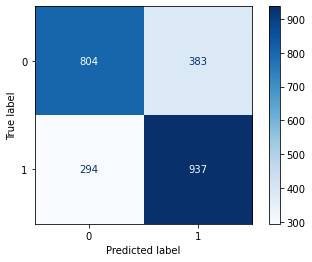

In [52]:
preds = lr.predict(Ztest)

tn, fp, fn, tp = confusion_matrix(yport_test, preds).ravel()
plot_confusion_matrix(lr, Ztest, yport_test, cmap='Blues');

In [53]:
lr2 = LogisticRegressionCV(random_state=42,penalty = 'l2',max_iter = 100000,
                              solver = 'liblinear',Cs=np.logspace(-5,5,101), cv = 5,verbose = 10,n_jobs=1)
lr2.fit(Ztrain,yport_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  3.1min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  6.3min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  9.5min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed: 12.6min remaining:    0.0s


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 15.6min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 15.6min finished


[LibLinear]

LogisticRegressionCV(Cs=array([1.00000000e-05, 1.25892541e-05, 1.58489319e-05, 1.99526231e-05,
       2.51188643e-05, 3.16227766e-05, 3.98107171e-05, 5.01187234e-05,
       6.30957344e-05, 7.94328235e-05, 1.00000000e-04, 1.25892541e-04,
       1.58489319e-04, 1.99526231e-04, 2.51188643e-04, 3.16227766e-04,
       3.98107171e-04, 5.01187234e-04, 6.30957344e-04, 7.94328235e-04,
       1.00000000e-03, 1.25...
       1.00000000e+03, 1.25892541e+03, 1.58489319e+03, 1.99526231e+03,
       2.51188643e+03, 3.16227766e+03, 3.98107171e+03, 5.01187234e+03,
       6.30957344e+03, 7.94328235e+03, 1.00000000e+04, 1.25892541e+04,
       1.58489319e+04, 1.99526231e+04, 2.51188643e+04, 3.16227766e+04,
       3.98107171e+04, 5.01187234e+04, 6.30957344e+04, 7.94328235e+04,
       1.00000000e+05]),
                     cv=5, max_iter=100000, n_jobs=1, random_state=42,
                     solver='liblinear', verbose=10)

In [54]:
lr2.score(Ztrain, yport_train), lr2.score(Ztest, yport_test),lr2.C_

(0.9705243561898852, 0.7196029776674938, array([1.99526231e-05]))

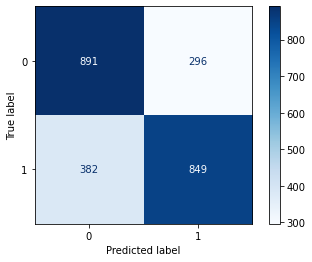

In [55]:
preds = lr2.predict(Ztest)

tn, fp, fn, tp = confusion_matrix(yport_test, preds).ravel()
plot_confusion_matrix(lr2, Ztest, yport_test, cmap='Blues');

In [ ]:
{'cvec__max_features': 7000,
 'cvec__min_df': 4,
 'cvec__ngram_range': (1, 3),
 'cvec__stop_words': ['dad',
  'son',
  'daughter',
  'son',
  'anti',
  'antijokes',
  'antijoke'],
 'lr__max_iter': 100000,
 'lr__penalty': 'none',
 'lr__solver': 'sag'}